# Check results

In [73]:
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1 import make_axes_locatable
from pathlib import Path
import pandas as pd
import numpy as np
from astropy.io import fits
from astropy.constants import c, e, m_e
import astropy.units as u
from sklearn.metrics import root_mean_squared_error as rmse
from scipy.stats import pearsonr
import torch
import sys
sys.path.append('../')
from modules.nn_models import InversionModel
from modules.train_test_utils import *

In [74]:
images_path = Path("../images/seventh_experiment")
if not images_path.exists():
    images_path.mkdir(parents=True)

In [75]:
plt.rcParams.update({
  'axes.titlesize': 'x-large',  # heading 1
  'axes.labelsize': 'large',   # heading 2
  'xtick.labelsize': 'medium',         # fontsize of the ticks
  'ytick.labelsize': 'medium',         # fontsize of the ticks
  'font.family': 'serif',        # Font family
  'text.usetex': False,          # Do not use LaTeX for text rendering
  'figure.figsize': (10, 8),     # Default figure size
  'savefig.dpi': 300,            # High resolution for saving figures
  'savefig.format': 'png',       # Default format for saving figures
  'legend.fontsize': 'medium',  # Font size for legends
  'lines.linewidth': 2,          # Line width for plots
  'lines.markersize': 8,         # Marker size for plots,
  'axes.formatter.useoffset': False,  # Disable offset
  'axes.formatter.use_mathtext': True,  # Use scientific notation
  'axes.formatter.limits': (-3, 4),  # Use scientific notation for values over 10^2
  'axes.labelsize': 'large',     # Font size for axes labels
  'figure.titlesize': 'xx-large', # Font size for suptitles (heading 1)
  'axes.formatter.use_locale': False  # Do not use locale settings
})

## 1. Upload validation data

### 1.1 MURaM

For checking the results we are going to check just one sample file (087000 snapshot) that was left out of the training dataset.

**Note:** In case you are interested on using other simulation snapshots, it is enough to include them in the define list.

In [76]:
filename = "087000"

Some hyperparameters for preprocessing the data are necessary to be defined.

In [77]:
nx = 480 # Number of pixels in the x-direction
ny = 480 # Number of pixels in the y-direction
noise_level = 5.9e-4 #Hinode noise level (2016 - A. Lagg)
new_logtau = np.arange(-2.0, 0+0.1, 0.1) # New log(tau) grid
stokes_weights = [1,100,100,10] # Weights for the Stokes parameters

In this experiment we are interested on analyzing the results of two type of models. One trained on data that has spatial convolution applied with the respective PSF of the Hinode SOT instrument while the other was trained without the application of this convolution. We are going to charge the data with this two conditions.

In [78]:
# Setup device agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Tensors stored in: {device}")

Tensors stored in: cuda


In [79]:
from modules.data_utils import load_data_cubes_no_spatial, load_data_cubes_complete_hinode

# List of model options to load data for
model_options = ["complete_hinode", "no_spatial"]

#dictionary for storing the data corresponding to each model
data_dict = {}

# Load the data for each model option
for i, data_function in enumerate([load_data_cubes_complete_hinode, load_data_cubes_no_spatial]):
    
    #Print the function name for clarity
    function_name = model_options[i] 
    print(f"Loading data for {function_name}...")

    # Load the data with the respective function
    ## NOTE: For this experiment we avoided the resampling for the spatial dimension, then the new_nx and new_ny are the same as the original nx and ny.
    
    atm_data, stokes_data, mags_names, phys_maxmin, new_nx, new_ny = data_function([filename], 
                                                                        ptm = "/scratchsan/observatorio/juagudeloo/data",
                                                                        noise_level=noise_level,
                                                                        new_logtau=new_logtau,
                                                                        stokes_weights=stokes_weights,
                                                                        make_plots=False)
    
    # Store data in dictionary
    data_dict[function_name] = {
        # 'atm_data': atm_data, # Atmospheric data
        # 'stokes_data': stokes_data, # Stokes data
        'mags_names': mags_names, # Names of the atmospheric physical quantities
        'phys_maxmin': phys_maxmin, # Physical maximum and minimum values for normalization of each atmospheric quantity
        'new_nx': new_nx, # New number of pixels in the x-direction ()
        'new_ny': new_ny
    }
    
    # Process data for each filename
    for j, filename in enumerate([filename]):
        # Descale atm data
        atm_data_original_muram = np.reshape(np.copy(atm_data[j]), (new_nx, new_ny, new_logtau.shape[0],4)) # Reshape atmospheric data with shape (nx, ny, n_logtau, 4)
        atm_data_original_muram = descale_atm(atm_data_original_muram, phys_maxmin) # Descale atmospheric data
        atm_data_original_muram[..., 2] /= 1e5 # Convert velocity from cm/s to km/s
        
        # Load model and charge corresponding stokes data
        stokes_data_original_muram = np.reshape(np.copy(stokes_data[j]), 
                                                (stokes_data[j].shape[0]*stokes_data[j].shape[1], 
                                                 stokes_data[j].shape[2],
                                                 stokes_data[j].shape[3])
                                                 ) # Reshape stokes data with shape (nx*ny, n_lambda, 4)
        stokes_data_original_muram = np.moveaxis(stokes_data_original_muram, 1, 2) # Move the lambda axis to the last position
        
        # Store processed data in dictionary
        data_dict[function_name][f'atm_data_original_muram_{filename}'] = atm_data_original_muram
        data_dict[function_name][f'stokes_data_original_muram_{filename}'] = stokes_data_original_muram


Loading data for complete_hinode...
new_logtau: [-2.00000000e+00 -1.90000000e+00 -1.80000000e+00 -1.70000000e+00
 -1.60000000e+00 -1.50000000e+00 -1.40000000e+00 -1.30000000e+00
 -1.20000000e+00 -1.10000000e+00 -1.00000000e+00 -9.00000000e-01
 -8.00000000e-01 -7.00000000e-01 -6.00000000e-01 -5.00000000e-01
 -4.00000000e-01 -3.00000000e-01 -2.00000000e-01 -1.00000000e-01
  1.77635684e-15]

                ######################## 
                Reading 087000 MuRAM data...
                ######################## 
                      
Charging temperature ...


Charge velocity...
Charging magnetic field vector...

                ######################## 
                Finished!
                ######################## 
                      
Creating atmosphere quantities array...
Created!
Charging stokes vectors...
Charged!
Keeping only the LOS component of the magnetic field...
atm_quant shape: (480, 480, 256, 4)
Loading optical depth stratification...
Loaded from /scratchsan/observatorio/juagudeloo/data/geom_height/logtau_087000.npy
Done!
Mapping to new optical depth stratification...


100%|██████████| 480/480 [00:06<00:00, 68.87it/s]


Loaded!
Spatially convolving the Stokes parameters...


100%|██████████| 300/300 [00:03<00:00, 87.31it/s]


Spectrally convolving the Stokes parameters...


100%|██████████| 4/4 [00:02<00:00,  1.60it/s]


Interpolating Stokes parameters to Hinode/SP wavelengths...


100%|██████████| 4/4 [00:11<00:00,  2.83s/it]


Scaling the quantities...
Normalizing the Stokes parameters by the continuum...
calculating the continuum...
Scaled!


100%|██████████| 480/480 [00:05<00:00, 80.34it/s]


Loading data for no_spatial...
new_logtau: [-2.00000000e+00 -1.90000000e+00 -1.80000000e+00 -1.70000000e+00
 -1.60000000e+00 -1.50000000e+00 -1.40000000e+00 -1.30000000e+00
 -1.20000000e+00 -1.10000000e+00 -1.00000000e+00 -9.00000000e-01
 -8.00000000e-01 -7.00000000e-01 -6.00000000e-01 -5.00000000e-01
 -4.00000000e-01 -3.00000000e-01 -2.00000000e-01 -1.00000000e-01
  1.77635684e-15]

                ######################## 
                Reading 087000 MuRAM data...
                ######################## 
                      
Charging temperature ...
Charge velocity...
Charging magnetic field vector...

                ######################## 
                Finished!
                ######################## 
                      
Creating atmosphere quantities array...
Created!
Charging stokes vectors...
Charged!
Keeping only the LOS component of the magnetic field...
atm_quant shape: (480, 480, 256, 4)
Loading optical depth stratification...
Loaded from /scratchsan/observat

100%|██████████| 480/480 [00:06<00:00, 69.82it/s]


Loaded!
Spectrally convolving the Stokes parameters...


100%|██████████| 4/4 [00:02<00:00,  1.58it/s]


Interpolating Stokes parameters to Hinode/SP wavelengths...


100%|██████████| 4/4 [00:10<00:00,  2.62s/it]


Scaling the quantities...
Normalizing the Stokes parameters by the continuum...
calculating the continuum...
Scaled!


100%|██████████| 480/480 [00:05<00:00, 80.45it/s]


In [80]:
mags_names

['$T$', '$\\log(\\rho)$', '$v_{z}$', '$B_\\text{LOS}$']

Let's plot the same MODEST nodes from the MURaM data ($\log \tau = -2.0, -0.8, 0.0$)

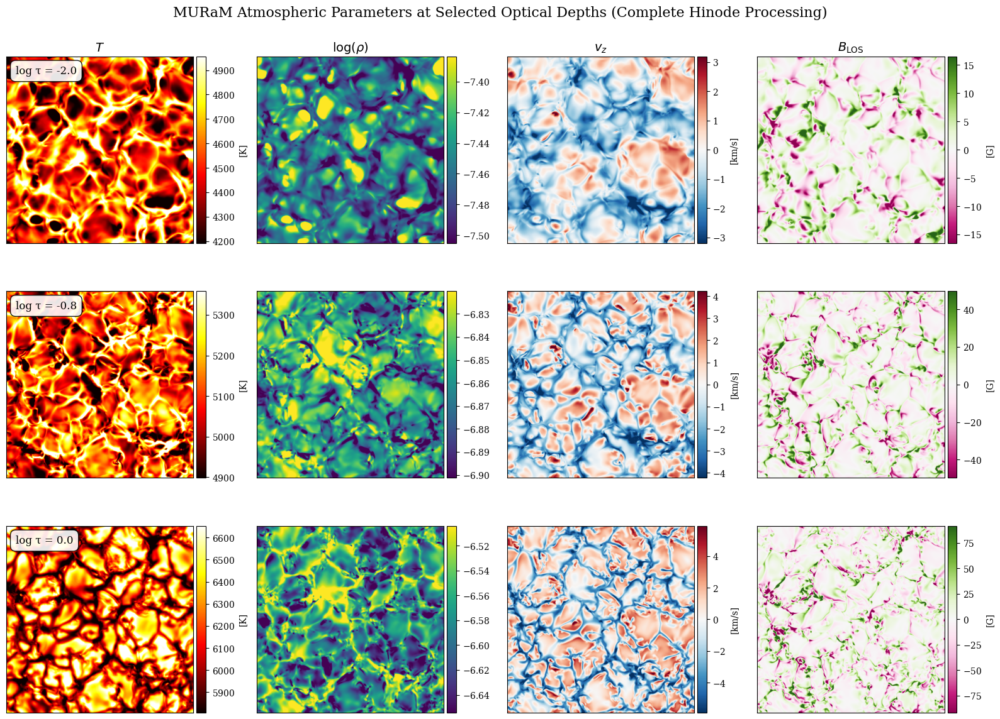

In [81]:
# Get the MURaM atmospheric data for complete_hinode processing
atm_data_muram = data_dict['complete_hinode'][f'atm_data_original_muram_{filename}']

# Select the indices 0, 12, and -1 from the third axis (optical depth dimension)
selected_indices = [0, 12, -1]
selected_tau_values = [new_logtau[idx] for idx in selected_indices]

# Create a 3x4 subplot (3 optical depths x 4 atmospheric parameters)
fig, axes = plt.subplots(3, 4, figsize=(16, 12))

# Atmospheric parameter labels - corrected order to match mags_names
atm_labels = mags_names
colormaps = ['hot', 'viridis', 'RdBu_r', 'PiYG']

# Loop through each selected optical depth (rows)
for row, (tau_idx, tau_val) in enumerate(zip(selected_indices, selected_tau_values)):
    # Loop through each atmospheric parameter (columns)
    for col in range(4):
        ax = axes[row, col]
        
        # Get the data for this combination
        data = atm_data_muram[:, :, tau_idx, col]
        
        # Calculate appropriate color limits
        if col == 0:  # Temperature
            vmin = np.quantile(data, 0.05)
            vmax = np.quantile(data, 0.95)
        elif col == 1:  # log(ρ)
            vmin = np.quantile(data, 0.05)
            vmax = np.quantile(data, 0.95)
        elif col == 2:  # Velocity
            vmin = np.quantile(data, 0.01)
            vmax = np.quantile(data, 0.99)
            # Make symmetric for velocity
            if np.abs(vmin) > np.abs(vmax):
                vmax = np.abs(vmin)
            else:
                vmin = -np.abs(vmax)
        else:  # B_LOS
            vmin = np.quantile(data, 0.01)
            vmax = np.quantile(data, 0.99)
            # Make symmetric for magnetic field
            if np.abs(vmin) > np.abs(vmax):
                vmax = np.abs(vmin)
            else:
                vmin = -np.abs(vmax)
        
        # Create the image
        im = ax.imshow(data, cmap=colormaps[col], origin='lower', vmin=vmin, vmax=vmax)
        
        # Set labels and title
        if row == 0:  # Top row gets column titles
            ax.set_title(atm_labels[col], fontsize=14)
        
        # Add semi-transparent square with tau value for temperature plots only
        if col == 0:
            textstr = f'log τ = {tau_val:.1f}'
            props = dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9)
            ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=12,
                   verticalalignment='top', bbox=props)
        
        # Remove tick labels for cleaner appearance
        ax.set_xticks([])
        ax.set_yticks([])
        
        # Add colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = plt.colorbar(im, cax=cax)
        
        # Set colorbar label with appropriate units
        if col == 0:
            cbar.set_label('[K]', fontsize=10)
        elif col == 1:
            cbar.set_label('', fontsize=10)  # log(ρ) is dimensionless
        elif col == 2:
            cbar.set_label('[km/s]', fontsize=10)
        else:
            cbar.set_label('[G]', fontsize=10)

muram_images_dir = images_path / "Orig_muram"
muram_images_dir.mkdir(parents=True, exist_ok=True)

plt.suptitle('MURaM Atmospheric Parameters at Selected Optical Depths (Complete Hinode Processing)', fontsize=16)
plt.tight_layout()
plt.savefig(muram_images_dir / "muram_atmospheric_parameters_selected_depths.png", dpi=300, bbox_inches='tight')
plt.show()


### 1.2 MODEST

Apart of the validation dataset generated with the MURaM simulation code, we are interested on using observational data for testing whether or not our model is useful for being applied in real life scenarios. For doing this, we will use one snapshot of an active region (AR) from the MODEST catalog data. 

For the selected snapshot we are going to define a region that contains only quiet-sun features since those are the features represented in the MURaM simulation data used for training the model.

In [82]:
# REGION BOUNDARIES
y_start, y_end = 0, 100
x_start, x_end = 500, 700
NX = x_end - x_start
NY = y_end - y_start

#### 1.2.1 Continuum

First let's charge the continuum data. We will use this image for showing out our region of interest and it will include an arrow pointing to the disk center.

In [83]:
# Load the continuum data
with fits.open("../../data/hinode-MODEST/INV_560_AR11967/continuum.fits") as hdul:
    continuum = hdul[0].data
    cont_header = hdul[0].header

For creating the arrow we must use the information corresponding to the MODEST 0560 snapshot, where its center is at $(16''.0, -126''.0)$ with a pixel size of $0''.32$ for being in Fast Mode scan.

In [84]:
# Field of view information from MODEST catalog
y_center_fov_arcsec = -126.0  # arcseconds (heliocentric coordinates)
x_center_fov_arcsec = 16.0  # arcseconds (heliocentric coordinates) 
fov_width_arcsec = 254.0  # arcseconds
fov_height_arcsec = 124.0  # arcseconds

# Hinode/SP pixel scale
pixel_scale = 0.32  # arcsec/pixel

# Calculate FOV center in pixel coordinates (center of image)
x_center_fov_pixel = continuum.shape[1] / 2  
y_center_fov_pixel = continuum.shape[0] / 2  

# Calculate solar disk center location
# Disk center is at (0", 0") in heliocentric coordinates
# So relative to FOV center: disk_center = (0, 0) - (x_fov, y_fov)
x_disk_offset_arcsec = 0 - x_center_fov_arcsec  # = 16" to the left
y_disk_offset_arcsec = 0 - y_center_fov_arcsec  # = 126" upward
print(f"Disk offset (arcsec): ({x_disk_offset_arcsec}, {y_disk_offset_arcsec})")

# Convert to pixel offsets
x_disk_offset_pixels = x_disk_offset_arcsec / pixel_scale  
y_disk_offset_pixels = y_disk_offset_arcsec / pixel_scale  
print(f"Disk offset (pixels): ({x_disk_offset_pixels}, {y_disk_offset_pixels})")

# Calculate disk center position in image coordinates
x_disk_center = x_center_fov_pixel + x_disk_offset_pixels
y_disk_center = y_center_fov_pixel + y_disk_offset_pixels
print(f"Disk center position in image coordinates: ({x_disk_center}, {y_disk_center})")

# Calculate arrow parameters for pointing to disk center
arrow_start_x = 800  # Starting x position for arrow
arrow_start_y = 400  # Starting y position for arrow
arrow_dx = x_disk_offset_pixels/10   # Arrow x direction component
arrow_dy = y_disk_offset_pixels/10    # Arrow y direction component

Disk offset (arcsec): (-16.0, 126.0)
Disk offset (pixels): (-50.0, 393.75)
Disk center position in image coordinates: (379.0, 588.75)


Additionally, for plotting an example of how the stokes profiles we will select a sample pixel that lays in the selected region.

In [85]:
# Select the region from the continuum data
region_continuum = continuum[y_start:y_end, x_start:x_end]

# Find the coordinates of the darkest pixel in the selected region
min_idx = np.unravel_index(np.argmin(region_continuum), region_continuum.shape)
sample_y, sample_x = min_idx

print(f"Darkest pixel coordinates in region: ({sample_x}, {sample_y})")
print(f"Continuum intensity at darkest pixel: {region_continuum[sample_y, sample_x]:.4f}")

Darkest pixel coordinates in region: (10, 43)
Continuum intensity at darkest pixel: 0.5917


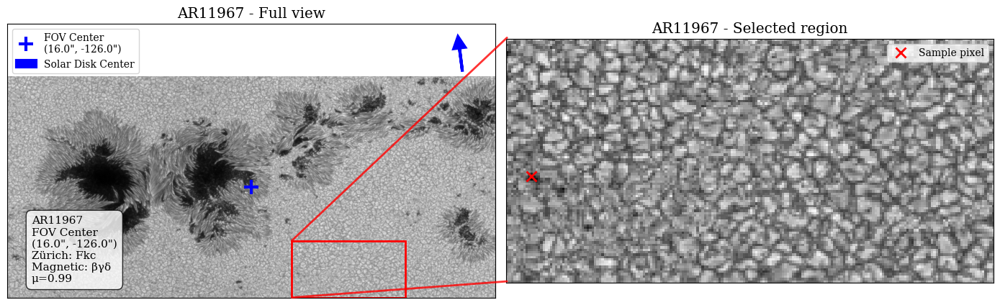

In [86]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot full image with corrected orientation (origin='lower')
ax1.imshow(continuum, cmap='gray', origin='lower')
rect = plt.Rectangle((x_start, y_start), x_end-x_start, y_end-y_start, 
                     linewidth=2, edgecolor='r', facecolor='none')
ax1.add_patch(rect)

# Mark the field of view center
ax1.plot(x_center_fov_pixel, y_center_fov_pixel, 'b+', markersize=15, markeredgewidth=3, 
         label=f'FOV Center\n({x_center_fov_arcsec}", {y_center_fov_arcsec}")')

# Check if disk center is visible in the image and mark accordingly
if 0 <= x_disk_center <= continuum.shape[1] and 0 <= y_disk_center <= continuum.shape[0]:
    # Mark the solar disk center with a cross if it's inside the image
    ax1.plot(x_disk_center, y_disk_center, 'r+', markersize=15, markeredgewidth=3,
             label='Solar Disk Center\n(0", 0")')
else:
    # Use the same arrow as plotted in the previous cell
    ax1.arrow(arrow_start_x, arrow_start_y, arrow_dx, arrow_dy, 
              head_width=20, head_length=20, fc='blue', ec='blue', linewidth=3,
              label='Solar Disk Center')

ax1.legend()
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_title(f"AR11967 - Full view")

# Plot zoomed region in second subplot (also flipped)
ax2.imshow(continuum[y_start:y_end, x_start:x_end], cmap='gray', origin='lower')
# Add semitransparent square with active region information in the left plot
textstr = f'AR11967\nFOV Center\n({x_center_fov_arcsec}", {y_center_fov_arcsec}")\nZürich: Fkc\nMagnetic: βγδ\nμ=0.99'
props = dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8)
ax1.text(0.05, 0.05, textstr, transform=ax1.transAxes, fontsize=11,
         verticalalignment='bottom', bbox=props)

ax2.set_xticks([])
ax2.set_yticks([])
ax2.set_title(f"AR11967 - Selected region")
# Mark the sample pixel in the zoomed region
ax2.plot(sample_x, sample_y, 'rx', markersize=10, markeredgewidth=2, 
         label=f'Sample pixel')
ax2.legend()
# Update connecting lines for correct coordinates
con1 = ConnectionPatch(
    xyA=(0, 0), coordsA=ax2.transData,
    xyB=(x_start, y_start), coordsB=ax1.transData,
    color='r', linestyle='-', linewidth=2.0, alpha=0.8)

con2 = ConnectionPatch(
    xyA=(0, y_end-y_start), coordsA=ax2.transData,
    xyB=(x_start, y_end), coordsB=ax1.transData,
    color='r', linestyle='-', linewidth=2.0, alpha=0.8)

fig.add_artist(con1)
fig.add_artist(con2)

plt.tight_layout()

# Create directory if it doesn't exist
modest_images_dir = Path("../images/seventh_experiment/Hinode_MODEST/")
if not modest_images_dir.exists():
    modest_images_dir.mkdir(parents=True)

fig.savefig(modest_images_dir / "continuum_with_zoom_and_center.png", dpi=300, bbox_inches='tight')


#### 1.2.2 Observed Stokes data

The next data to upload is that of the observed stokes data. For plotting appropiately this data for the 112 spectral points Hinode is able to measure, it is necessary to create an array with this spectral sampling data.

In [87]:
# Parameters from Hinode/SP FITS header (typical values)
NAXIS1 = 112       # Number of spectral points
CRVAL1 = 6302.0    # Ångstroms - central wavelength
CDELT1 = 0.0215    # Å/pixel - spectral resolution
CRPIX1 = 57        # Reference pixel - this is the pixel where the central wavelength is located (1-based index)

# Wavelength array calculation
wl = CRVAL1 + (np.arange(1, NAXIS1 + 1) - CRPIX1) * CDELT1
wl = wl * u.Angstrom

In [88]:
# Load the observed stokes 
with fits.open("../../data/hinode-MODEST/INV_560_AR11967/inverted_obs.1.fits") as hdul:
    obs_stokes = hdul[0].data
    obs_stokes = obs_stokes[:, :, [0,2,3,1], :] # Reorder the Stokes parameters to match the expected order (I, Q, U, V)
    obs_stokes_header = hdul[0].header

It is important to use two cases since both are of interest in this study, which are those of observed and deconvolved Stokes.

In [89]:
# Add this code after loading the MODEST Stokes data and before applying the models

# Load the Hinode PSF for deconvolution
print("Loading Hinode PSF for deconvolution...")
with fits.open("../../data/hinode-MODEST/PSFs/hinode_psf_bin.0.16.fits") as hdul:
    psf_header = hdul[0].header
    hinode_psf = hdul[0].data

# Ensure PSF is properly formatted
hinode_psf = np.ascontiguousarray(hinode_psf, dtype=np.float32)
hinode_psf = hinode_psf / hinode_psf.sum()  # Normalize PSF

Loading Hinode PSF for deconvolution...


In [90]:
from skimage import restoration

def deconvolve_stokes_data(stokes_data, psf):
    """
    Deconvolve Stokes data using Wiener deconvolution.
    
    Parameters:
    -----------
    stokes_data : numpy.ndarray
        4D array with shape (ny, nx, 4, nwavelength) containing Stokes parameters
    psf : numpy.ndarray
        2D PSF array for deconvolution
        
    Returns:
    --------
    deconvolved_stokes : numpy.ndarray
        Deconvolved Stokes data with same shape as input
    """
    ny, nx, n_stokes, n_wavelength = stokes_data.shape
    deconvolved_stokes = np.zeros_like(stokes_data)
    
    print(f"Deconvolving Stokes data with shape: {stokes_data.shape}")
    print(f"Using PSF with shape: {psf.shape}")
    
    # Deconvolve each wavelength point and Stokes parameter separately
    for wave_idx in range(n_wavelength):
        if wave_idx % 20 == 0:  # Progress indicator
            print(f"Processing wavelength {wave_idx+1}/{n_wavelength}")
            
        for stokes_idx in range(n_stokes):
            # Extract 2D image for this wavelength and Stokes parameter
            image_2d = stokes_data[:, :, stokes_idx, wave_idx]
            
            # Use Wiener deconvolution (removed the noise parameter)
            deconvolved_image = wiener_deconv(image_2d, psf)
            
            # Store result
            deconvolved_stokes[:, :, stokes_idx, wave_idx] = deconvolved_image
    
    return deconvolved_stokes

def wiener_deconv(image, psf, noise_level=0.01):
    """
    Wiener deconvolution algorithm
    """
    from scipy.fft import fft2, ifft2, fftshift
    
    # Pad the PSF to match image size
    psf_padded = np.zeros_like(image)
    psf_center = (psf.shape[0] // 2, psf.shape[1] // 2)
    img_center = (image.shape[0] // 2, image.shape[1] // 2)
    
    y_start = img_center[0] - psf_center[0]
    y_end = y_start + psf.shape[0]
    x_start = img_center[1] - psf_center[1]
    x_end = x_start + psf.shape[1]
    
    psf_padded[y_start:y_end, x_start:x_end] = psf
    psf_padded = fftshift(psf_padded)
    
    # FFT of image and PSF
    img_fft = fft2(image)
    psf_fft = fft2(psf_padded)
    
    # Wiener filter
    psf_conj = np.conj(psf_fft)
    psf_abs_sq = np.abs(psf_fft)**2
    
    # Avoid division by zero
    wiener_filter = psf_conj / (psf_abs_sq + noise_level)
    
    # Apply filter and inverse FFT
    result_fft = img_fft * wiener_filter
    result = np.real(ifft2(result_fft))
    
    return result

# Apply deconvolution to the observed Stokes data
print("Starting deconvolution of observed Stokes data...")
deconvolved_obs_stokes = deconvolve_stokes_data(obs_stokes, hinode_psf)

print("Deconvolution completed!")


Starting deconvolution of observed Stokes data...
Deconvolving Stokes data with shape: (390, 858, 4, 112)
Using PSF with shape: (61, 61)
Processing wavelength 1/112


Processing wavelength 21/112
Processing wavelength 41/112
Processing wavelength 61/112
Processing wavelength 81/112
Processing wavelength 101/112
Deconvolution completed!


In [91]:
# Create dictionary to store MODEST Stokes data for both processing types
modest_stokes_dict = {}

# Extract the MODEST data for the selected region
obs_stokes_region = obs_stokes[y_start:y_end, x_start:x_end, :, :]
deconvolved_obs_stokes_region = deconvolved_obs_stokes[y_start:y_end, x_start:x_end, :, :]

# Store the data for both processing types
modest_stokes_dict['complete_hinode'] = {
    'stokes_data': obs_stokes_region,  # Original observed data (with spatial convolution)
    'description': 'Observed MODEST Stokes data with spatial convolution effects'
}

modest_stokes_dict['no_spatial'] = {
    'stokes_data': deconvolved_obs_stokes_region,  # Deconvolved data (spatial effects removed)
    'description': 'Deconvolved MODEST Stokes data with spatial effects removed'
}

# Print information about the created dictionary
print("Created modest_stokes_dict with the following structure:")
for process_type in model_options:
    stokes_data = modest_stokes_dict[process_type]['stokes_data']
    print(f"\n{process_type}:")
    print(f"  Shape: {stokes_data.shape}")
    print(f"  Description: {modest_stokes_dict[process_type]['description']}")
    print(f"  Data type: {stokes_data.dtype}")
    print(f"  Value range: {stokes_data.min():.6f} to {stokes_data.max():.6f}")

Created modest_stokes_dict with the following structure:

complete_hinode:
  Shape: (100, 200, 4, 112)
  Description: Observed MODEST Stokes data with spatial convolution effects
  Data type: >f4
  Value range: -0.157242 to 1.227529

no_spatial:
  Shape: (100, 200, 4, 112)
  Description: Deconvolved MODEST Stokes data with spatial effects removed
  Data type: >f4
  Value range: -0.330538 to 1.562846


Let's plot both the sample pixel shown in the continuum image and the stokes parameters corresponding to one specific wavelength value.

In [92]:
# Select a sample wavelength based on the mininum of the Stokes I profile
sample_wavelength_idx = np.argmin(obs_stokes[sample_x, sample_y,0,:])-6

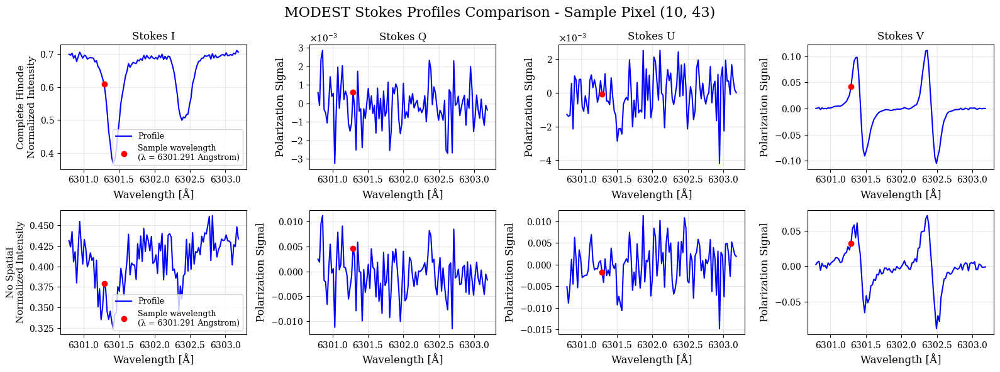


Sample pixel (10, 43) Stokes data comparison:

Stokes I:
  complete_hinode: min=0.368193, max=0.710931
  no_spatial: min=0.324600, max=0.461327

Stokes Q:
  complete_hinode: min=-0.003243, max=0.002856
  no_spatial: min=-0.011483, max=0.011202

Stokes U:
  complete_hinode: min=-0.004193, max=0.002522
  no_spatial: min=-0.014778, max=0.011285

Stokes V:
  complete_hinode: min=-0.104929, max=0.110957
  no_spatial: min=-0.088500, max=0.071639


In [93]:
# Extract the stokes data for the sample pixel from both processing types
fig, axes = plt.subplots(2, 4, figsize=(16, 6))

# Stokes labels for the plots
stokes_labels = ['Stokes I', 'Stokes Q', 'Stokes U', 'Stokes V']

# Process both types of MODEST data
for row, process_type in enumerate(model_options):
    # Get the appropriate Stokes data for this processing type
    stokes_data = modest_stokes_dict[process_type]['stokes_data']
    
    # Extract the sample pixel data
    sample_pixel_stokes = stokes_data[sample_y, sample_x, :, :]
    
    for col, (label) in enumerate(stokes_labels):
        ax = axes[row, col]
        
        # Plot the full profile
        ax.plot(wl, sample_pixel_stokes[col, :], 'b-', linewidth=1.5, 
                label='Profile')
        
        # Add red dot at sample_wavelength_idx
        ax.plot(wl[sample_wavelength_idx], sample_pixel_stokes[col, sample_wavelength_idx], 
                'ro', markersize=6, label=f'Sample wavelength\n(λ = {wl[sample_wavelength_idx]:.3f})')
        
        # Set title for top row only
        if row == 0:
            ax.set_title(f'{label}', fontsize=12)
        
        # Add processing type label on the left
        if col == 0:
            ax.set_ylabel(f'{process_type.replace("_", " ").title()}\nIntensity', fontsize=11)
        else:
            ax.set_ylabel('Intensity')
        
        ax.set_xlabel('Wavelength [Å]')
        ax.grid(True, alpha=0.3)
        
        # Add legend only to the first subplot of each row
        if col == 0:
            ax.legend(loc='best', fontsize=9)
        
        # Set appropriate y-axis labels for each Stokes parameter
        if col == 0:  # Stokes I
            ax.set_ylabel(f'{process_type.replace("_", " ").title()}\nNormalized Intensity', fontsize=11)
        else:  # Stokes Q, U, V
            if col == 0:  # Only for leftmost column
                ax.set_ylabel(f'{process_type.replace("_", " ").title()}\nPolarization Signal', fontsize=11)
            else:
                ax.set_ylabel('Polarization Signal')

plt.suptitle(f'MODEST Stokes Profiles Comparison - Sample Pixel ({sample_x}, {sample_y})', fontsize=16)
plt.tight_layout()
plt.savefig(modest_images_dir / "modest_sample_pixel_stokes_profiles_comparison.png", dpi=300, bbox_inches='tight')
plt.show()

# Print comparison statistics
print(f"\nSample pixel ({sample_x}, {sample_y}) Stokes data comparison:")
for i, stokes_name in enumerate(stokes_labels):
    print(f"\n{stokes_name}:")
    for process_type in model_options:
        stokes_data = modest_stokes_dict[process_type]['stokes_data']
        sample_pixel_data = stokes_data[sample_y, sample_x, i, :]
        print(f"  {process_type}: min={sample_pixel_data.min():.6f}, max={sample_pixel_data.max():.6f}")

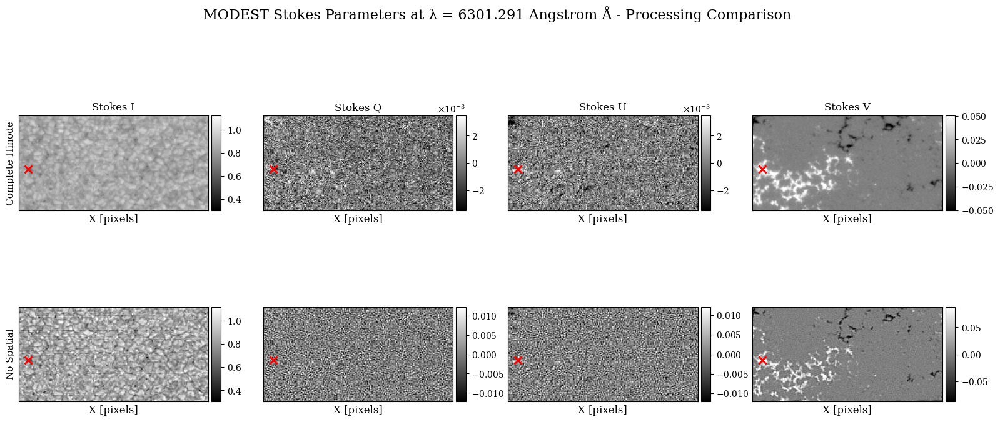


MODEST Stokes data comparison at wavelength λ = 6301.291 Angstrom Å:
Continuum color scale: 0.303199 to 1.119949

Stokes I:
  complete_hinode: min=0.609120, max=1.017048
    Sample pixel value: 0.609120
  no_spatial: min=0.268099, max=1.359772
    Sample pixel value: 0.379140

Stokes Q:
  complete_hinode: min=-0.006117, max=0.007452
    Sample pixel value: 0.000592
  no_spatial: min=-0.022800, max=0.026212
    Sample pixel value: 0.004646

Stokes U:
  complete_hinode: min=-0.007653, max=0.006612
    Sample pixel value: -0.000054
  no_spatial: min=-0.023625, max=0.023352
    Sample pixel value: -0.001823

Stokes V:
  complete_hinode: min=-0.067087, max=0.082604
    Sample pixel value: 0.042118
  no_spatial: min=-0.144368, max=0.194159
    Sample pixel value: 0.032699


In [94]:
# Create plots for both MODEST processing types
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

# Calculate vmin and vmax from the full continuum image for consistency
cont_vmin = np.quantile(continuum, 0.05)
cont_vmax = np.quantile(continuum, 0.95)

# Process both types of MODEST data
for row, process_type in enumerate(model_options):
    # Get the appropriate Stokes data for this processing type
    stokes_data = modest_stokes_dict[process_type]['stokes_data']
    
    # Extract data at the sample wavelength
    stokes_region_sample = stokes_data[:, :, :, sample_wavelength_idx]
    
    for col, label in enumerate(stokes_labels):
        ax = axes[row, col]
        
        # Use consistent color scale for all Stokes parameters based on full continuum
        if col == 0:  # Stokes I - use continuum limits
            vmin, vmax = cont_vmin, cont_vmax
        else:  # Stokes Q, U, V - use symmetric limits based on data
            data_sample = stokes_region_sample[:, :, col]
            abs_max = np.max(np.abs([np.quantile(data_sample, 0.01), np.quantile(data_sample, 0.99)]))
            vmin, vmax = -abs_max, abs_max
        
        # Create the image
        im = ax.imshow(stokes_region_sample[:, :, col], cmap='gray', origin='lower', 
                      vmin=vmin, vmax=vmax)
        
        # Set title for top row only
        if row == 0:
            ax.set_title(label, fontsize=12)
        
        # Add processing type label on the left
        if col == 0:
            ax.set_ylabel(f'{process_type.replace("_", " ").title()}', fontsize=11)
        
        ax.set_xlabel('X [pixels]')
        ax.set_xticks([])
        ax.set_yticks([])
        
        # Mark the sample pixel in each subplot
        ax.plot(sample_x, sample_y, 'rx', markersize=8, markeredgewidth=2)
        
        # Add colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

plt.suptitle(f'MODEST Stokes Parameters at λ = {wl[sample_wavelength_idx]:.3f} Å - Processing Comparison', fontsize=16)
plt.tight_layout()
plt.savefig(modest_images_dir / "modest_stokes_parameters_processing_comparison.png", dpi=300, bbox_inches='tight')
plt.show()

# Print comparison statistics
print(f"\nMODEST Stokes data comparison at wavelength λ = {wl[sample_wavelength_idx]:.3f} Å:")
print(f"Continuum color scale: {cont_vmin:.6f} to {cont_vmax:.6f}")
for i, stokes_name in enumerate(stokes_labels):
    print(f"\n{stokes_name}:")
    for process_type in model_options:
        stokes_data = modest_stokes_dict[process_type]['stokes_data']
        stokes_sample = stokes_data[:, :, i, sample_wavelength_idx]
        print(f"  {process_type}: min={stokes_sample.min():.6f}, max={stokes_sample.max():.6f}")
        print(f"    Sample pixel value: {stokes_sample[sample_y, sample_x]:.6f}")

#### 1.2.4 Fitted Stokes 

The observed stokes are still not useful for applying inversion procedures since they are still too noisy. Then, it is necessary to apply a fitting procedure to obtain the approximated shape of the actual stokes profiles without noise, also obtaining a better spectral sampling.

In [95]:
with fits.open("../../data/hinode-MODEST/INV_560_AR11967/inverted_profs.1.fits") as hdul:
    inverted_profs = hdul[0].data
    inverted_profs = inverted_profs[:, :, [0,2,3,1], :]  # Reorder the Stokes parameters to match the expected order (I, Q, U, V)
    invprofs_header = hdul[0].header

It is necessary to define a new `wl` variable with 250 spectral points in the same Hinode instrument spectral window.

In [96]:
# Create wavelength array for inverted profiles (250 points)
# Assuming same central wavelength and similar spectral range but higher resolution
NAXIS1_inv = 250
CRVAL1_inv = 6302.0    # Same central wavelength
# Calculate spectral resolution to cover similar range as obs_stokes
spectral_range = (wl[-1] - wl[0]).value  # Total range from obs_stokes
CDELT1_inv = spectral_range / (NAXIS1_inv - 1)  # Resolution for 250 points
CRPIX1_inv = 125       # Reference pixel (middle)

# Wavelength array for inverted profiles
wl_inv = CRVAL1_inv + (np.arange(1, NAXIS1_inv + 1) - CRPIX1_inv) * CDELT1_inv
wl_inv = wl_inv * u.Angstrom

In [97]:
# Extract the inverted profiles for the selected region
inverted_profs_region = inverted_profs[y_start:y_end, x_start:x_end, :, :]

# Extract the sample pixel (same coordinates as before)
sample_pixel_inverted = inverted_profs_region[sample_y, sample_x, :, :]

# Select a sample wavelength based on minimum of Stokes I profile
sample_wavelength_idx_inv = np.argmin(sample_pixel_inverted[0, :])-50

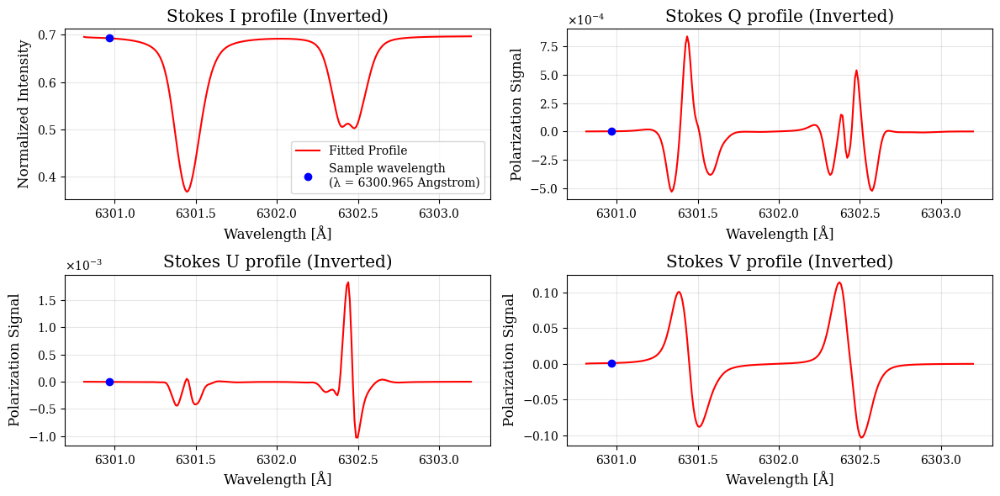

In [98]:
# Create a 2x2 subplot for the 4 Stokes parameters
fig, axes = plt.subplots(2, 2, figsize=(12, 6))

for i, (ax, label) in enumerate(zip(axes.flat, stokes_labels)):
    ax.plot(wl_inv, sample_pixel_inverted[i, :], 'r-', linewidth=1.5)
    # Add red dot at sample_wavelength_idx_inv
    ax.plot(wl_inv[sample_wavelength_idx_inv], sample_pixel_inverted[i, sample_wavelength_idx_inv], 'bo', markersize=6)
    ax.set_title(f'{label} profile (Inverted)')
    # Add legend only to the first subplot
    if i == 0:
        ax.legend(['Fitted Profile', f'Sample wavelength\n(λ = {wl_inv[sample_wavelength_idx_inv]:.3f})'], loc='lower right')
    ax.set_xlabel('Wavelength [Å]')
    ax.set_ylabel('Intensity')
    ax.grid(True, alpha=0.3)
    
    # Set appropriate y-axis limits for each Stokes parameter
    if i == 0:  # Stokes I
        ax.set_ylabel('Normalized Intensity')
    else:  # Stokes Q, U, V
        ax.set_ylabel('Polarization Signal')

plt.tight_layout()
plt.savefig(modest_images_dir / "sample_pixel_inverted_stokes_profiles.png", dpi=300, bbox_inches='tight')
plt.show()

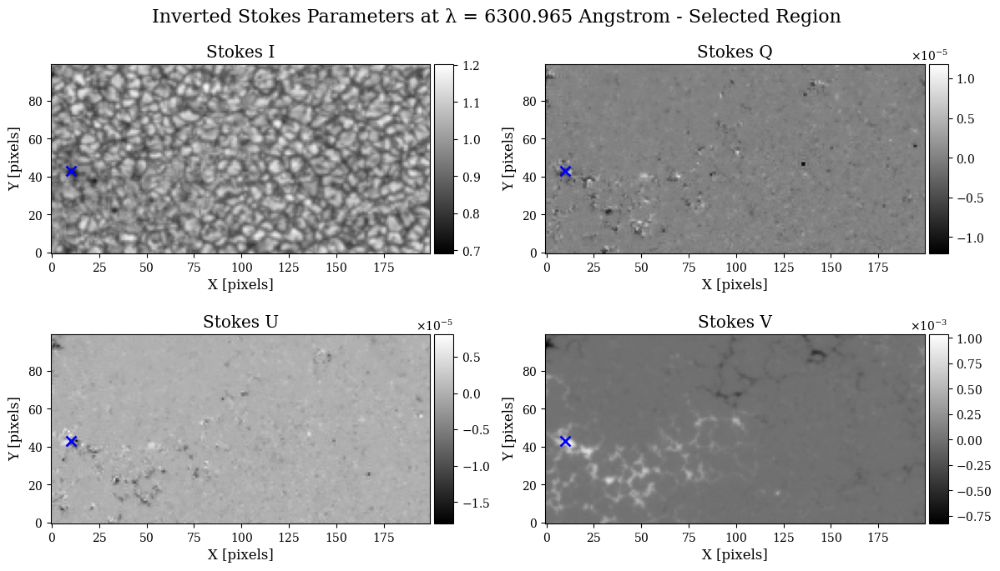

In [99]:
inverted_profs_region_sample = inverted_profs_region[:, :, :, sample_wavelength_idx_inv]

# Create a 2x2 subplot for the 4 Stokes parameters
fig, axes = plt.subplots(2, 2, figsize=(12, 7))

# Add lambda value as suptitle
fig.suptitle(f'Inverted Stokes Parameters at λ = {wl_inv[sample_wavelength_idx_inv]:.3f} - Selected Region', fontsize=16)

for i, (ax, label) in enumerate(zip(axes.flat, stokes_labels)):
    im = ax.imshow(inverted_profs_region_sample[:, :, i], cmap='gray', origin='lower')
    ax.set_title(label)
    ax.set_xlabel('X [pixels]')
    ax.set_ylabel('Y [pixels]')
    
    # Mark the sample pixel in each subplot
    ax.plot(sample_x, sample_y, 'bx', markersize=8, markeredgewidth=2)
    
    # Add colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax)

plt.tight_layout()
plt.savefig(modest_images_dir / "inverted_stokes_parameters_selected_region.png", dpi=300, bbox_inches='tight')
plt.show()

#### 1.2.4 SPINOR 2D inverted magnitudes

Finally, upload the atmospheric magnitudes obtained through the inversion of fitted stokes using the SPINOR 2D inversion code.

In [100]:
with fits.open("../../data/hinode-MODEST/INV_560_AR11967/inverted_atmos.fits") as hdul:
    inverted_atm = hdul[0].data
    invatm_header = hdul[0].header

Let's our atmospheric parameters of interest which are the temperature, magnetic field in the line-of-sight and velocity in the line-of-sight for the three optical depth nodes of the MODEST catalog that correspond to $\log\,\tau = -2.0, -0.8, 0.0$.

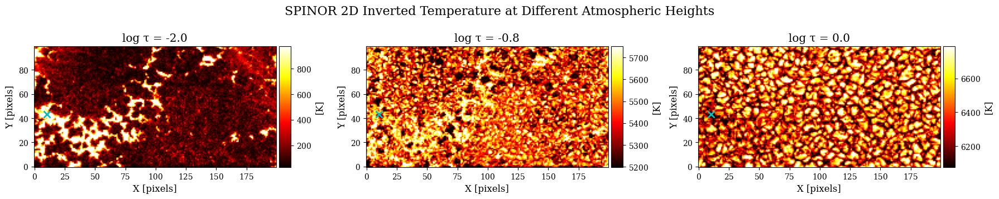

In [101]:
# Extract temperature data for the three nodes (indices 8, 6, 7)
temp_nodes = inverted_atm[[8, 6, 7], :, :]

# Extract the selected region for each temperature node
temp_region = temp_nodes[:, y_start:y_end, x_start:x_end]

# Create subplots for the three temperature nodes
fig, axes = plt.subplots(1, 3, figsize=(18, 3.5))

# Temperature node labels based on the header information
temp_labels = ['log τ = -2.0', 'log τ = -0.8', 'log τ = 0.0']

for i, (ax, label) in enumerate(zip(axes, temp_labels)):
    # Calculate quantiles for each individual height
    vmin = np.quantile(temp_region[i], 0.05)
    vmax = np.quantile(temp_region[i], 0.95)
    
    im = ax.imshow(temp_region[i], cmap='hot', origin='lower', vmin=vmin, vmax=vmax)
    ax.set_title(label)
    ax.set_xlabel('X [pixels]')
    ax.set_ylabel('Y [pixels]')
    
    # Mark the sample pixel
    ax.plot(sample_x, sample_y, 'cx', markersize=8, markeredgewidth=2)
    
    # Add colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(im, cax=cax)
    cbar.set_label('[K]')

plt.suptitle('SPINOR 2D Inverted Temperature at Different Atmospheric Heights', fontsize=16)
plt.tight_layout()
plt.savefig(modest_images_dir / "spinor_temperature_three_nodes.png", dpi=300, bbox_inches='tight')
plt.show()

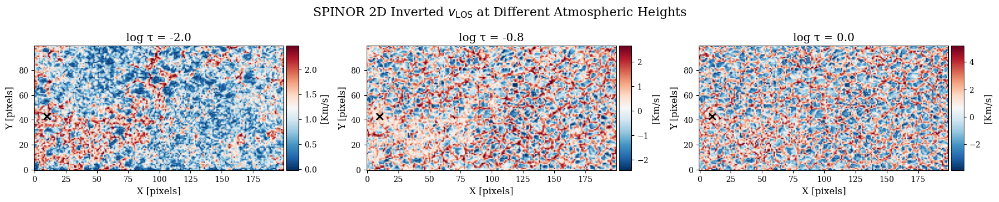

In [102]:
# Extract velocity data for the three nodes (indices 20, 18, 19)
vel_nodes = inverted_atm[[20, 18, 19], :, :]

# Extract the selected region for each velocity node
vel_region = vel_nodes[:, y_start:y_end, x_start:x_end]

# Create subplots for the three velocity nodes
fig, axes = plt.subplots(1, 3, figsize=(18, 3.5))

# Velocity node labels based on the header information
vel_labels = ['log τ = -2.0', 'log τ = -0.8', 'log τ = 0.0']

for i, (ax, label) in enumerate(zip(axes, vel_labels)):
    # Calculate quantiles for each individual height
    vmin = np.quantile(vel_region[i], 0.01)
    vmax = np.quantile(vel_region[i], 0.99)
    
    im = ax.imshow(vel_region[i], cmap='RdBu_r', origin='lower', vmin=vmin, vmax=vmax)
    ax.set_title(label)
    ax.set_xlabel('X [pixels]')
    ax.set_ylabel('Y [pixels]')
    
    # Mark the sample pixel
    ax.plot(sample_x, sample_y, 'kx', markersize=8, markeredgewidth=2)
    
    # Add colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(im, cax=cax)
    cbar.set_label('[Km/s]')

plt.suptitle(R'SPINOR 2D Inverted $v_\text{LOS}$ at Different Atmospheric Heights', fontsize=16)
plt.tight_layout()
plt.savefig(modest_images_dir / "spinor_velocity_three_nodes.png", dpi=300, bbox_inches='tight')
plt.show()

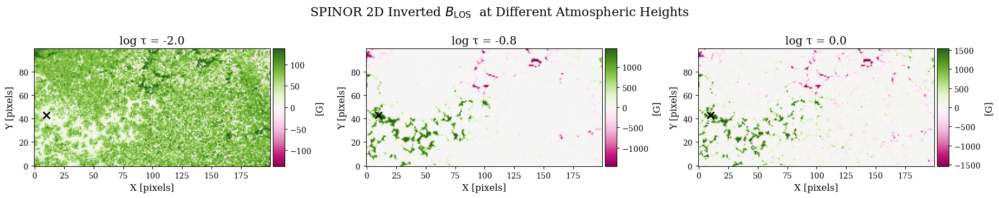

In [103]:
# Extract magnetic field and gamma angle data for the three nodes
# Pairs: (11, 14), (9, 12), (10, 13)
mag_field_indices = [11, 9, 10]
gamma_indices = [14, 12, 13]

# Calculate B * cos(gamma) for each node
bcos_gamma_nodes = []
for i in range(3):
    # Extract magnetic field and gamma angle
    b_field = inverted_atm[mag_field_indices[i], :, :]
    gamma_deg = inverted_atm[gamma_indices[i], :, :]
    
    # Convert gamma from degrees to radians
    gamma_rad = np.deg2rad(gamma_deg)
    
    # Calculate B * cos(gamma)
    bcos_gamma = b_field * np.cos(gamma_rad)
    bcos_gamma_nodes.append(bcos_gamma)

# Convert to numpy array
bcos_gamma_nodes = np.array(bcos_gamma_nodes)

# Extract the selected region for each B*cos(gamma) node
bcos_gamma_region = bcos_gamma_nodes[:, y_start:y_end, x_start:x_end]

# Create subplots for the three B*cos(gamma) nodes
fig, axes = plt.subplots(1, 3, figsize=(18, 3.5))

# B*cos(gamma) node labels based on the header information
bcos_gamma_labels = ['log τ = -2.0', 'log τ = -0.8', 'log τ = 0.0']

for i, (ax, label) in enumerate(zip(axes, bcos_gamma_labels)):
    # Calculate quantiles for each individual height
    vmin = np.quantile(bcos_gamma_region[i], 0.01)
    vmax = np.quantile(bcos_gamma_region[i], 0.99)
    if np.abs(vmin) > np.abs(vmax):
        vmax = np.abs(vmin)
    else:
        vmin = -np.abs(vmax)
    
    im = ax.imshow(bcos_gamma_region[i], cmap='PiYG', origin='lower', vmin=vmin, vmax=vmax)
    ax.set_title(label)
    ax.set_xlabel('X [pixels]')
    ax.set_ylabel('Y [pixels]')
    
    # Mark the sample pixel
    ax.plot(sample_x, sample_y, 'kx', markersize=8, markeredgewidth=2)
    
    # Add colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(im, cax=cax)
    cbar.set_label('[G]')

plt.suptitle(r'SPINOR 2D Inverted $B_{\text{LOS}}$  at Different Atmospheric Heights', fontsize=16)
plt.tight_layout()
plt.savefig(modest_images_dir / "spinor_bcos_gamma_three_nodes.png", dpi=300, bbox_inches='tight')
plt.show()

Let's condense all this data in a dictionary for easy access to each of the magnitudes data per each optical depth value.

In [104]:
# Define the atmospheric heights (tau values)
tau_values = [-2.0, -0.8, 0.0]

# Create dictionary to store atmospheric data
spinor_atm_dict = {}

# Temperature data (indices 8, 6, 7 for tau = -2.0, -0.8, 0.0)
temp_indices = [8, 6, 7]
for i, tau in enumerate(tau_values):
    key = f"temperature_tau_{tau}"
    spinor_atm_dict[key] = inverted_atm[temp_indices[i], y_start:y_end, x_start:x_end]

# Velocity data (indices 20, 18, 19 for tau = -2.0, -0.8, 0.0)
vel_indices = [20, 18, 19]
for i, tau in enumerate(tau_values):
    key = f"velocity_tau_{tau}"
    spinor_atm_dict[key] = inverted_atm[vel_indices[i], y_start:y_end, x_start:x_end]

# Magnetic field data - calculate B_LOS = B * cos(gamma)
# B field indices: [11, 9, 10] and gamma indices: [14, 12, 13]
mag_field_indices = [11, 9, 10]
gamma_indices = [14, 12, 13]

for i, tau in enumerate(tau_values):
    # Extract magnetic field and gamma angle for the region
    b_field = inverted_atm[mag_field_indices[i], y_start:y_end, x_start:x_end]
    gamma_deg = inverted_atm[gamma_indices[i], y_start:y_end, x_start:x_end]
    
    # Convert gamma from degrees to radians and calculate B_LOS
    gamma_rad = np.deg2rad(gamma_deg)
    blos = b_field * np.cos(gamma_rad)
    
    key = f"blos_tau_{tau}"
    spinor_atm_dict[key] = blos

# Print available keys in the dictionary
print("Available atmospheric data keys:")
for key in spinor_atm_dict.keys():
    data = spinor_atm_dict[key]
    
    # Determine the appropriate unit based on the parameter type
    if 'temperature' in key:
        unit = '[K]'
    elif 'velocity' in key:
        unit = '[km/s]'
    elif 'blos' in key:
        unit = '[G]'
    else:
        unit = ''
    
    print(f"  {key}: min={data.min():.2f}{unit}, max={data.max():.2f}{unit}")

Available atmospheric data keys:
  temperature_tau_-2.0: min=-92.17[K], max=1754.30[K]
  temperature_tau_-0.8: min=4947.54[K], max=6210.27[K]
  temperature_tau_0.0: min=5469.46[K], max=7086.58[K]
  velocity_tau_-2.0: min=-0.33[km/s], max=3.85[km/s]
  velocity_tau_-0.8: min=-4.22[km/s], max=4.41[km/s]
  velocity_tau_0.0: min=-6.86[km/s], max=9.92[km/s]
  blos_tau_-2.0: min=-92.21[G], max=186.56[G]
  blos_tau_-0.8: min=-2269.59[G], max=2493.39[G]
  blos_tau_0.0: min=-2896.30[G], max=2855.32[G]


Let's visualize the three quantities per optical depth height

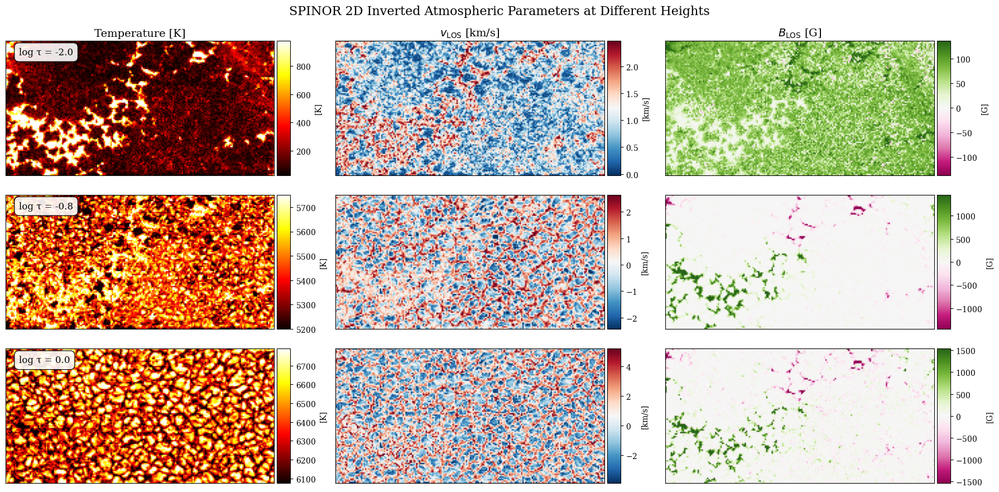

In [105]:
# Create a comprehensive plot showing all atmospheric quantities at all optical depths
fig, axes = plt.subplots(3, 3, figsize=(18, 9))

# Define the quantities and their properties
quantities = ['temperature', 'velocity', 'blos']
quantity_labels = ['Temperature [K]', r'$v_{\text{LOS}}$ [km/s]', r'$B_{\text{LOS}}$ [G]']
colormaps = ['hot', 'RdBu_r', 'PiYG']
marker_colors = ['cyan', 'black', 'black']

# Loop through each optical depth (rows)
for row, tau in enumerate(tau_values):
    # Loop through each quantity (columns)
    for col, (quantity, label, cmap, marker_color) in enumerate(zip(quantities, quantity_labels, colormaps, marker_colors)):
        ax = axes[row, col]
        ax.set_xticks([])
        ax.set_yticks([])
        
        # Get the data for this combination
        key = f"{quantity}_tau_{tau}"
        data = spinor_atm_dict[key]
        
        # Calculate appropriate color limits
        if quantity == 'temperature':
            vmin = np.quantile(data, 0.05)
            vmax = np.quantile(data, 0.95)
        else:  # velocity and blos
            vmin = np.quantile(data, 0.01)
            vmax = np.quantile(data, 0.99)
            if quantity == 'blos':
                # Make symmetric for magnetic field
                if np.abs(vmin) > np.abs(vmax):
                    vmax = np.abs(vmin)
                else:
                    vmin = -np.abs(vmax)
        
        # Create the image
        im = ax.imshow(data, cmap=cmap, origin='lower', vmin=vmin, vmax=vmax)
        
        # Set labels and title
        if row == 0:  # Top row gets column titles
            ax.set_title(label, fontsize=14)
        
        # Add semi-transparent square with tau value for temperature plots only
        if quantity == 'temperature':
            textstr = f'log τ = {tau}'
            props = dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9)
            ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=12,
                   verticalalignment='top', bbox=props)
        
        # Add colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = plt.colorbar(im, cax=cax)
        
        # Set colorbar label with appropriate units
        if quantity == 'temperature':
            cbar.set_label('[K]', fontsize=10)
        elif quantity == 'velocity':
            cbar.set_label('[km/s]', fontsize=10)
        else:  # blos
            cbar.set_label('[G]', fontsize=10)

plt.suptitle('SPINOR 2D Inverted Atmospheric Parameters at Different Heights', fontsize=16)
plt.tight_layout()
plt.savefig(modest_images_dir / "spinor_all_quantities_all_heights.png", dpi=300, bbox_inches='tight')
plt.show()

## 2. WFA Approximation

The WFA approximation is defined by the following equation.

\begin{equation}
    V(\lambda) \approx -\frac{e}{4\pi m_e c} \cdot \lambda_0^2 \cdot g_{\lambda_0} \cdot B_{\text{LOS}} \frac{dI(\lambda)}{d\lambda}\,,
\end{equation}

- $e$ is the elementary charge.
- $m_e$ is the electron mass.
- $c$ is the speed of light in vacuum.
- $\lambda_0$ is the central wavelength of the spectral line.
- $g_{\lambda_0}$ is the effective Landé factor of the spectral line.

In [106]:
def B_LOS_from_stokes(stokes:np.ndarray,
                      ll:np.ndarray,
                      start_ll:int,
                      end_ll:int,
                      llambda0:float,
                      g:float,
                      stokes_v_index:int):
    """
    Estimate the line-of-sight magnetic field from a data cube of Stokes I profiles.
    Args:
    stokes: numpy.ndarray
        3D data cube of Stokes I profiles
    ll: numpy.ndarray
        Wavelength axis in amstrongs
    start_ll: int
        Index of the starting wavelength range
    end_ll: int
        Index of the ending wavelength range
    llambda0: float
        Rest wavelength in amstrongs
    g: float
        Landé factor
    stokes_v_index: int
        Index of the Stokes V profile in the data cube
    Returns:
    numpy.ndarray
        2D map of the line-of-sight magnetic field in Gauss
    """
    
    # Constants
    wfa_constant = e.si / (4 * np.pi) / m_e / c
    wfa_constant = wfa_constant.to(1 / u.G / u.Angstrom )

    # Function to estimate B_LOS from dI/dl and V
    def estimate_B(dI_dl, V):
        ND = len(V)
        a = np.zeros([ND, 2])
        a[:, 0] = dI_dl[:]
        a[:, 1] = 1.0
        b = V[:]

        # Correct least-squares solution
        p = np.linalg.pinv(a) @ b / dI_dl.unit
        
        # Compute B_LOS
        B = -p[0]*u.Angstrom / (wfa_constant * (llambda0)**2.0 * g)
        return B
        
    NX = stokes.shape[0]
    NY = stokes.shape[1]

    B = np.zeros([NX,NY])

    # Ensure the wavelength axis is in Angstroms
    for i in range (0,NX):
        for j in range(0,NY):
            dI_dl =  np.gradient(stokes[i,j,0,start_ll:end_ll]) / np.gradient(ll[start_ll:end_ll])
            local_B = estimate_B(dI_dl = dI_dl,
                                V = stokes[i,j,stokes_v_index,start_ll:end_ll])
            B[i,j] = local_B.value
    B = B * u.G
    
    return B

### 2.1 WFA on MURaM Stokes

Let's apply the WFA approximation on the Stokes V associated to the MURAM. The array of wavelengths is the corresponding one to Hinode since the Stokes params were resampled to this parameters.

Since the WFA approximation depends on the absorption line used for calculating it, it is necessary to define a range of wavelength values that define this interval. We are going to use the FeI $\lambda 6301.
5$ absorption line, which has a landé factor of $g_\text{eff} = 1.67$.

In [107]:
start_wl = 15
end_wl = 50

In [108]:
# Find the pixel with the lowest value in the Stokes I continuum for both processing types
# First reshape the stokes data to get the continuum intensity for both processing types
stokes_reshaped_complete = np.reshape(data_dict['complete_hinode'][f'stokes_data_original_muram_{filename}'], (nx, ny, 4, 112))
stokes_reshaped_no_spatial = np.reshape(data_dict['no_spatial'][f'stokes_data_original_muram_{filename}'], (nx, ny, 4, 112))

# Get continuum intensity from "no_spatial" data to find the minimum pixel
continuum_intensity_no_spatial = stokes_reshaped_no_spatial[:, :, 0, 0]  # First wavelength point of Stokes I

# Find coordinates of the darkest pixel using "no_spatial" data
min_idx_muram = np.unravel_index(np.argmin(continuum_intensity_no_spatial), continuum_intensity_no_spatial.shape)
sample_x_muram, sample_y_muram = min_idx_muram

print(f"Darkest pixel coordinates in MURaM data (from no_spatial): ({sample_x_muram}, {sample_y_muram})")
print(f"Continuum intensity at darkest pixel (no_spatial): {continuum_intensity_no_spatial[sample_x_muram, sample_y_muram]:.4f}")

# Also get continuum from "complete_hinode" for comparison
continuum_intensity_complete = stokes_reshaped_complete[:, :, 0, 0]
print(f"Continuum intensity at same pixel (complete_hinode): {continuum_intensity_complete[sample_x_muram, sample_y_muram]:.4f}")



Darkest pixel coordinates in MURaM data (from no_spatial): (412, 86)
Continuum intensity at darkest pixel (no_spatial): 0.5690
Continuum intensity at same pixel (complete_hinode): 0.7885


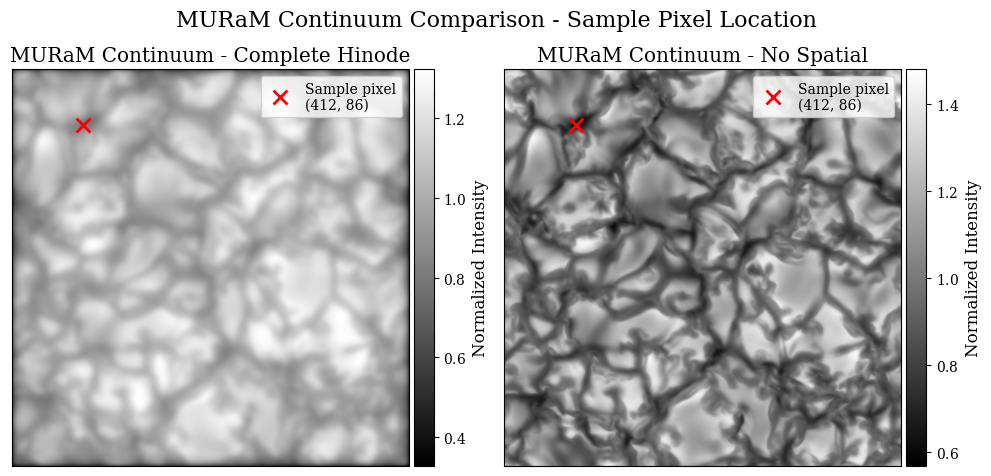

In [109]:
# Create plot for MURaM continuum with sample pixel marked for both processing types
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

for i, process_type in enumerate(model_options):
    ax = axes[i]
    
    # Get the continuum data for this processing type
    stokes_reshaped = np.reshape(data_dict[process_type][f'stokes_data_original_muram_{filename}'], (nx, ny, 4, 112))
    continuum_muram = stokes_reshaped[:, :, 0, 0]  # First wavelength point of Stokes I
    
    # Plot continuum image
    im = ax.imshow(continuum_muram, cmap='gray', origin='lower')
    ax.plot(sample_y_muram, sample_x_muram, 'rx', markersize=10, markeredgewidth=2, 
             label=f'Sample pixel\n({sample_x_muram}, {sample_y_muram})')
    
    # Set titles and labels
    ax.set_title(f'MURaM Continuum - {process_type.replace("_", " ").title()}')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend()
    
    # Add colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im, cax=cax, label='Normalized Intensity')

plt.suptitle('MURaM Continuum Comparison - Sample Pixel Location', fontsize=16)
plt.tight_layout()
plt.savefig(muram_images_dir / "muram_continuum_comparison_with_sample_pixel.png", dpi=300, bbox_inches='tight')
plt.show()


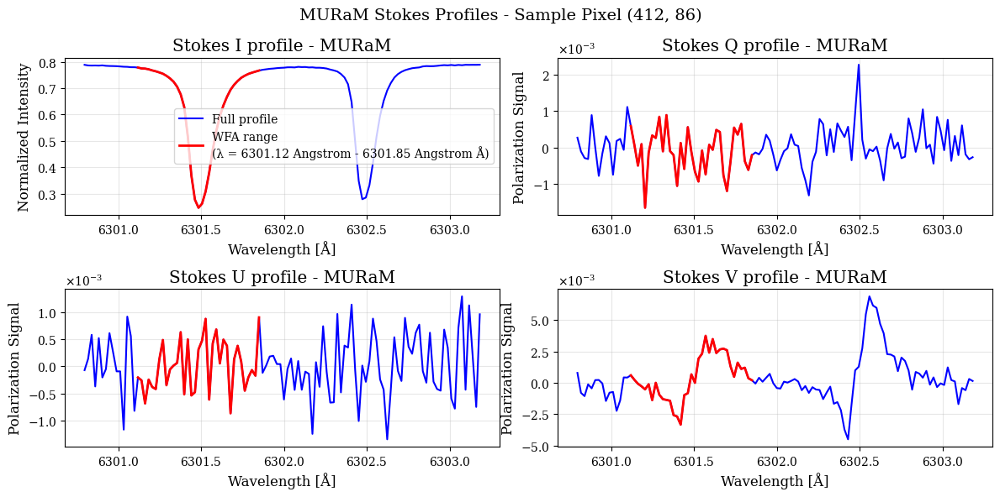

In [110]:
# Extract the stokes data for the darkest pixel
sample_pixel_stokes_muram = data_dict['complete_hinode'][f'stokes_data_original_muram_{filename}'][sample_x_muram * ny + sample_y_muram, :, :]

# Create a 2x2 subplot for the 4 Stokes parameters
fig, axes = plt.subplots(2, 2, figsize=(12, 6))

for i, (ax, label) in enumerate(zip(axes.flat, stokes_labels)):
    # Plot the full profile in blue
    ax.plot(wl, sample_pixel_stokes_muram[i, :], 'b-', linewidth=1.5, label='Full profile')
    
    # Highlight the selected range in red
    ax.plot(wl[start_wl:end_wl], 
            sample_pixel_stokes_muram[i, start_wl:end_wl], 
            'r-', linewidth=2, label=f'WFA range\n(λ = {wl[start_wl]:.2f} - {wl[end_wl-1]:.2f} Å)')
    
    ax.set_title(f'{label} profile - MURaM')
    ax.set_xlabel('Wavelength [Å]')
    ax.set_ylabel('Intensity')
    ax.grid(True, alpha=0.3)
    
    # Add legend only to the first subplot
    if i == 0:
        ax.legend(loc='best')
    
    # Set appropriate y-axis labels for each Stokes parameter
    if i == 0:  # Stokes I
        ax.set_ylabel('Normalized Intensity')
    else:  # Stokes Q, U, V
        ax.set_ylabel('Polarization Signal')

plt.suptitle(f'MURaM Stokes Profiles - Sample Pixel ({sample_x_muram}, {sample_y_muram})', fontsize=14)
plt.tight_layout()
plt.savefig(muram_images_dir / "muram_sample_pixel_stokes_profiles_with_wfa_range.png", dpi=300, bbox_inches='tight')
plt.show()

In [111]:
# Add missing variables that are referenced in later cells
from timeit import default_timer as timer

# Define variables that are referenced in the WFA analysis
stokes_data_original_muram = data_dict['complete_hinode'][f'stokes_data_original_muram_{[filename][0]}']
atm_data_original_muram = data_dict['complete_hinode'][f'atm_data_original_muram_{[filename][0]}']

# Create dictionary for WFA B_LOS calculation for both processing types
muram_wfa_B_lOS = {}
for process_type in model_options:
    print(f"Calculating B_LOS for {process_type} processing type...")
    stokes_data_viz = np.reshape(data_dict[process_type][f'stokes_data_original_muram_{[filename][0]}'], 
                                (480, 480, data_dict[process_type][f'stokes_data_original_muram_{[filename][0]}'].shape[1], 
                                 data_dict[process_type][f'stokes_data_original_muram_{[filename][0]}'].shape[2]))
    
    if not stokes_data_viz.shape[-1] == 112:
        raise ValueError(f"Expected 112 spectral points, but got {stokes_data_viz.shape[-1]} for {process_type}.")
    if not len(wl) == 112:
        raise ValueError(f"Expected 112 spectral points in wavelength array, but got {len(wl)}.")
    
    muram_wfa_B_lOS[process_type] = B_LOS_from_stokes(stokes=stokes_data_viz, 
                                                      ll=wl, 
                                                      start_ll=start_wl, 
                                                      end_ll=end_wl, 
                                                      llambda0=6301.5*u.Angstrom, 
                                                      g=1.67,
                                                      stokes_v_index=3)
print("B_LOS calculation completed for all processing types.")

Calculating B_LOS for complete_hinode processing type...


Calculating B_LOS for no_spatial processing type...
B_LOS calculation completed for all processing types.


complete_hinode B_LOS - Min: -88.56 G, Max: 94.58 G
complete_hinode B_LOS at sample pixel: -21.89 G
no_spatial B_LOS - Min: -317.63 G, Max: 473.54 G
no_spatial B_LOS at sample pixel: -88.68 G


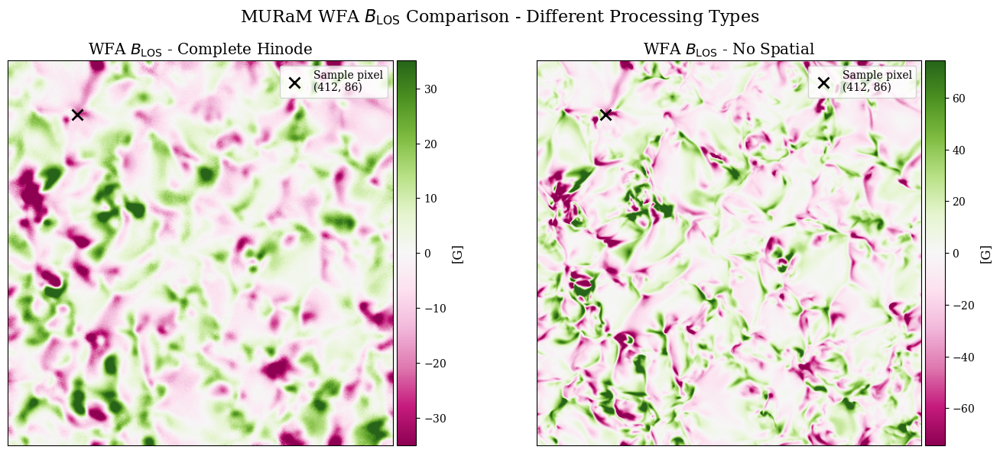

In [112]:
# Create a comparison plot of WFA B_LOS for both processing types
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

for i, process_type in enumerate(model_options):
    ax = axes[i]
    
    # Get the B_LOS data for this processing type
    blos_data = muram_wfa_B_lOS[process_type].value  # Remove units for plotting
    
    # Calculate symmetric color limits
    vmin = np.quantile(blos_data, 0.01)
    vmax = np.quantile(blos_data, 0.99)
    if np.abs(vmin) > np.abs(vmax):
        vmax = np.abs(vmin)
    else:
        vmin = -np.abs(vmax)
    
    # Create the image
    im = ax.imshow(blos_data, cmap='PiYG', origin='lower', vmin=vmin, vmax=vmax)
    
    # Mark the sample pixel
    ax.plot(sample_y_muram, sample_x_muram, 'kx', markersize=10, markeredgewidth=2, 
             label=f'Sample pixel\n({sample_x_muram}, {sample_y_muram})')
    
    # Set title and labels
    ax.set_title(f'WFA $B_{{\\text{{LOS}}}}$ - {process_type.replace("_", " ").title()}')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend()
    
    # Add colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(im, cax=cax)
    cbar.set_label('[G]', fontsize=12)
    
    # Print statistics
    print(f"{process_type} B_LOS - Min: {blos_data.min():.2f} G, Max: {blos_data.max():.2f} G")
    print(f"{process_type} B_LOS at sample pixel: {blos_data[sample_x_muram, sample_y_muram]:.2f} G")

plt.suptitle('MURaM WFA $B_{\\text{LOS}}$ Comparison - Different Processing Types', fontsize=16)
plt.tight_layout()
plt.savefig(muram_images_dir / "muram_wfa_blos_comparison.png", dpi=300, bbox_inches='tight')
plt.show()

Let's check out the point with lowest RRMSE value.


Complete Hinode - Relative RMSE Summary:
Minimum relative RMSE: 0.6860 at log τ = -0.9
Maximum relative RMSE: 1.7975 at log τ = -2.0
MODEST nodes:
  log τ = -2.0: Relative RMSE = 1.7975
  log τ = -0.8: Relative RMSE = 0.6882
  log τ = 0.0: Relative RMSE = 0.8373

No Spatial - Relative RMSE Summary:
Minimum relative RMSE: 0.7168 at log τ = -0.3
Maximum relative RMSE: 4.3045 at log τ = -2.0
MODEST nodes:
  log τ = -2.0: Relative RMSE = 4.3045
  log τ = -0.8: Relative RMSE = 0.9712
  log τ = 0.0: Relative RMSE = 0.7830


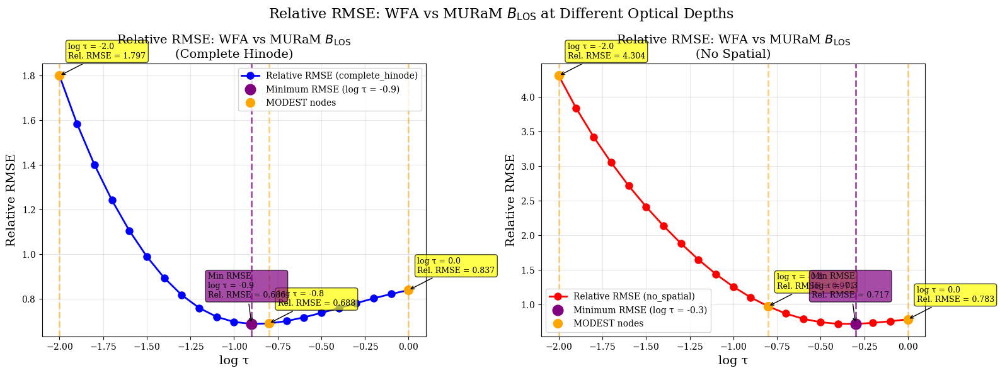

In [113]:
# Calculate relative RMSE between WFA B_LOS and MURaM B_LOS at different optical depths for both processing types
relative_rmse_dict = {}

for process_type in model_options:
    # Get the WFA B_LOS data
    wfa_blos = muram_wfa_B_lOS[process_type].value  # Shape: (nx, ny)
    
    # Get the MURaM atmospheric data for B_LOS at different optical depths
    atm_data_muram = data_dict[process_type][f'atm_data_original_muram_{filename}']
    blos_muram_all_depths = atm_data_muram[:, :, :, 3]  # Shape: (nx, ny, n_depths)
    
    # Calculate relative RMSE for each optical depth
    n_depths = blos_muram_all_depths.shape[2]
    relative_rmse_values = []
    
    for depth_idx in range(n_depths):
        blos_muram_depth = blos_muram_all_depths[:, :, depth_idx]
        
        # Flatten arrays for RMSE calculation
        wfa_flat = wfa_blos.flatten()
        muram_flat = blos_muram_depth.flatten()
        
        # Calculate RMSE
        rmse_value = rmse(muram_flat, wfa_flat)
        
        # Calculate relative RMSE (normalized by the standard deviation of MURaM B_LOS)
        std_muram = np.std(muram_flat)
        relative_rmse = rmse_value / std_muram if std_muram > 0 else np.inf
        
        relative_rmse_values.append(relative_rmse)
    
    relative_rmse_dict[process_type] = relative_rmse_values

# Create the plot for both processing types
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

colors = ['blue', 'red']
for i, process_type in enumerate(model_options):
    ax = axes[i]
    relative_rmse_values = relative_rmse_dict[process_type]
    
    # Find the minimum RMSE point
    min_rmse_idx = np.argmin(relative_rmse_values)
    min_rmse_tau = new_logtau[min_rmse_idx]
    min_rmse_value = relative_rmse_values[min_rmse_idx]
    
    # Plot relative RMSE vs optical depth
    ax.plot(new_logtau, relative_rmse_values, 'o-', color=colors[i], 
            linewidth=2, markersize=8, label=f'Relative RMSE ({process_type})')
    
    # Highlight the minimum RMSE point with a different color
    ax.plot(min_rmse_tau, min_rmse_value, 'o', color='purple', 
            markersize=12, label=f'Minimum RMSE (log τ = {min_rmse_tau:.1f})')
    
    # Highlight the three MODEST nodes
    modest_indices = [0, 12, -1]  # log τ = -2.0, -0.8, 0.0
    modest_tau_values = [new_logtau[idx] for idx in modest_indices]
    modest_rmse_values = [relative_rmse_values[idx] for idx in modest_indices]
    
    ax.plot(modest_tau_values, modest_rmse_values, 'o', color='orange', 
            markersize=10, label='MODEST nodes')
    
    # Add vertical lines for MODEST nodes
    for tau_val in modest_tau_values:
        ax.axvline(x=tau_val, color='orange', linestyle='--', alpha=0.5)
    
    # Add vertical line for minimum RMSE point
    ax.axvline(x=min_rmse_tau, color='purple', linestyle='--', alpha=0.7)
    
    # Formatting
    ax.set_xlabel('log τ', fontsize=14)
    ax.set_ylabel('Relative RMSE', fontsize=14)
    ax.set_title(f'Relative RMSE: WFA vs MURaM $B_{{\\text{{LOS}}}}$\n({process_type.replace("_", " ").title()})', fontsize=14)
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=10)
    
    # Add text annotations for MODEST nodes
    for j, (tau, rmse_val) in enumerate(zip(modest_tau_values, modest_rmse_values)):
        ax.annotate(f'log τ = {tau:.1f}\nRel. RMSE = {rmse_val:.3f}', 
                    xy=(tau, rmse_val), xytext=(10, 20), 
                    textcoords='offset points', fontsize=9,
                    bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7),
                    arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0'))
    
    # Add text annotation for minimum RMSE point
    ax.annotate(f'Min RMSE\nlog τ = {min_rmse_tau:.1f}\nRel. RMSE = {min_rmse_value:.3f}', 
                xy=(min_rmse_tau, min_rmse_value), xytext=(-50, 30), 
                textcoords='offset points', fontsize=9,
                bbox=dict(boxstyle='round,pad=0.3', facecolor='purple', alpha=0.7),
                arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0'))
    
    # Print summary statistics
    print(f"\n{process_type.replace('_', ' ').title()} - Relative RMSE Summary:")
    print(f"Minimum relative RMSE: {min_rmse_value:.4f} at log τ = {min_rmse_tau:.1f}")
    print(f"Maximum relative RMSE: {max(relative_rmse_values):.4f} at log τ = {new_logtau[np.argmax(relative_rmse_values)]:.1f}")
    print("MODEST nodes:")
    for tau, rmse_val in zip(modest_tau_values, modest_rmse_values):
        print(f"  log τ = {tau:.1f}: Relative RMSE = {rmse_val:.4f}")

plt.suptitle('Relative RMSE: WFA vs MURaM $B_{\\text{LOS}}$ at Different Optical Depths', fontsize=16)
plt.tight_layout()
plt.savefig(muram_images_dir / "wfa_muram_relative_rmse_vs_optical_depth_comparison.png", dpi=300, bbox_inches='tight')
plt.show()


Complete Hinode - Best WFA Match Statistics:
Optimal optical depth: log τ = -0.9
Relative RMSE: 0.6860
Correlation coefficient: 0.7331
RMSE: 10.10 G
MURaM B_LOS range: -219.70 to 195.78 G
WFA B_LOS range: -88.56 to 94.58 G

No Spatial - Best WFA Match Statistics:
Optimal optical depth: log τ = -0.3
Relative RMSE: 0.7168
Correlation coefficient: 0.7578
RMSE: 17.33 G
MURaM B_LOS range: -346.53 to 371.47 G
WFA B_LOS range: -317.63 to 473.54 G


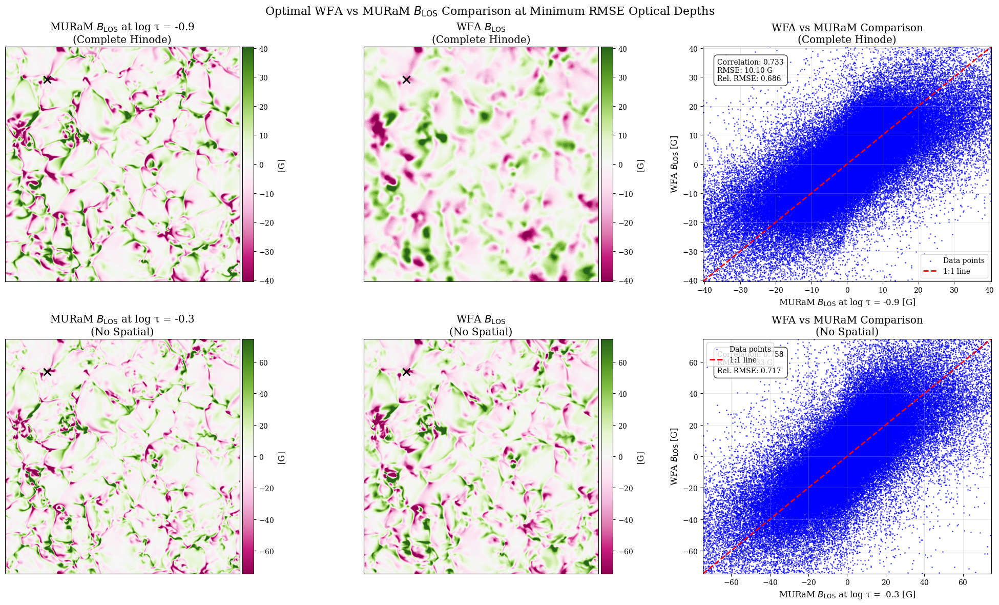

In [114]:
# Create a comprehensive plot showing the minimum RMSE points for both processing types
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

for i, process_type in enumerate(model_options):
    # Get the minimum RMSE optical depth index and value
    relative_rmse_values = relative_rmse_dict[process_type]
    min_rmse_idx = np.argmin(relative_rmse_values)
    min_rmse_tau = new_logtau[min_rmse_idx]
    min_rmse_value = relative_rmse_values[min_rmse_idx]
    
    # Get the atmospheric data for this processing type
    atm_data_muram = data_dict[process_type][f'atm_data_original_muram_{filename}']
    
    # Get MURaM B_LOS at the minimum RMSE optical depth
    blos_muram_min_rmse = atm_data_muram[:, :, min_rmse_idx, 3]
    
    # Get WFA B_LOS
    wfa_blos = muram_wfa_B_lOS[process_type].value
    
    # Calculate symmetric color limits for consistent comparison
    all_blos_data = np.concatenate([blos_muram_min_rmse.flatten(), wfa_blos.flatten()])
    vmin = np.quantile(all_blos_data, 0.01)
    vmax = np.quantile(all_blos_data, 0.99)
    if np.abs(vmin) > np.abs(vmax):
        vmax = np.abs(vmin)
    else:
        vmin = -np.abs(vmax)
    
    # Plot 1: MURaM B_LOS at minimum RMSE optical depth
    ax1 = axes[i, 0]
    im1 = ax1.imshow(blos_muram_min_rmse, cmap='PiYG', origin='lower', vmin=vmin, vmax=vmax)
    ax1.set_title(f'MURaM $B_{{\\text{{LOS}}}}$ at log τ = {min_rmse_tau:.1f}\n({process_type.replace("_", " ").title()})')
    ax1.plot(sample_y_muram, sample_x_muram, 'kx', markersize=10, markeredgewidth=2)
    ax1.set_xticks([])
    ax1.set_yticks([])
    
    # Add colorbar
    divider = make_axes_locatable(ax1)
    cax1 = divider.append_axes("right", size="5%", pad=0.05)
    cbar1 = plt.colorbar(im1, cax=cax1)
    cbar1.set_label('[G]', fontsize=12)
    
    # Plot 2: WFA B_LOS
    ax2 = axes[i, 1]
    im2 = ax2.imshow(wfa_blos, cmap='PiYG', origin='lower', vmin=vmin, vmax=vmax)
    ax2.set_title(f'WFA $B_{{\\text{{LOS}}}}$\n({process_type.replace("_", " ").title()})')
    ax2.plot(sample_y_muram, sample_x_muram, 'kx', markersize=10, markeredgewidth=2)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # Add colorbar
    divider = make_axes_locatable(ax2)
    cax2 = divider.append_axes("right", size="5%", pad=0.05)
    cbar2 = plt.colorbar(im2, cax=cax2)
    cbar2.set_label('[G]', fontsize=12)
    
    # Plot 3: Scatter plot comparison
    ax3 = axes[i, 2]
    
    # Create scatter plot
    ax3.scatter(blos_muram_min_rmse.flatten(), wfa_blos.flatten(), 
               alpha=0.6, s=1, c='blue', label='Data points')
    
    # Add 1:1 line
    plot_min = min(vmin, vmin)
    plot_max = max(vmax, vmax)
    ax3.plot([plot_min, plot_max], [plot_min, plot_max], 'r--', linewidth=2, label='1:1 line')
    
    # Calculate and add correlation coefficient
    correlation, p_value = pearsonr(blos_muram_min_rmse.flatten(), wfa_blos.flatten())
    
    # Calculate RMSE
    rmse_value = rmse(blos_muram_min_rmse.flatten(), wfa_blos.flatten())
    
    # Add statistics text
    stats_text = f'Correlation: {correlation:.3f}\nRMSE: {rmse_value:.2f} G\nRel. RMSE: {min_rmse_value:.3f}'
    ax3.text(0.05, 0.95, stats_text, transform=ax3.transAxes, 
             bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8),
             verticalalignment='top', fontsize=10)
    
    ax3.set_xlabel(f'MURaM $B_{{\\text{{LOS}}}}$ at log τ = {min_rmse_tau:.1f} [G]')
    ax3.set_ylabel('WFA $B_{\\text{LOS}}$ [G]')
    ax3.set_title(f'WFA vs MURaM Comparison\n({process_type.replace("_", " ").title()})')
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    ax3.set_xlim(plot_min, plot_max)
    ax3.set_ylim(plot_min, plot_max)
    
    # Print summary statistics
    print(f"\n{process_type.replace('_', ' ').title()} - Best WFA Match Statistics:")
    print(f"Optimal optical depth: log τ = {min_rmse_tau:.1f}")
    print(f"Relative RMSE: {min_rmse_value:.4f}")
    print(f"Correlation coefficient: {correlation:.4f}")
    print(f"RMSE: {rmse_value:.2f} G")
    print(f"MURaM B_LOS range: {blos_muram_min_rmse.min():.2f} to {blos_muram_min_rmse.max():.2f} G")
    print(f"WFA B_LOS range: {wfa_blos.min():.2f} to {wfa_blos.max():.2f} G")

plt.suptitle('Optimal WFA vs MURaM $B_{\\text{LOS}}$ Comparison at Minimum RMSE Optical Depths', fontsize=16)
plt.tight_layout()
plt.savefig(muram_images_dir / "optimal_wfa_muram_comparison_min_rmse.png", dpi=300, bbox_inches='tight')
plt.show()

### 2.2 WFA on MODEST Stokes

Take a look at the same wavelength interval but in the sample wavelength of the fitted MODEST Stokes. This fitted Stokes are already deconvoluted, which makes it unnecesary to calculate the WFA BLOS for different cases.

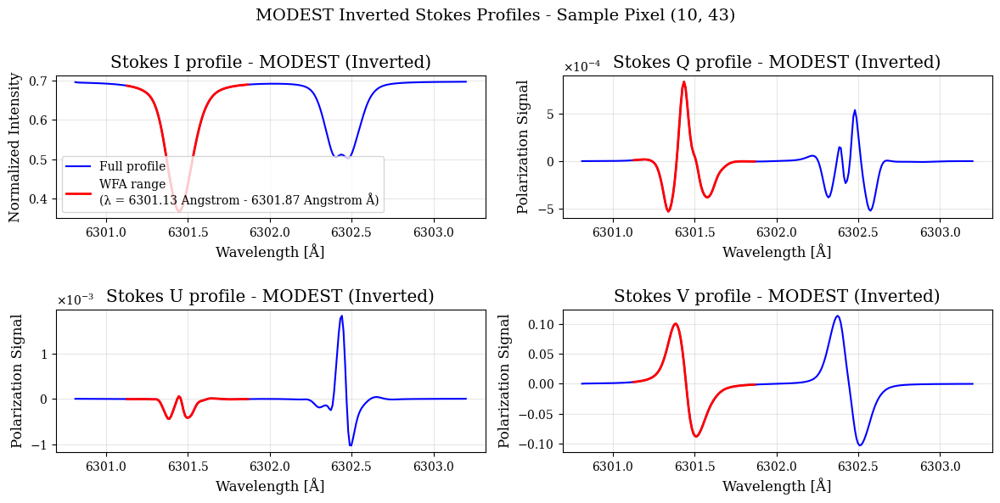

In [115]:
# Extract the inverted stokes profiles for the sample pixel (same coordinates as continuum analysis)
sample_pixel_inverted_stokes = inverted_profs_region[sample_y, sample_x, :, :]

# Calculate the wavelength range indices for WFA calculation
# Using the same relative range as for MURaM data
start_wl_inv = int(start_wl * len(wl_inv) / len(wl))  # Scale the start index
end_wl_inv = int(end_wl * len(wl_inv) / len(wl))      # Scale the end index

# Create a 2x2 subplot for the 4 Stokes parameters
fig, axes = plt.subplots(2, 2, figsize=(12, 6))

for i, (ax, label) in enumerate(zip(axes.flat, stokes_labels)):
    # Plot the full profile in blue
    ax.plot(wl_inv, sample_pixel_inverted_stokes[i, :], 'b-', linewidth=1.5, label='Full profile')
    
    # Highlight the selected range in red
    ax.plot(wl_inv[start_wl_inv:end_wl_inv], 
            sample_pixel_inverted_stokes[i, start_wl_inv:end_wl_inv], 
            'r-', linewidth=2, label=f'WFA range\n(λ = {wl_inv[start_wl_inv]:.2f} - {wl_inv[end_wl_inv-1]:.2f} Å)')
    
    ax.set_title(f'{label} profile - MODEST (Inverted)')
    ax.set_xlabel('Wavelength [Å]')
    ax.set_ylabel('Intensity')
    ax.grid(True, alpha=0.3)
    
    # Add legend only to the first subplot
    if i == 0:
        ax.legend(loc='best')
    
    # Set appropriate y-axis labels for each Stokes parameter
    if i == 0:  # Stokes I
        ax.set_ylabel('Normalized Intensity')
    else:  # Stokes Q, U, V
        ax.set_ylabel('Polarization Signal')

plt.suptitle(f'MODEST Inverted Stokes Profiles - Sample Pixel ({sample_x}, {sample_y})', fontsize=14)
plt.tight_layout()
plt.savefig(muram_images_dir / "modest_sample_pixel_stokes_profiles_with_wfa_range.png", dpi=300, bbox_inches='tight')
plt.show()

Then, we will calculate the corresponding WFA $B_\text{LOS}$

In [116]:
# Apply WFA calculation to MODEST inverted Stokes data
print("Calculating WFA B_LOS for MODEST inverted Stokes data...")

# Apply WFA to the inverted profiles region
modest_wfa_B_lOS = B_LOS_from_stokes(stokes=inverted_profs_region, 
                                     ll=wl_inv, 
                                     start_ll=start_wl_inv, 
                                     end_ll=end_wl_inv, 
                                     llambda0=6301.5*u.Angstrom, 
                                     g=1.67,
                                     stokes_v_index=3)

print(f"MODEST WFA B_LOS calculation completed!")
print(f"B_LOS range: {modest_wfa_B_lOS.min():.2f} to {modest_wfa_B_lOS.max():.2f}")
print(f"B_LOS at sample pixel ({sample_x}, {sample_y}): {modest_wfa_B_lOS[sample_y, sample_x]:.2f}")


Calculating WFA B_LOS for MODEST inverted Stokes data...
MODEST WFA B_LOS calculation completed!
B_LOS range: -1282.32 G to 1518.29 G
B_LOS at sample pixel (10, 43): 1218.88 G


Let's check it against the BLOS from the SPINOR 2D inversions.

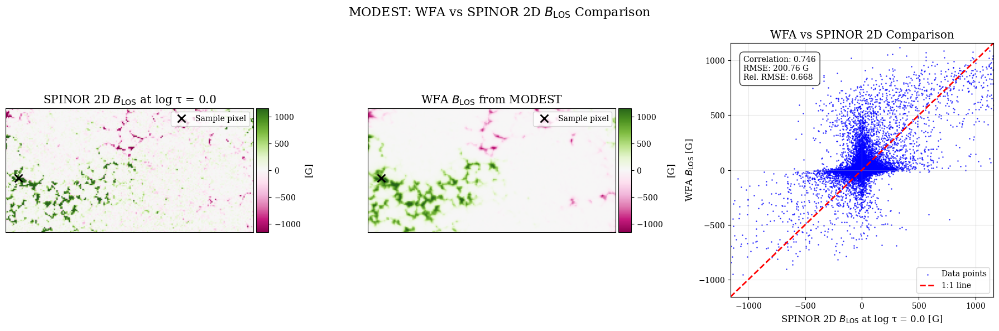


MODEST WFA vs SPINOR 2D Comparison Statistics:
Correlation coefficient: 0.7461
RMSE: 200.76 G
Relative RMSE: 0.6678
SPINOR B_LOS range: -2896.30 to 2855.32 G
WFA B_LOS range: -1282.32 G to 1518.29 G
Sample pixel values:
  SPINOR B_LOS: 1971.09 G
  WFA B_LOS: 1218.88 G


In [117]:
# Create comparison plot of SPINOR BLOS and WFA BLOS for MODEST data
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Get SPINOR BLOS at tau = 0.0 (surface, where WFA is most applicable)
spinor_blos_surface = spinor_atm_dict['blos_tau_0.0']

# Calculate symmetric color limits for consistent comparison
all_blos_data = np.concatenate([spinor_blos_surface.flatten(), modest_wfa_B_lOS.value.flatten()])
vmin = np.quantile(all_blos_data, 0.01)
vmax = np.quantile(all_blos_data, 0.99)
if np.abs(vmin) > np.abs(vmax):
    vmax = np.abs(vmin)
else:
    vmin = -np.abs(vmax)

# Plot 1: SPINOR BLOS at tau = 0.0
ax1 = axes[0]
im1 = ax1.imshow(spinor_blos_surface, cmap='PiYG', origin='lower', vmin=vmin, vmax=vmax)
ax1.set_title('SPINOR 2D $B_{\\text{LOS}}$ at log τ = 0.0')
ax1.plot(sample_x, sample_y, 'kx', markersize=10, markeredgewidth=2, label='Sample pixel')
ax1.set_xticks([])
ax1.set_yticks([])
ax1.legend()

# Add colorbar
divider = make_axes_locatable(ax1)
cax1 = divider.append_axes("right", size="5%", pad=0.05)
cbar1 = plt.colorbar(im1, cax=cax1)
cbar1.set_label('[G]', fontsize=12)

# Plot 2: WFA BLOS
ax2 = axes[1]
im2 = ax2.imshow(modest_wfa_B_lOS.value, cmap='PiYG', origin='lower', vmin=vmin, vmax=vmax)
ax2.set_title('WFA $B_{\\text{LOS}}$ from MODEST')
ax2.plot(sample_x, sample_y, 'kx', markersize=10, markeredgewidth=2, label='Sample pixel')
ax2.set_xticks([])
ax2.set_yticks([])
ax2.legend()

# Add colorbar
divider = make_axes_locatable(ax2)
cax2 = divider.append_axes("right", size="5%", pad=0.05)
cbar2 = plt.colorbar(im2, cax=cax2)
cbar2.set_label('[G]', fontsize=12)

# Plot 3: Scatter plot comparison
ax3 = axes[2]

# Create scatter plot
ax3.scatter(spinor_blos_surface.flatten(), modest_wfa_B_lOS.value.flatten(), 
           alpha=0.6, s=1, c='blue', label='Data points')

# Add 1:1 line
plot_min = vmin
plot_max = vmax
ax3.plot([plot_min, plot_max], [plot_min, plot_max], 'r--', linewidth=2, label='1:1 line')

# Calculate and add correlation coefficient
correlation, p_value = pearsonr(spinor_blos_surface.flatten(), modest_wfa_B_lOS.value.flatten())

# Calculate RMSE
rmse_value = rmse(spinor_blos_surface.flatten(), modest_wfa_B_lOS.value.flatten())

# Calculate relative RMSE
std_spinor = np.std(spinor_blos_surface.flatten())
relative_rmse = rmse_value / std_spinor if std_spinor > 0 else np.inf

# Add statistics text
stats_text = f'Correlation: {correlation:.3f}\nRMSE: {rmse_value:.2f} G\nRel. RMSE: {relative_rmse:.3f}'
ax3.text(0.05, 0.95, stats_text, transform=ax3.transAxes, 
         bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.8),
         verticalalignment='top', fontsize=10)

ax3.set_xlabel('SPINOR 2D $B_{\\text{LOS}}$ at log τ = 0.0 [G]')
ax3.set_ylabel('WFA $B_{\\text{LOS}}$ [G]')
ax3.set_title('WFA vs SPINOR 2D Comparison')
ax3.legend()
ax3.grid(True, alpha=0.3)
ax3.set_xlim(plot_min, plot_max)
ax3.set_ylim(plot_min, plot_max)

plt.suptitle('MODEST: WFA vs SPINOR 2D $B_{\\text{LOS}}$ Comparison', fontsize=16)
plt.tight_layout()
plt.savefig(modest_images_dir / "modest_wfa_vs_spinor_blos_comparison.png", dpi=300, bbox_inches='tight')
plt.show()

# Print summary statistics
print(f"\nMODEST WFA vs SPINOR 2D Comparison Statistics:")
print(f"Correlation coefficient: {correlation:.4f}")
print(f"RMSE: {rmse_value:.2f} G")
print(f"Relative RMSE: {relative_rmse:.4f}")
print(f"SPINOR B_LOS range: {spinor_blos_surface.min():.2f} to {spinor_blos_surface.max():.2f} G")
print(f"WFA B_LOS range: {modest_wfa_B_lOS.min():.2f} to {modest_wfa_B_lOS.max():.2f}")
print(f"Sample pixel values:")
print(f"  SPINOR B_LOS: {spinor_blos_surface[sample_y, sample_x]:.2f} G")
print(f"  WFA B_LOS: {modest_wfa_B_lOS[sample_y, sample_x]:.2f}")

## 3. DL Inversion models

For this section it is important for accessing both the metrics and the weights of trained models, to define a dictionary with the name of each of the experiments.

In [118]:
# Define model configurations

model_configs = {
    'complete_hinode': {
    },
    'no_spatial': {
    }
}

wfa_weight = [
        1e-2, 1e-3, 1e-4, 1e-5, 0
        ]

for i, wfa_w in enumerate(wfa_weight):
    model_configs['complete_hinode'][f'wfa_weight_{wfa_w}'] = f'processing_complete_hinode_model_only_LOS_epochs_20_lr_0.001_wfa_weight_{wfa_w}_tau_-0.9'
    model_configs['no_spatial'][f'wfa_weight_{wfa_w}'] = f'processing_no_spatial_model_only_LOS_epochs_20_lr_0.001_wfa_weight_{wfa_w}_tau_-0.3'

In [119]:
model_configs

{'complete_hinode': {'wfa_weight_0.01': 'processing_complete_hinode_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0.01_tau_-0.9',
  'wfa_weight_0.001': 'processing_complete_hinode_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0.001_tau_-0.9',
  'wfa_weight_0.0001': 'processing_complete_hinode_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0.0001_tau_-0.9',
  'wfa_weight_1e-05': 'processing_complete_hinode_model_only_LOS_epochs_20_lr_0.001_wfa_weight_1e-05_tau_-0.9',
  'wfa_weight_0': 'processing_complete_hinode_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0_tau_-0.9'},
 'no_spatial': {'wfa_weight_0.01': 'processing_no_spatial_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0.01_tau_-0.3',
  'wfa_weight_0.001': 'processing_no_spatial_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0.001_tau_-0.3',
  'wfa_weight_0.0001': 'processing_no_spatial_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0.0001_tau_-0.3',
  'wfa_weight_1e-05': 'processing_no_spatial_model_only_LOS_epochs_20_lr_0.001_wfa_weight_1e-

### 3.1 Loss metrics

For checking out the quality of the training in each of the models used in the experiment, let's charge the training metrics of each of them.

In [120]:
dataframes_path = Path("../csv/seventh_experiment/")

In [121]:
# Load loss metrics for the new model_configs with wfa_weights as keys
loss_data = {}

print("Loading loss metrics for WFA weight experiment...")
print("=" * 60)

for process_type, configs in model_configs.items():
    print(f"\n{process_type.upper()} models:")
    
    for config_key, config_path in configs.items():
        model_name = config_path
        
        csv_path = dataframes_path / model_name / "loss_metrics.csv"
        
        if csv_path.exists():
            loss_data[f"{process_type}_{config_key}"] = pd.read_csv(csv_path)
            print(f"  ✓ Loaded: {config_key} -> {model_name}")
        else:
            print(f"  ✗ Missing: {config_key} -> {csv_path}")

print(f"\nTotal loaded configurations: {len(loss_data)}")

Loading loss metrics for WFA weight experiment...

COMPLETE_HINODE models:
  ✓ Loaded: wfa_weight_0.01 -> processing_complete_hinode_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0.01_tau_-0.9
  ✓ Loaded: wfa_weight_0.001 -> processing_complete_hinode_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0.001_tau_-0.9
  ✓ Loaded: wfa_weight_0.0001 -> processing_complete_hinode_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0.0001_tau_-0.9
  ✓ Loaded: wfa_weight_1e-05 -> processing_complete_hinode_model_only_LOS_epochs_20_lr_0.001_wfa_weight_1e-05_tau_-0.9
  ✓ Loaded: wfa_weight_0 -> processing_complete_hinode_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0_tau_-0.9

NO_SPATIAL models:
  ✓ Loaded: wfa_weight_0.01 -> processing_no_spatial_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0.01_tau_-0.3
  ✗ Missing: wfa_weight_0.001 -> ../csv/seventh_experiment/processing_no_spatial_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0.001_tau_-0.3/loss_metrics.csv
  ✓ Loaded: wfa_weight_0.0001 -> processing_no_s

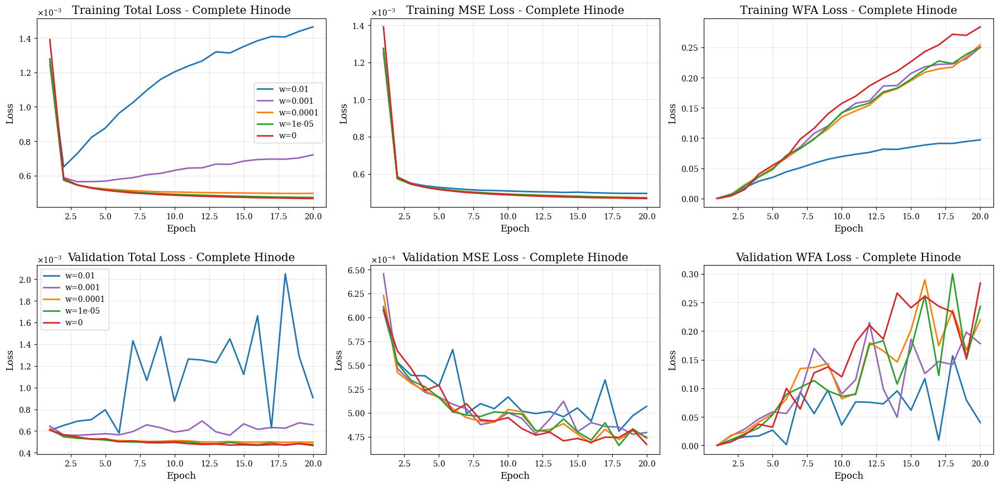

In [130]:
# Create loss metrics plots with different colors for each WFA weight
fig, axes = plt.subplots(2, 3, figsize=(18, 9))

# Define colors for different WFA weights
wfa_colors = {
    'wfa_weight_0.01': '#1f77b4',    # blue
    'wfa_weight_0.001': '#9467bd',   # purple
    'wfa_weight_0.0001': '#ff7f0e',  # orange
    'wfa_weight_1e-05': '#2ca02c',   # green
    'wfa_weight_0': '#d62728'        # red
}

# Define metrics to plot - reorganized with training metrics on top row, testing on bottom
metrics = [
    ['train_total_loss', 'train_base_loss', 'train_wfa_loss'],     # Top row: training metrics
    ['test_total_loss', 'test_base_loss', 'test_wfa_loss']         # Bottom row: testing metrics
]

metric_titles = {
    'train_total_loss': 'Training Total Loss',
    'test_total_loss': 'Validation Total Loss',
    'train_base_loss': 'Training MSE Loss',
    'test_base_loss': 'Validation MSE Loss',
    'train_wfa_loss': 'Training WFA Loss',
    'test_wfa_loss': 'Validation WFA Loss'
}

epochs = np.arange(1, 21)  # Assuming 20 epochs as per the model configurations

# Plot complete_hinode models for each WFA weight across all metrics
for row in range(2):
    for col in range(3):
        metric = metrics[row][col]
        ax = axes[row, col]
        
        for config_key in model_configs['complete_hinode'].keys():
            loss_key = f"complete_hinode_{config_key}"
            if loss_key in loss_data:
                df = loss_data[loss_key]
                color = wfa_colors.get(config_key, 'gray')
                label = config_key.replace('wfa_weight_', 'w=')
                
                if metric in df.columns:
                    ax.plot(epochs, df[metric], color=color, linewidth=2, label=label)

        ax.set_xlabel('Epoch')
        ax.set_ylabel('Loss')
        ax.set_title(f'{metric_titles[metric]} - Complete Hinode')
        ax.grid(True, alpha=0.3)
        
        # Add legend only to the first subplot of each row
        if col == 0:
            ax.legend()

plt.tight_layout()
plt.savefig(images_path / "loss_metrics_wfa_weight_comparison_complete_hinode.png", dpi=300, bbox_inches='tight')
plt.show()


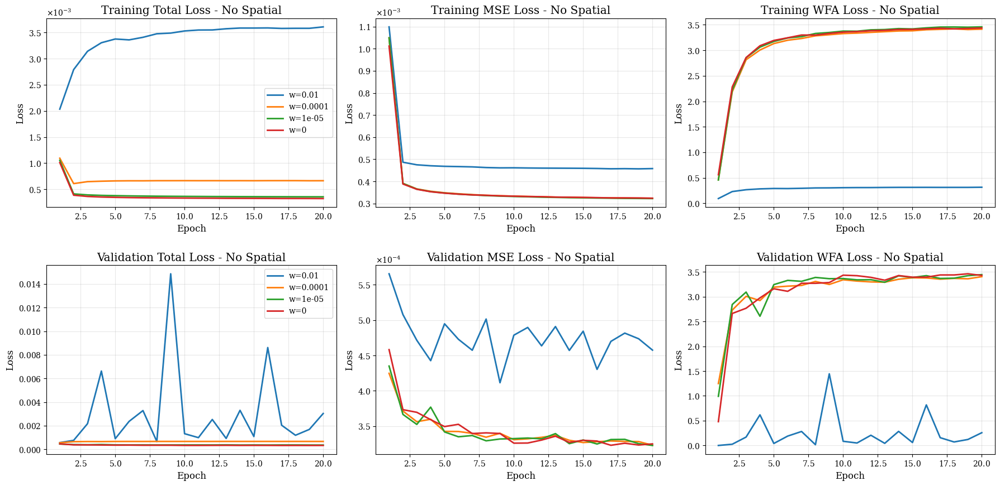

In [131]:
# Create loss metrics plots for "no_spatial" models with different colors for each WFA weight
fig, axes = plt.subplots(2, 3, figsize=(18, 9))


# Plot no_spatial models for each WFA weight across all metrics
for row in range(2):
    for col in range(3):
        metric = metrics[row][col]
        ax = axes[row, col]
        
        for config_key in model_configs['no_spatial'].keys():
            loss_key = f"no_spatial_{config_key}"
            if loss_key in loss_data:
                df = loss_data[loss_key]
                color = wfa_colors.get(config_key, 'gray')
                label = config_key.replace('wfa_weight_', 'w=')
                
                if metric in df.columns:
                    ax.plot(epochs, df[metric], color=color, linewidth=2, label=label)

        ax.set_xlabel('Epoch')
        ax.set_ylabel('Loss')
        ax.set_title(f'{metric_titles[metric]} - No Spatial')
        ax.grid(True, alpha=0.3)
        
        # Add legend only to the first subplot of each row
        if col == 0:
            ax.legend()

plt.tight_layout()
plt.savefig(images_path / "loss_metrics_wfa_weight_comparison_no_spatial.png", dpi=300, bbox_inches='tight')
plt.show()

Once having checked the metrics for each individual model, let's check the metrics for the training curves specifically of both models.

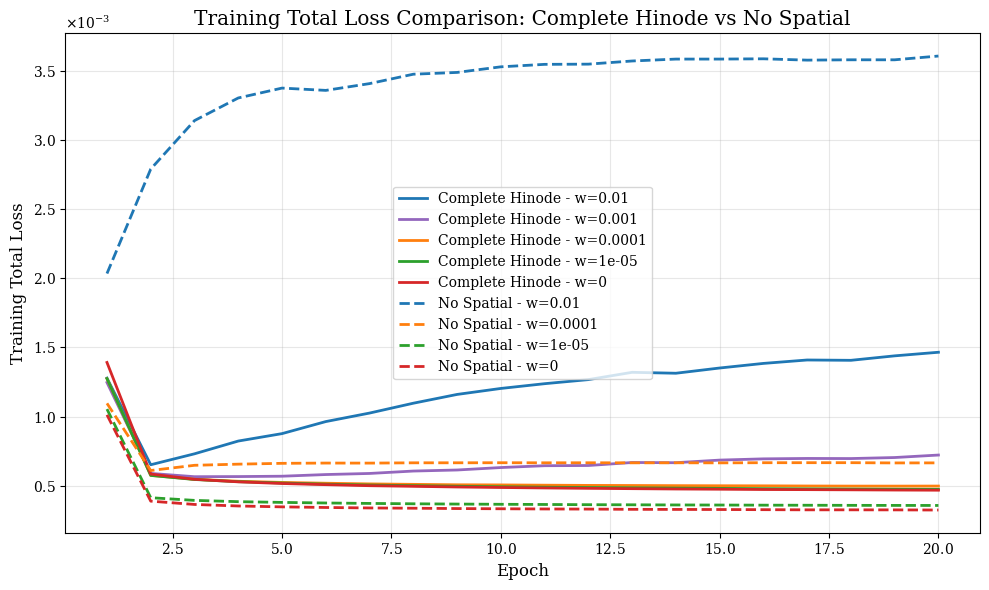

In [132]:
# Create a single plot comparing training total loss for both processing types
fig, ax = plt.subplots(1, 1, figsize=(10, 6))

epochs = np.arange(1, 21)  # Assuming 20 epochs

# Plot complete_hinode models with solid lines
for config_key in model_configs['complete_hinode'].keys():
    loss_key = f"complete_hinode_{config_key}"
    if loss_key in loss_data:
        df = loss_data[loss_key]
        color = wfa_colors.get(config_key, 'gray')
        label = f"Complete Hinode - {config_key.replace('wfa_weight_', 'w=')}"
        
        if 'train_total_loss' in df.columns:
            ax.plot(epochs, df['train_total_loss'], color=color, linewidth=2, 
                   linestyle='-', label=label)

# Plot no_spatial models with dashed lines
for config_key in model_configs['no_spatial'].keys():
    loss_key = f"no_spatial_{config_key}"
    if loss_key in loss_data:
        df = loss_data[loss_key]
        color = wfa_colors.get(config_key, 'gray')
        label = f"No Spatial - {config_key.replace('wfa_weight_', 'w=')}"
        
        if 'train_total_loss' in df.columns:
            ax.plot(epochs, df['train_total_loss'], color=color, linewidth=2, 
                   linestyle='--', label=label)

ax.set_xlabel('Epoch')
ax.set_ylabel('Training Total Loss')
ax.set_title('Training Total Loss Comparison: Complete Hinode vs No Spatial')
ax.grid(True, alpha=0.3)
ax.legend()

plt.tight_layout()
plt.savefig(images_path / "training_total_loss_comparison_both_processing_types.png", dpi=300, bbox_inches='tight')
plt.show()

### 3.2 DL Inversions on MURaM

For testing out the DL inversions it is important to have the control on how much time it takes to process the inversions. We will then define a function for doing this.

In [133]:
def measure_time(func, *args, **kwargs):
    """
    Measures the time taken by a function to execute.

    Args:
        func (callable): The function to time.
        *args: Positional arguments for func.
        **kwargs: Keyword arguments for func.

    Returns:
        tuple: A tuple containing the result of func and the elapsed time in seconds.
    """
    start = timer()
    result = func(*args, **kwargs)
    end = timer()
    elapsed = end - start
    print(f"Elapsed time: {elapsed:.4f} seconds")
    return result, elapsed

Now charge the models' weights for testing them inverting the MURaM Stokes. Once they are charged, we proceed to calculate the corresponding atmospheric parameters.

In [134]:
# Dictionary to store generated results
generated_results = {}

print("Generating results for each model configuration...")
print("=" * 60)

for processing_type, configs in model_configs.items():
    print(f"\nProcessing {processing_type.upper()} models...")
    generated_results[processing_type] = {}

    # Get corresponding data
    current_data = data_dict[processing_type]
    stokes_data_current = current_data[f'stokes_data_original_muram_{filename}']
    atm_data_current = current_data[f'atm_data_original_muram_{filename}']
    phys_maxmin_current = current_data['phys_maxmin']
    nx_current = current_data['new_nx']
    ny_current = current_data['new_ny']

    print(f"  Data shapes for {processing_type}:")
    print(f"    Stokes: {stokes_data_current.shape}")
    print(f"    Atmosphere: {atm_data_current.shape}")

    for config_key, model_name in configs.items():
        print(f"\n  Loading model: {config_key}")

        scales = [1, 2, 4]
        model = InversionModel(scales=scales,
                               nwl_points=len(wl),
                               n_outputs=atm_data_current.shape[-1]*len(new_logtau)).to(device).float()

        # Load model weights
        model_path = Path("../models/seventh_experiment") / (model_name+ ".pth")
        if model_path.exists():
            charge_weights(model=model,
                          target_dir="../models/seventh_experiment",
                          weights_name=model_name+".pth")

            model.eval()

            print(f"    Generating atmospheric parameters...")
            atm_generated, elapsed_time = measure_time(
                generate_results,
                model=model,
                stokes_data=stokes_data_current,
                atm_shape=(nx_current, ny_current, len(new_logtau), 4),
                maxmin=phys_maxmin_current,
                type_of_quantity=3,
                device=device
            )

            print(f"    Generation completed in {elapsed_time:.2f} seconds")
            print(f"    Generated shape: {atm_generated.shape}")

            generated_results[processing_type][config_key] = {
                'atm_generated': atm_generated,
                'model_name': config_key,
                'generation_time': elapsed_time
            }

            print(f"    Stored results for configuration: {config_key}")

            del model
            torch.cuda.empty_cache()
        else:
            print(f"    ERROR: Model file not found: {model_path}")

print("\n" + "=" * 60)
print("GENERATION SUMMARY:")
print("=" * 60)

for processing_type in generated_results.keys():
    print(f"\n{processing_type.upper()} models:")
    for config_key in generated_results[processing_type].keys():
        result = generated_results[processing_type][config_key]
        print(f"  {config_key}: Shape {result['atm_generated'].shape}, Time: {result['generation_time']:.2f}s")

print(f"\nTotal configurations generated: {sum(len(generated_results[key]) for key in generated_results.keys())}")


Generating results for each model configuration...

Processing COMPLETE_HINODE models...
  Data shapes for complete_hinode:
    Stokes: (230400, 4, 112)
    Atmosphere: (480, 480, 21, 4)

  Loading model: wfa_weight_0.01
[INFO] Loading model from: ../models/seventh_experiment/processing_complete_hinode_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0.01_tau_-0.9.pth
    Generating atmospheric parameters...
stokes data shape for generation: torch.Size([230400, 4, 112])


atm generated data shape : (480, 480, 21, 4)
Elapsed time: 1.4760 seconds
    Generation completed in 1.48 seconds
    Generated shape: (480, 480, 21, 4)
    Stored results for configuration: wfa_weight_0.01

  Loading model: wfa_weight_0.001
[INFO] Loading model from: ../models/seventh_experiment/processing_complete_hinode_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0.001_tau_-0.9.pth
    Generating atmospheric parameters...
stokes data shape for generation: torch.Size([230400, 4, 112])
atm generated data shape : (480, 480, 21, 4)
Elapsed time: 1.4776 seconds
    Generation completed in 1.48 seconds
    Generated shape: (480, 480, 21, 4)
    Stored results for configuration: wfa_weight_0.001

  Loading model: wfa_weight_0.0001
[INFO] Loading model from: ../models/seventh_experiment/processing_complete_hinode_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0.0001_tau_-0.9.pth
    Generating atmospheric parameters...
stokes data shape for generation: torch.Size([230400, 4, 112])
atm gener

For testing out the effectiveness of our methodology, we will compare the resulting generated results with the actual values of the MURaM simulation. For doing this we will calculate the RMSE, RRMSE and pearson correlation coefficient.

In [135]:
# Dictionary to store evaluation metrics
evaluation_metrics = {}

print("Calculating evaluation metrics for each model configuration...")
print("=" * 70)

for processing_type in generated_results.keys():
    print(f"\n{processing_type.upper()} Processing:")
    evaluation_metrics[processing_type] = {}
    
    # Get original atmospheric data for comparison
    atm_original = data_dict[processing_type][f'atm_data_original_muram_{filename}']
    
    for config_key in generated_results[processing_type].keys():
        atm_generated = generated_results[processing_type][config_key]['atm_generated']
        
        # Calculate metrics for each atmospheric parameter
        metrics = {}
        
        # Calculate overall metrics (all tau levels)
        for param_idx, param_name in enumerate(['Temperature', 'Density', 'Velocity', 'B_LOS']):
            orig_flat = atm_original[..., param_idx].flatten()
            gen_flat = atm_generated[..., param_idx].flatten()
            
            # Convert velocity from cm/s to km/s
            if param_idx == 2:  # Velocity parameter
                orig_flat = orig_flat
                gen_flat = gen_flat / 1e5
            
            # RMSE
            rmse_val = rmse(orig_flat, gen_flat)
            
            # Pearson correlation
            corr_val, p_val = pearsonr(orig_flat, gen_flat)
            
            # Relative RMSE (%)
            mean_orig = np.mean(np.abs(orig_flat))
            rrmse_val = (rmse_val / mean_orig * 100) if mean_orig != 0 else 0
            
            metrics[param_name] = {
                'RMSE': rmse_val,
                'RRMSE(%)': rrmse_val,
                'Correlation': corr_val,
                'P-value': p_val
            }
        
        evaluation_metrics[processing_type][config_key] = metrics
        
        print(f"\n  {config_key}:")
        for param_name, param_metrics in metrics.items():
            print(f"    {param_name}:")
            print(f"      RMSE: {param_metrics['RMSE']:.4f}")
            print(f"      RRMSE: {param_metrics['RRMSE(%)']:.2f}%")
            print(f"      Correlation: {param_metrics['Correlation']:.4f}")

print(f"\nMetrics calculation completed for all configurations.")

Calculating evaluation metrics for each model configuration...

COMPLETE_HINODE Processing:



  wfa_weight_0.01:
    Temperature:
      RMSE: 87.5150
      RRMSE: 1.71%
      Correlation: 0.9864
    Density:
      RMSE: 0.0220
      RRMSE: 0.32%
      Correlation: 0.9969
    Velocity:
      RMSE: 0.6148
      RRMSE: 45.17%
      Correlation: 0.9280
    B_LOS:
      RMSE: 42.5978
      RRMSE: 484.97%
      Correlation: 0.1779

  wfa_weight_0.001:
    Temperature:
      RMSE: 86.2604
      RRMSE: 1.69%
      Correlation: 0.9867
    Density:
      RMSE: 0.0222
      RRMSE: 0.32%
      Correlation: 0.9970
    Velocity:
      RMSE: 0.6220
      RRMSE: 45.69%
      Correlation: 0.9268
    B_LOS:
      RMSE: 25.6048
      RRMSE: 291.50%
      Correlation: 0.3031

  wfa_weight_0.0001:
    Temperature:
      RMSE: 87.7136
      RRMSE: 1.71%
      Correlation: 0.9865
    Density:
      RMSE: 0.0227
      RRMSE: 0.33%
      Correlation: 0.9969
    Velocity:
      RMSE: 0.6176
      RRMSE: 45.37%
      Correlation: 0.9271
    B_LOS:
      RMSE: 19.2010
      RRMSE: 218.60%
      Correlati

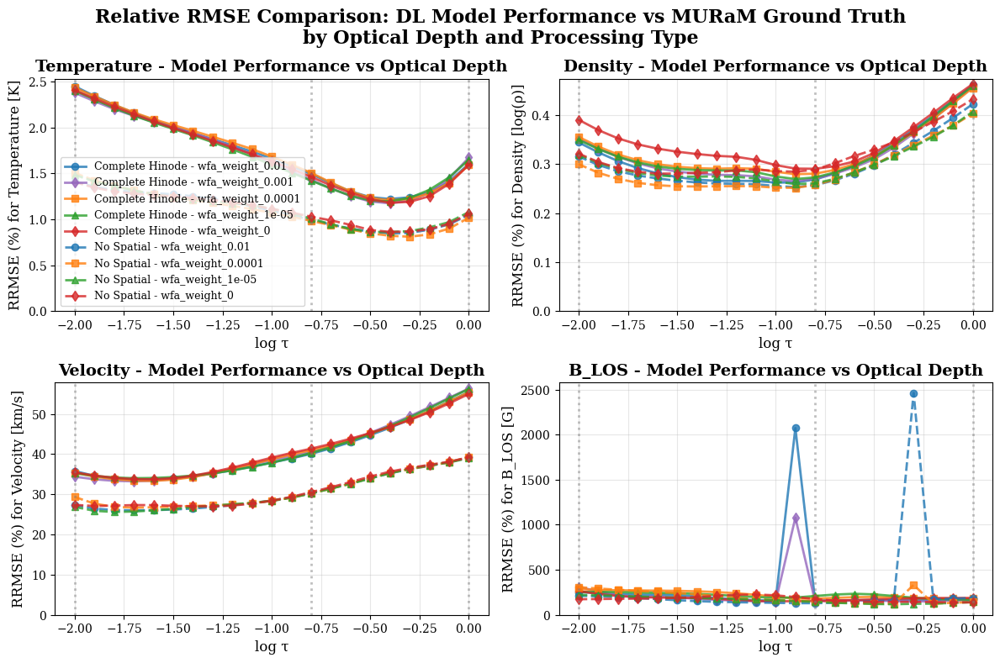

In [136]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.flatten()

atm_params = ['Temperature', 'Density', 'Velocity', 'B_LOS']
param_units = ['[K]', '[log(ρ)]', '[km/s]', '[G]']

for param_idx, (param_name, unit) in enumerate(zip(atm_params, param_units)):
    ax = axes[param_idx]
    for processing_type in model_configs:
        for config_key, config_name in model_configs[processing_type].items():
            if config_key in generated_results[processing_type]:
                atm_original = data_dict[processing_type][f'atm_data_original_muram_{filename}']
                atm_generated = generated_results[processing_type][config_key]['atm_generated']
                rrmse_values = []
                for depth_idx in range(len(new_logtau)):
                    orig_depth = atm_original[:, :, depth_idx, param_idx].flatten()
                    gen_depth = atm_generated[:, :, depth_idx, param_idx].flatten()
                    if param_idx == 2:  # Velocity
                        gen_depth = gen_depth / 1e5
                    rmse_val = rmse(orig_depth, gen_depth)
                    mean_orig = np.mean(np.abs(orig_depth))
                    rrmse_val = (rmse_val / mean_orig * 100) if mean_orig != 0 else 0
                    rrmse_values.append(rrmse_val)
                # Set line style: solid for complete_hinode, dashed for no_spatial
                line_style = '-' if processing_type == 'complete_hinode' else '--'
                marker_style = 'o' if config_key == 'wfa_weight_0.01' else (
                    's' if config_key == 'wfa_weight_0.0001' else (
                        '^' if config_key == 'wfa_weight_1e-05' else 'd'))
                label = f"{processing_type.replace('_', ' ').title()} - {config_key}"
                ax.plot(new_logtau, rrmse_values,
                        linestyle=line_style, marker=marker_style,
                        color=wfa_colors[config_key], alpha=0.8,
                        linewidth=2, markersize=6, label=label)
    ax.set_xlabel('log τ', fontsize=12)
    ax.set_ylabel(f'RRMSE (%) for {param_name} {unit}', fontsize=12)
    ax.set_title(f'{param_name} - Model Performance vs Optical Depth', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    if param_idx == 0:
        ax.legend(fontsize=9, loc='best')
    modest_tau_values = [-2.0, -0.8, 0.0]
    for tau_val in modest_tau_values:
        ax.axvline(x=tau_val, color='gray', linestyle=':', alpha=0.5)
    ax.set_ylim(bottom=0)

plt.suptitle('Relative RMSE Comparison: DL Model Performance vs MURaM Ground Truth\nby Optical Depth and Processing Type',
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(images_path / "dl_model_rrmse_comparison_by_optical_depth_new_configs.png", dpi=300, bbox_inches='tight')
plt.show()


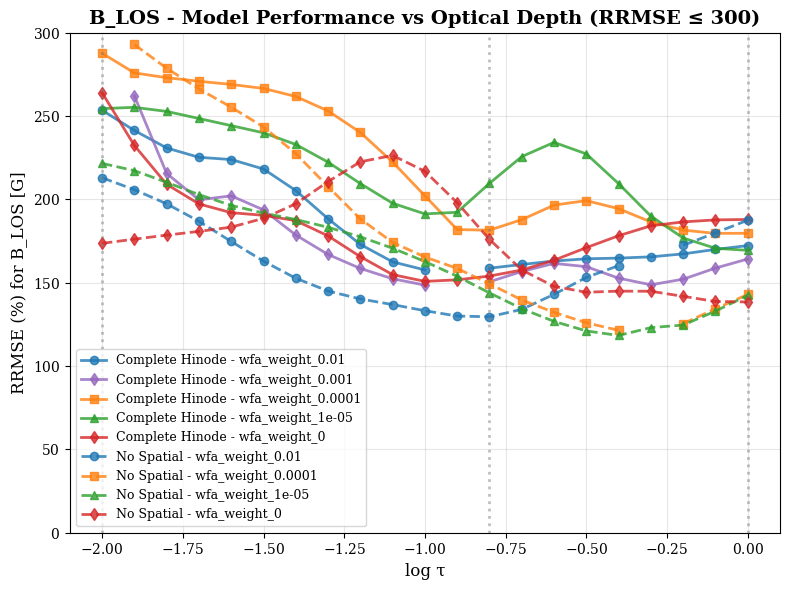

In [137]:
# Plot RRMSE for B_LOS only, excluding values over 300
fig, ax = plt.subplots(figsize=(8, 6))

param_idx = 3  # Index for B_LOS
param_name = 'B_LOS'
unit = '[G]'

for processing_type in model_configs:
    for config_key, config_name in model_configs[processing_type].items():
        if config_key in generated_results[processing_type]:
            atm_original = data_dict[processing_type][f'atm_data_original_muram_{filename}']
            atm_generated = generated_results[processing_type][config_key]['atm_generated']
            rrmse_values = []
            for depth_idx in range(len(new_logtau)):
                orig_depth = atm_original[:, :, depth_idx, param_idx].flatten()
                gen_depth = atm_generated[:, :, depth_idx, param_idx].flatten()
                rmse_val = rmse(orig_depth, gen_depth)
                mean_orig = np.mean(np.abs(orig_depth))
                rrmse_val = (rmse_val / mean_orig * 100) if mean_orig != 0 else 0
                # Exclude RRMSE values over 300
                if rrmse_val <= 300:
                    rrmse_values.append(rrmse_val)
                else:
                    rrmse_values.append(np.nan)
            line_style = '-' if processing_type == 'complete_hinode' else '--'
            marker_style = 'o' if config_key == 'wfa_weight_0.01' else (
                's' if config_key == 'wfa_weight_0.0001' else (
                    '^' if config_key == 'wfa_weight_1e-05' else 'd'))
            label = f"{processing_type.replace('_', ' ').title()} - {config_key}"
            ax.plot(new_logtau, rrmse_values,
                    linestyle=line_style,
                    marker=marker_style,
                    color=wfa_colors[config_key], alpha=0.8,
                    linewidth=2, markersize=6, label=label)

ax.set_xlabel('log τ', fontsize=12)
ax.set_ylabel(f'RRMSE (%) for {param_name} {unit}', fontsize=12)
ax.set_title(f'{param_name} - Model Performance vs Optical Depth (RRMSE ≤ 300)', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(fontsize=9, loc='best')
modest_tau_values = [-2.0, -0.8, 0.0]
for tau_val in modest_tau_values:
    ax.axvline(x=tau_val, color='gray', linestyle=':', alpha=0.5)
ax.set_ylim(bottom=0, top=300)

plt.tight_layout()
plt.savefig(images_path / "dl_model_rrmse_blos_optical_depth_filtered.png", dpi=300, bbox_inches='tight')
plt.show()

Now that we have the generated the RRMSE plots per each optical depth, let's create the scatter plots and the distribution plots for each optical depth for each quantity.

In [138]:
# Define the optical depth index you want to analyze
tau_indices_to_analyze = np.arange(0, 21)  # Add the indices you want to analyze

In [139]:
def create_muram_tau_analysis_plots(target_tau_idx, new_logtau, generated_results, data_dict, filename, images_path, atm_params, param_units, rmse, pearsonr):
    """
    Create distribution plots and detailed statistics for a specific optical depth level.

    Parameters:
    -----------
    target_tau_idx : int
        Index of the target optical depth level
    new_logtau : array
        Array of log tau values
    generated_results : dict
        Dictionary containing generated atmospheric data
    data_dict : dict
        Dictionary containing original atmospheric data
    filename : str
        Filename identifier
    images_path : Path
        Path to save images
    atm_params : list
        List of atmospheric parameter names
    param_units : list
        List of parameter units
    rmse : function
        RMSE calculation function
    pearsonr : function
        Pearson correlation function
    """
    target_tau_value = new_logtau[target_tau_idx]

    print(f"Analyzing optical depth: log τ = {target_tau_value:.1f} (index {target_tau_idx})")

    # Create MURAM parent folder
    muram_folder = images_path / "MURAM"
    muram_folder.mkdir(exist_ok=True)

    # Loop through model_configs for each processing type
    for processing_type in model_configs.keys():
        for config_key in model_configs[processing_type].keys():
            if config_key in generated_results[processing_type]:
                # Create model-specific subfolder
                model_name = f"{processing_type}_{config_key}"
                model_folder = muram_folder / model_name
                model_folder.mkdir(exist_ok=True)

                # Create tau-specific subfolder within the model folder
                tau_subfolder = model_folder / f"tau_{target_tau_value:.1f}"
                tau_subfolder.mkdir(exist_ok=True)

                # Create histograms subfolder within the tau folder
                histograms_folder = tau_subfolder / "histograms"
                histograms_folder.mkdir(exist_ok=True)

                fig = plt.figure(figsize=(12, 6))

                config_label = config_key.replace('wfa_weight_', 'w=')
                processing_label = processing_type.replace('_', ' ').title()

                # Create subplots: 2x2 grid for 4 parameters
                for param_idx, (param_name, unit) in enumerate(zip(atm_params, param_units)):
                    ax = plt.subplot(2, 2, param_idx + 1)

                    # Get data
                    atm_original = data_dict[processing_type][f'atm_data_original_muram_{filename}']
                    atm_generated = generated_results[processing_type][config_key]['atm_generated']

                    orig_data = atm_original[:, :, target_tau_idx, param_idx].flatten()
                    gen_data = atm_generated[:, :, target_tau_idx, param_idx].flatten()

                    if param_idx == 2:  # Velocity
                        gen_data = gen_data / 1e5

                    # Plot histograms
                    bins = 50
                    alpha_val = 0.7

                    ax.hist(orig_data, bins=bins, alpha=alpha_val,
                           color='blue', label='Original (MURaM)',
                           histtype='step', linewidth=2)
                    ax.hist(gen_data, bins=bins, alpha=alpha_val,
                           color='red', label='Generated (DL Model)',
                           histtype='step', linewidth=2, linestyle='--')

                    ax.set_xlabel(f'{param_name} {unit}')
                    ax.set_ylabel('Frequency')
                    ax.set_title(f'{param_name} Distribution')
                    ax.grid(True, alpha=0.3)
                    ax.legend()

                plt.suptitle(f'{processing_label} - {config_label}\nDistributions at log τ = {target_tau_value:.1f}',
                            fontsize=16, fontweight='bold')
                plt.tight_layout()

                # Save individual plot in histograms subfolder
                filename_safe = f"dl_model_{processing_type}_{config_key}_distributions.png"
                plt.savefig(histograms_folder / filename_safe, dpi=300, bbox_inches='tight')
                plt.close()

    # Print detailed statistics for the target optical depth
    print(f"\n{'='*100}")
    print(f"DETAILED STATISTICS FOR log τ = {target_tau_value:.1f}")
    print("="*100)

    for param_idx, param_name in enumerate(atm_params):
        print(f"\n{param_name.upper()}:")
        print("-" * 80)

        for processing_type in model_configs.keys():
            print(f"\n{processing_type.replace('_', ' ').title()} Processing:")

            for config_key in model_configs[processing_type].keys():
                if config_key in generated_results[processing_type]:
                    atm_original = data_dict[processing_type][f'atm_data_original_muram_{filename}']
                    atm_generated = generated_results[processing_type][config_key]['atm_generated']

                    orig_data = atm_original[:, :, target_tau_idx, param_idx].flatten()
                    gen_data = atm_generated[:, :, target_tau_idx, param_idx].flatten()

                    if param_idx == 2:  # Velocity
                        gen_data = gen_data / 1e5

                    # Calculate statistics
                    correlation, p_value = pearsonr(orig_data, gen_data)
                    rmse_val = rmse(orig_data, gen_data)
                    mean_orig = np.mean(np.abs(orig_data))
                    rrmse_val = (rmse_val / mean_orig * 100) if mean_orig != 0 else 0

                    config_label = config_key.replace('wfa_weight_', 'w=')

                    print(f"  {config_label}:")
                    print(f"    Correlation: {correlation:.4f} (p-value: {p_value:.2e})")
                    print(f"    RMSE: {rmse_val:.4f}")
                    print(f"    RRMSE: {rrmse_val:.2f}%")
                    print(f"    Original range: {orig_data.min():.3f} to {orig_data.max():.3f}")
                    print(f"    Generated range: {gen_data.min():.3f} to {gen_data.max():.3f}")

# Define atmospheric parameters
atm_params = ['Temperature', 'Density', 'Velocity', 'B_LOS']
param_units = ['[K]', '[log(ρ)]', '[km/s]', '[G]']

# Example usage: Loop over multiple tau indices
for tau_idx in tau_indices_to_analyze:
    create_muram_tau_analysis_plots(
        target_tau_idx=tau_idx,
        new_logtau=new_logtau,
        generated_results=generated_results,
        data_dict=data_dict,
        filename=filename,
        images_path=images_path,
        atm_params=atm_params,
        param_units=param_units,
        rmse=rmse,
        pearsonr=pearsonr
    )


Analyzing optical depth: log τ = -2.0 (index 0)



DETAILED STATISTICS FOR log τ = -2.0

TEMPERATURE:
--------------------------------------------------------------------------------

Complete Hinode Processing:
  w=0.01:
    Correlation: 0.8877 (p-value: 0.00e+00)
    RMSE: 111.2767
    RRMSE: 2.45%
    Original range: 3599.245 to 5824.203
    Generated range: 3703.125 to 5642.976
  w=0.001:
    Correlation: 0.8897 (p-value: 0.00e+00)
    RMSE: 108.0614
    RRMSE: 2.38%
    Original range: 3599.245 to 5824.203
    Generated range: 3708.465 to 5556.201
  w=0.0001:
    Correlation: 0.8860 (p-value: 0.00e+00)
    RMSE: 110.6218
    RRMSE: 2.43%
    Original range: 3599.245 to 5824.203
    Generated range: 3742.910 to 5676.044
  w=1e-05:
    Correlation: 0.8884 (p-value: 0.00e+00)
    RMSE: 109.1793
    RRMSE: 2.40%
    Original range: 3599.245 to 5824.203
    Generated range: 3830.617 to 5732.098
  w=0:
    Correlation: 0.8887 (p-value: 0.00e+00)
    RMSE: 109.3571
    RRMSE: 2.41%
    Original range: 3599.245 to 5824.203
    Generated 

In [140]:
def create_muram_tau_scatter_plots(target_tau_idx, new_logtau, generated_results, data_dict, filename, images_path, atm_params, param_units, rmse, pearsonr):
    """
    Create scatter plots for a specific optical depth level using the same subfolder structure as the histogram plots.

    Parameters:
    -----------
    target_tau_idx : int
        Index of the target optical depth level
    new_logtau : array
        Array of log tau values
    generated_results : dict
        Dictionary containing generated atmospheric data
    data_dict : dict
        Dictionary containing original atmospheric data
    filename : str
        Filename identifier
    images_path : Path
        Path to save images
    atm_params : list
        List of atmospheric parameter names
    param_units : list
        List of parameter units
    rmse : function
        RMSE calculation function
    pearsonr : function
        Pearson correlation function
    """
    target_tau_value = new_logtau[target_tau_idx]
    print(f"Creating scatter plots for optical depth: log τ = {target_tau_value:.1f} (index {target_tau_idx})")

    # Create MURAM parent folder
    muram_folder = images_path / "MURAM"
    muram_folder.mkdir(exist_ok=True)

    # Loop through model_configs for each processing type
    for processing_type in model_configs.keys():
        for config_key in model_configs[processing_type].keys():
            if config_key in generated_results[processing_type]:
                # Create model-specific subfolder
                model_name = f"{processing_type}_{config_key}"
                model_folder = muram_folder / model_name
                model_folder.mkdir(exist_ok=True)

                # Create tau-specific subfolder within the model folder
                tau_subfolder = model_folder / f"tau_{target_tau_value:.1f}"
                tau_subfolder.mkdir(exist_ok=True)

                # Create scatter_plots subfolder within the tau folder
                scatter_folder = tau_subfolder / "scatter_plots"
                scatter_folder.mkdir(exist_ok=True)

                fig = plt.figure(figsize=(12, 10))

                config_label = config_key.replace('wfa_weight_', 'w=')
                processing_label = processing_type.replace('_', ' ').title()

                # Create subplots: 2x2 grid for 4 parameters
                for param_idx, (param_name, unit) in enumerate(zip(atm_params, param_units)):
                    ax = plt.subplot(2, 2, param_idx + 1)

                    # Get data
                    atm_original = data_dict[processing_type][f'atm_data_original_muram_{filename}']
                    atm_generated = generated_results[processing_type][config_key]['atm_generated']

                    orig_data = atm_original[:, :, target_tau_idx, param_idx].flatten()
                    gen_data = atm_generated[:, :, target_tau_idx, param_idx].flatten()

                    if param_idx == 2:  # Velocity
                        gen_data = gen_data / 1e5

                    # Create scatter plot
                    ax.scatter(orig_data, gen_data, alpha=0.6, s=1, c='blue')

                    # Add 1:1 line
                    plot_min = min(orig_data.min(), gen_data.min())
                    plot_max = max(orig_data.max(), gen_data.max())
                    ax.plot([plot_min, plot_max], [plot_min, plot_max], 'r--', linewidth=2)

                    # Calculate and add statistics
                    correlation, p_value = pearsonr(orig_data, gen_data)
                    rmse_val = rmse(orig_data, gen_data)
                    mean_orig = np.mean(np.abs(orig_data))
                    rrmse_val = (rmse_val / mean_orig * 100) if mean_orig != 0 else 0

                    stats_text = f'Corr: {correlation:.3f}\nRMSE: {rmse_val:.3f}\nRRMSE: {rrmse_val:.1f}%'
                    ax.text(0.05, 0.95, stats_text, transform=ax.transAxes,
                            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8),
                            verticalalignment='top', fontsize=9)

                    ax.set_xlabel(f'Original {param_name} {unit}')
                    ax.set_ylabel(f'Generated {param_name} {unit}')
                    ax.set_title(f'{param_name} Scatter Plot')
                    ax.grid(True, alpha=0.3)
                    ax.set_xlim(plot_min, plot_max)
                    ax.set_ylim(plot_min, plot_max)

                plt.suptitle(f'{processing_label} - {config_label}\nScatter Plots at log τ = {target_tau_value:.1f}',
                            fontsize=16, fontweight='bold')
                plt.tight_layout()

                # Save individual scatter plot in scatter_plots subfolder
                filename_safe = f"dl_model_{processing_type}_{config_key}_tau_{target_tau_value:.1f}_scatter.png"
                plt.savefig(scatter_folder / filename_safe, dpi=300, bbox_inches='tight')
                plt.close()

# Example usage: Loop over multiple tau indices for scatter plots
for tau_idx in tau_indices_to_analyze:
    create_muram_tau_scatter_plots(
        target_tau_idx=tau_idx,
        new_logtau=new_logtau,
        generated_results=generated_results,
        data_dict=data_dict,
        filename=filename,
        images_path=images_path,
        atm_params=atm_params,
        param_units=param_units,
        rmse=rmse,
        pearsonr=pearsonr
    )

Creating scatter plots for optical depth: log τ = -2.0 (index 0)


Creating scatter plots for optical depth: log τ = -1.9 (index 1)
Creating scatter plots for optical depth: log τ = -1.8 (index 2)
Creating scatter plots for optical depth: log τ = -1.7 (index 3)
Creating scatter plots for optical depth: log τ = -1.6 (index 4)
Creating scatter plots for optical depth: log τ = -1.5 (index 5)
Creating scatter plots for optical depth: log τ = -1.4 (index 6)
Creating scatter plots for optical depth: log τ = -1.3 (index 7)
Creating scatter plots for optical depth: log τ = -1.2 (index 8)
Creating scatter plots for optical depth: log τ = -1.1 (index 9)
Creating scatter plots for optical depth: log τ = -1.0 (index 10)
Creating scatter plots for optical depth: log τ = -0.9 (index 11)
Creating scatter plots for optical depth: log τ = -0.8 (index 12)
Creating scatter plots for optical depth: log τ = -0.7 (index 13)
Creating scatter plots for optical depth: log τ = -0.6 (index 14)
Creating scatter plots for optical depth: log τ = -0.5 (index 15)
Creating scatter pl

In [141]:
def create_muram_individual_surface_plots(
    generated_results, data_dict, filename, images_path, model_configs, new_logtau, atm_params, param_units, rmse, pearsonr
):
    """
    Create individual surface plots for each optical depth and parameter,
    comparing MURaM ground truth and DL model results.
    Each plot is saved in: images_path / "MURAM" / {model_folder} / tau_{tau_value} / surface_plots / {param_name} /
    """
    print("Creating individual MURaM surface plots for each optical depth and parameter...")
    print("=" * 80)

    muram_folder = images_path / "MURAM"
    muram_folder.mkdir(exist_ok=True)

    n_tau = len(new_logtau)

    for processing_type in model_configs.keys():
        for config_key in model_configs[processing_type].keys():
            if config_key in generated_results[processing_type]:
                config_label = config_key.replace('wfa_weight_', 'w=')
                processing_label = processing_type.replace('_', ' ').title()
                print(f"Processing {processing_label} - {config_label}")

                # Create model-specific folder
                model_folder = muram_folder / f"{processing_type}_{config_key}"
                model_folder.mkdir(exist_ok=True)

                atm_generated = generated_results[processing_type][config_key]['atm_generated']
                atm_original = data_dict[processing_type][f'atm_data_original_muram_{filename}']

                for tau_idx in range(n_tau):
                    tau_value = new_logtau[tau_idx]
                    tau_folder = model_folder / f"tau_{tau_value:.1f}"
                    tau_folder.mkdir(exist_ok=True)
                    surface_plots_folder = tau_folder / "surface_plots"
                    surface_plots_folder.mkdir(exist_ok=True)

                    for param_idx, (param_name, unit) in enumerate(zip(atm_params, param_units)):
                        param_folder = surface_plots_folder / param_name.lower()
                        param_folder.mkdir(exist_ok=True)

                        orig_data = atm_original[:, :, tau_idx, param_idx]
                        gen_data = atm_generated[:, :, tau_idx, param_idx]
                        if param_idx == 2:  # Velocity
                            gen_data = gen_data / 1e5

                        # Color limits from original quantiles (symmetric for velocity/B_LOS)
                        if param_name == 'Temperature':
                            vmin = np.quantile(orig_data, 0.05)
                            vmax = np.quantile(orig_data, 0.95)
                            cmap = 'hot'
                        elif param_name == 'Density':
                            vmin = np.quantile(orig_data, 0.05)
                            vmax = np.quantile(orig_data, 0.95)
                            cmap = 'viridis'
                        else:
                            vmin = np.quantile(orig_data, 0.01)
                            vmax = np.quantile(orig_data, 0.99)
                            if param_name == 'B_LOS' or param_name == 'Velocity':
                                if np.abs(vmin) > np.abs(vmax):
                                    vmax = np.abs(vmin)
                                else:
                                    vmin = -np.abs(vmax)
                            cmap = 'RdBu_r' if param_name == 'Velocity' else 'PiYG'

                        fig, axes = plt.subplots(1, 3, figsize=(21, 6))
                        # Original
                        im1 = axes[0].imshow(orig_data, cmap=cmap, origin='lower', vmin=vmin, vmax=vmax)
                        axes[0].set_title(f'Original MURaM\nlog τ = {tau_value:.1f}', fontsize=14, fontweight='bold')
                        axes[0].set_xticks([]); axes[0].set_yticks([])
                        divider1 = make_axes_locatable(axes[0])
                        cax1 = divider1.append_axes("right", size="5%", pad=0.05)
                        cbar1 = plt.colorbar(im1, cax=cax1)
                        cbar1.set_label(unit, fontsize=12)

                        # DL Model
                        im2 = axes[1].imshow(gen_data, cmap=cmap, origin='lower', vmin=vmin, vmax=vmax)
                        axes[1].set_title(f'DL Model\nlog τ = {tau_value:.1f}', fontsize=14, fontweight='bold')
                        axes[1].set_xticks([]); axes[1].set_yticks([])
                        divider2 = make_axes_locatable(axes[1])
                        cax2 = divider2.append_axes("right", size="5%", pad=0.05)
                        cbar2 = plt.colorbar(im2, cax=cax2)
                        cbar2.set_label(unit, fontsize=12)

                        # Difference
                        diff = gen_data - orig_data
                        vmin_diff = np.quantile(diff.flatten(), 0.05)
                        vmax_diff = np.quantile(diff.flatten(), 0.95)
                        im3 = axes[2].imshow(diff, cmap='coolwarm', origin='lower', vmin=vmin_diff, vmax=vmax_diff)
                        axes[2].set_title('Difference (DL - MURaM)', fontsize=14, fontweight='bold')
                        axes[2].set_xticks([]); axes[2].set_yticks([])
                        divider3 = make_axes_locatable(axes[2])
                        cax3 = divider3.append_axes("right", size="5%", pad=0.05)
                        cbar3 = plt.colorbar(im3, cax=cax3)
                        cbar3.set_label(unit, fontsize=12)

                        # Statistics
                        corr, _ = pearsonr(orig_data.flatten(), gen_data.flatten())
                        rmse_val = rmse(orig_data.flatten(), gen_data.flatten())
                        rrmse_val = (rmse_val / np.mean(np.abs(orig_data.flatten())) * 100)
                        mean_diff = np.mean(diff)
                        std_diff = np.std(diff)

                        stats_text = (f'Correlation: {corr:.3f}\n'
                                      f'RMSE: {rmse_val:.2f} {unit}\n'
                                      f'RRMSE: {rrmse_val:.1f}%')
                        axes[1].text(0.02, 0.98, stats_text, transform=axes[1].transAxes,
                                     bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.9),
                                     verticalalignment='top', fontsize=11, fontweight='bold')

                        diff_text = (f'Mean diff: {mean_diff:.2f} {unit}\n'
                                     f'Std diff: {std_diff:.2f} {unit}')
                        axes[2].text(0.02, 0.98, diff_text, transform=axes[2].transAxes,
                                     bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.9),
                                     verticalalignment='top', fontsize=11, fontweight='bold')

                        plt.suptitle(f'MURaM {param_name} Comparison at log τ = {tau_value:.1f}\n'
                                     f'{processing_label} - {config_label}',
                                     fontsize=16, fontweight='bold')
                        plt.tight_layout()

                        filename_safe = f"muram_{param_name.lower()}_tau_{tau_value:.1f}_{processing_type}_{config_key}_individual.png"
                        plt.savefig(param_folder / filename_safe, dpi=300, bbox_inches='tight')
                        plt.close()

    print("\nIndividual MURaM surface plots creation completed!")

# Usage example:
atm_params = ['Temperature', 'Density', 'Velocity', 'B_LOS']
param_units = ['[K]', '[log(ρ)]', '[km/s]', '[G]']
create_muram_individual_surface_plots(
    generated_results=generated_results,
    data_dict=data_dict,
    filename=filename,
    images_path=images_path,
    model_configs=model_configs,
    new_logtau=new_logtau,
    atm_params=atm_params,
    param_units=param_units,
    rmse=rmse,
    pearsonr=pearsonr
)

Creating individual MURaM surface plots for each optical depth and parameter...
Processing Complete Hinode - w=0.01
Processing Complete Hinode - w=0.001
Processing Complete Hinode - w=0.0001
Processing Complete Hinode - w=1e-05
Processing Complete Hinode - w=0
Processing No Spatial - w=0.01
Processing No Spatial - w=0.0001
Processing No Spatial - w=1e-05
Processing No Spatial - w=0

Individual MURaM surface plots creation completed!


### 3.2 DL inversions on MODEST

Once checking the results on the MURaM validation data, we will generate the corresponding results from the MODEST Stokes.

In [142]:
# Generate DL inversion results for MODEST data

modest_dl_results = {}

print("Generating DL inversion results for MODEST observational data...")
print("=" * 70)

for processing_type in model_configs.keys():
    print(f"\nProcessing {processing_type.upper()} models on MODEST data...")
    modest_dl_results[processing_type] = {}

    # Get MODEST Stokes data
    modest_stokes_current = modest_stokes_dict[processing_type]['stokes_data']
    ny_modest, nx_modest, n_stokes, n_wavelength = modest_stokes_current.shape
    modest_stokes_reshaped = modest_stokes_current.reshape(ny_modest * nx_modest, n_stokes, n_wavelength)
    modest_stokes_reshaped = np.ascontiguousarray(modest_stokes_reshaped, dtype=np.float32)

    # Get normalization parameters from MURaM training
    phys_maxmin_current = data_dict[processing_type]['phys_maxmin']

    for config_key, model_name in model_configs[processing_type].items():
        print(f"\n  Loading model: {config_key}")

        scales = [1, 2, 4]
        model = InversionModel(scales=scales,
                               nwl_points=n_wavelength,
                               n_outputs=len(new_logtau)*4).to(device).float()

        model_path = Path("../models/seventh_experiment") / (model_name + ".pth")
        if model_path.exists():
            charge_weights(model=model,
                          target_dir="../models/seventh_experiment",
                          weights_name=model_name + ".pth")
            model.eval()

            print(f"    Generating atmospheric parameters for MODEST data...")
            atm_generated_modest, elapsed_time = measure_time(
                generate_results,
                model=model,
                stokes_data=modest_stokes_reshaped,
                atm_shape=(ny_modest, nx_modest, len(new_logtau), 4),
                maxmin=phys_maxmin_current,
                type_of_quantity=3,
                device=device
            )

            print(f"    Generation completed in {elapsed_time:.2f} seconds")
            print(f"    Generated shape: {atm_generated_modest.shape}")

            modest_dl_results[processing_type][config_key] = {
                'atm_generated': atm_generated_modest,
                'model_name': model_name,
                'generation_time': elapsed_time,
                'stokes_shape': modest_stokes_current.shape
            }

            print(f"    Stored MODEST results for configuration: {config_key}")

            del model
            torch.cuda.empty_cache()
        else:
            print(f"    ERROR: Model file not found: {model_path}")

print("\n" + "=" * 70)
print("MODEST DL INVERSION SUMMARY:")
print("=" * 70)

for processing_type in modest_dl_results.keys():
    print(f"\n{processing_type.upper()} models:")
    for config_key in modest_dl_results[processing_type].keys():
        result = modest_dl_results[processing_type][config_key]
        print(f"  {config_key}: Shape {result['atm_generated'].shape}, Time: {result['generation_time']:.2f}s")
        print(f"    Original Stokes shape: {result['stokes_shape']}")

print(f"\nTotal MODEST configurations generated: {sum(len(modest_dl_results[key]) for key in modest_dl_results.keys())}")

Generating DL inversion results for MODEST observational data...

Processing COMPLETE_HINODE models on MODEST data...

  Loading model: wfa_weight_0.01
[INFO] Loading model from: ../models/seventh_experiment/processing_complete_hinode_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0.01_tau_-0.9.pth
    Generating atmospheric parameters for MODEST data...
stokes data shape for generation: torch.Size([20000, 4, 112])
atm generated data shape : (100, 200, 21, 4)
Elapsed time: 0.1200 seconds
    Generation completed in 0.12 seconds
    Generated shape: (100, 200, 21, 4)
    Stored MODEST results for configuration: wfa_weight_0.01

  Loading model: wfa_weight_0.001
[INFO] Loading model from: ../models/seventh_experiment/processing_complete_hinode_model_only_LOS_epochs_20_lr_0.001_wfa_weight_0.001_tau_-0.9.pth
    Generating atmospheric parameters for MODEST data...
stokes data shape for generation: torch.Size([20000, 4, 112])
atm generated data shape : (100, 200, 21, 4)
Elapsed time: 0.1192 s

#### 3.2.1 Distribution and scatter plots

For comparing out the generated results with the SPINOR 2D inversions, let's create some distribution and scatter plots

In [143]:
def create_modest_distribution_plots(modest_dl_results, spinor_atm_dict, modest_stokes_dict, images_path, atm_params, param_units, rmse, pearsonr):
    """
    Create distribution plots comparing DL model results with SPINOR 2D inversions for MODEST data
    at the three available optical depth nodes (log τ = -2.0, -0.8, 0.0), matching the MURAM configuration.
    Each model/configuration gets its own subfolder.
    """
    modest_tau_values = [-2.0, -0.8, 0.0]
    modest_tau_indices = [0, 12, 20]  # Corresponding indices in the new_logtau array

    print("Creating MODEST distribution plots for three optical depth nodes (MURAM config)...")
    print("=" * 70)

    # Create MODEST parent folder
    modest_folder = images_path / "MODEST"
    modest_folder.mkdir(exist_ok=True)

    # Loop over each processing type and config
    for processing_type in modest_dl_results.keys():
        for config_key in modest_dl_results[processing_type].keys():
            # Create model-specific subfolder
            model_subfolder = modest_folder / f"{processing_type}_{config_key}"
            model_subfolder.mkdir(exist_ok=True)

            for tau_idx, tau_value in enumerate(modest_tau_values):
                print(f"\nProcessing log τ = {tau_value:.1f} for {processing_type} - {config_key}")

                # Create tau-specific subfolder inside model subfolder
                tau_subfolder = model_subfolder / f"tau_{tau_value:.1f}"
                tau_subfolder.mkdir(exist_ok=True)

                # Create histograms subfolder
                histograms_folder = tau_subfolder / "histograms"
                histograms_folder.mkdir(exist_ok=True)

                # Only plot available parameters (skip density)
                available_params = []
                for param_idx, param_name in enumerate(atm_params):
                    if param_name.lower() == 'density':
                        continue
                    # Map parameter names to SPINOR keys
                    if param_name.lower() == 'b_los':
                        spinor_key = f"blos_tau_{tau_value}"
                    elif param_name.lower() == 'temperature':
                        spinor_key = f"temperature_tau_{tau_value}"
                    elif param_name.lower() == 'velocity':
                        spinor_key = f"velocity_tau_{tau_value}"
                    else:
                        continue
                    if spinor_key in spinor_atm_dict:
                        available_params.append((param_idx, param_name, param_units[param_idx]))

                if not available_params:
                    print(f"  No available parameters for {processing_type} - {config_key}")
                    continue

                # Create figure with 1x3 grid for 3 parameters
                fig, axes = plt.subplots(1, 3, figsize=(18, 5))
                config_label = config_key
                processing_label = processing_type.replace('_', ' ').title()

                print(f"  Creating plot for {processing_label} - {config_label}")

                for plot_idx, (param_idx, param_name, unit) in enumerate(available_params):
                    ax = axes[plot_idx]
                    # Get DL model results at the corresponding tau index
                    dl_atm_generated = modest_dl_results[processing_type][config_key]['atm_generated']
                    dl_data = dl_atm_generated[:, :, modest_tau_indices[tau_idx], param_idx].flatten()
                    # Get SPINOR 2D data for this parameter and tau value
                    if param_name.lower() == 'b_los':
                        spinor_key = f"blos_tau_{tau_value}"
                    elif param_name.lower() == 'temperature':
                        spinor_key = f"temperature_tau_{tau_value}"
                    elif param_name.lower() == 'velocity':
                        spinor_key = f"velocity_tau_{tau_value}"
                    spinor_data = spinor_atm_dict[spinor_key].flatten()
                    # Convert units if necessary
                    if param_idx == 2:  # Velocity
                        dl_data = dl_data / 1e5
                    # Plot histograms
                    bins = 50
                    alpha_val = 0.7
                    ax.hist(spinor_data, bins=bins, alpha=alpha_val, color='blue', label='SPINOR 2D',
                            histtype='step', linewidth=2)
                    ax.hist(dl_data, bins=bins, alpha=alpha_val, color='red', label='DL Model',
                            histtype='step', linewidth=2, linestyle='--')
                    # Calculate and display statistics
                    if len(spinor_data) == len(dl_data):
                        correlation, p_value = pearsonr(spinor_data, dl_data)
                        rmse_val = rmse(spinor_data, dl_data)
                        mean_spinor = np.mean(np.abs(spinor_data))
                        rrmse_val = (rmse_val / mean_spinor * 100) if mean_spinor != 0 else 0
                        stats_text = f'Corr: {correlation:.3f}\nRMSE: {rmse_val:.3f}\nRRMSE: {rrmse_val:.1f}%'
                        ax.text(0.05, 0.95, stats_text, transform=ax.transAxes,
                                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8),
                                verticalalignment='top', fontsize=9)
                    ax.set_xlabel(f'{param_name} {unit}')
                    ax.set_ylabel('Frequency')
                    ax.set_title(f'{param_name} Distribution')
                    ax.grid(True, alpha=0.3)
                    ax.legend()

                plt.suptitle(f'{processing_label} - {config_label}\nDistributions at log τ = {tau_value:.1f}',
                            fontsize=16, fontweight='bold')
                plt.tight_layout()
                # Save individual plot in histograms subfolder
                safe_config = config_key.replace('[', '').replace(']', '').replace(', ', '_')
                filename_safe = f"modest_dl_vs_spinor_{processing_type}_{safe_config}_distributions.png"
                plt.savefig(histograms_folder / filename_safe, dpi=300, bbox_inches='tight')
                plt.close()

    print("\n" + "="*100)
    print("MODEST: DL MODEL VS SPINOR 2D DETAILED STATISTICS")
    print("="*100)
    for tau_idx, tau_value in enumerate(modest_tau_values):
        print(f"\nOPTICAL DEPTH: log τ = {tau_value:.1f}")
        print("-" * 80)
        for param_idx, param_name in enumerate(atm_params):
            if param_name.lower() == 'density':
                print(f"  {param_name.upper()}: Not available in SPINOR 2D data")
                continue
            print(f"\n  {param_name.upper()}:")
            print("  " + "-" * 60)
            for processing_type in modest_dl_results.keys():
                print(f"\n    {processing_type.replace('_', ' ').title()} Processing:")
                for config_key in modest_dl_results[processing_type].keys():
                    dl_atm_generated = modest_dl_results[processing_type][config_key]['atm_generated']
                    dl_data = dl_atm_generated[:, :, modest_tau_indices[tau_idx], param_idx].flatten()
                    if param_name.lower() == 'b_los':
                        spinor_key = f"blos_tau_{tau_value}"
                    elif param_name.lower() == 'temperature':
                        spinor_key = f"temperature_tau_{tau_value}"
                    elif param_name.lower() == 'velocity':
                        spinor_key = f"velocity_tau_{tau_value}"
                    else:
                        continue
                    if spinor_key in spinor_atm_dict:
                        spinor_data = spinor_atm_dict[spinor_key].flatten()
                        if param_idx == 2:  # Velocity
                            dl_data = dl_data / 1e5
                        correlation, p_value = pearsonr(spinor_data, dl_data)
                        rmse_val = rmse(spinor_data, dl_data)
                        mean_spinor = np.mean(np.abs(spinor_data))
                        rrmse_val = (rmse_val / mean_spinor * 100) if mean_spinor != 0 else 0
                        config_label = config_key
                        print(f"      {config_label}:")
                        print(f"        Correlation: {correlation:.4f} (p-value: {p_value:.2e})")
                        print(f"        RMSE: {rmse_val:.4f}")
                        print(f"        RRMSE: {rrmse_val:.2f}%")
                        print(f"        SPINOR range: {spinor_data.min():.3f} to {spinor_data.max():.3f}")
                        print(f"        DL range: {dl_data.min():.3f} to {dl_data.max():.3f}")

# Call the function to create MODEST distribution plots
create_modest_distribution_plots(
    modest_dl_results=modest_dl_results,
    spinor_atm_dict=spinor_atm_dict,
    modest_stokes_dict=modest_stokes_dict,
    images_path=images_path,
    atm_params=atm_params,
    param_units=param_units,
    rmse=rmse,
    pearsonr=pearsonr
)


Creating MODEST distribution plots for three optical depth nodes (MURAM config)...

Processing log τ = -2.0 for complete_hinode - wfa_weight_0.01
  Creating plot for Complete Hinode - wfa_weight_0.01

Processing log τ = -0.8 for complete_hinode - wfa_weight_0.01
  Creating plot for Complete Hinode - wfa_weight_0.01

Processing log τ = 0.0 for complete_hinode - wfa_weight_0.01
  Creating plot for Complete Hinode - wfa_weight_0.01

Processing log τ = -2.0 for complete_hinode - wfa_weight_0.001
  Creating plot for Complete Hinode - wfa_weight_0.001

Processing log τ = -0.8 for complete_hinode - wfa_weight_0.001
  Creating plot for Complete Hinode - wfa_weight_0.001

Processing log τ = 0.0 for complete_hinode - wfa_weight_0.001
  Creating plot for Complete Hinode - wfa_weight_0.001

Processing log τ = -2.0 for complete_hinode - wfa_weight_0.0001
  Creating plot for Complete Hinode - wfa_weight_0.0001

Processing log τ = -0.8 for complete_hinode - wfa_weight_0.0001
  Creating plot for Compl

In [144]:
def create_modest_scatter_plots(modest_dl_results, spinor_atm_dict, modest_stokes_dict, images_path, atm_params, param_units, rmse, pearsonr):
    """
    Create scatter plots comparing DL model results with SPINOR 2D inversions for MODEST data
    at the three available optical depth nodes (log τ = -2.0, -0.8, 0.0).
    Each model/configuration gets its own subfolder.
    """
    modest_tau_values = [-2.0, -0.8, 0.0]
    modest_tau_indices = [0, 12, 20]  # Corresponding indices in the new_logtau array

    print("Creating MODEST scatter plots for three optical depth nodes (MURAM config)...")
    print("=" * 70)

    # Create MODEST parent folder
    modest_folder = images_path / "MODEST"
    modest_folder.mkdir(exist_ok=True)

    # Loop over each processing type and config
    for processing_type in modest_dl_results.keys():
        for config_key in modest_dl_results[processing_type].keys():
            # Create model-specific subfolder
            model_subfolder = modest_folder / f"{processing_type}_{config_key}"
            model_subfolder.mkdir(exist_ok=True)

            for tau_idx, tau_value in enumerate(modest_tau_values):
                print(f"\nProcessing log τ = {tau_value:.1f} for {processing_type} - {config_key}")

                # Create tau-specific subfolder inside model subfolder
                tau_subfolder = model_subfolder / f"tau_{tau_value:.1f}"
                tau_subfolder.mkdir(exist_ok=True)

                # Create scatter_plots subfolder
                scatter_folder = tau_subfolder / "scatter_plots"
                scatter_folder.mkdir(exist_ok=True)

                # Only plot available parameters (skip density)
                available_params = []
                for param_idx, param_name in enumerate(atm_params):
                    if param_name.lower() == 'density':
                        continue
                    # Map parameter names to SPINOR keys
                    if param_name.lower() == 'b_los':
                        spinor_key = f"blos_tau_{tau_value}"
                    elif param_name.lower() == 'temperature':
                        spinor_key = f"temperature_tau_{tau_value}"
                    elif param_name.lower() == 'velocity':
                        spinor_key = f"velocity_tau_{tau_value}"
                    else:
                        continue
                    if spinor_key in spinor_atm_dict:
                        available_params.append((param_idx, param_name, param_units[param_idx]))

                if not available_params:
                    print(f"  No available parameters for {processing_type} - {config_key}")
                    continue

                # Create figure with 1x3 grid for 3 parameters
                fig, axes = plt.subplots(1, 3, figsize=(18, 6))
                config_label = config_key
                processing_label = processing_type.replace('_', ' ').title()

                print(f"  Creating scatter plot for {processing_label} - {config_label}")

                for plot_idx, (param_idx, param_name, unit) in enumerate(available_params):
                    ax = axes[plot_idx]
                    # Get DL model results at the corresponding tau index
                    dl_atm_generated = modest_dl_results[processing_type][config_key]['atm_generated']
                    dl_data = dl_atm_generated[:, :, modest_tau_indices[tau_idx], param_idx].flatten()
                    # Get SPINOR 2D data for this parameter and tau value
                    if param_name.lower() == 'b_los':
                        spinor_key = f"blos_tau_{tau_value}"
                    elif param_name.lower() == 'temperature':
                        spinor_key = f"temperature_tau_{tau_value}"
                    elif param_name.lower() == 'velocity':
                        spinor_key = f"velocity_tau_{tau_value}"
                    spinor_data = spinor_atm_dict[spinor_key].flatten()
                    # Convert units if necessary
                    if param_idx == 2:  # Velocity
                        dl_data = dl_data / 1e5
                    # Create scatter plot
                    ax.scatter(spinor_data, dl_data, alpha=0.6, s=1, c='blue')
                    # Add 1:1 line
                    plot_min = min(spinor_data.min(), dl_data.min())
                    plot_max = max(spinor_data.max(), dl_data.max())
                    ax.plot([plot_min, plot_max], [plot_min, plot_max], 'r--', linewidth=2, label='1:1 line')
                    # Calculate and add statistics
                    if len(spinor_data) == len(dl_data):
                        correlation, p_value = pearsonr(spinor_data, dl_data)
                        rmse_val = rmse(spinor_data, dl_data)
                        mean_spinor = np.mean(np.abs(spinor_data))
                        rrmse_val = (rmse_val / mean_spinor * 100) if mean_spinor != 0 else 0
                        stats_text = f'Corr: {correlation:.3f}\nRMSE: {rmse_val:.3f}\nRRMSE: {rrmse_val:.1f}%'
                        ax.text(0.05, 0.95, stats_text, transform=ax.transAxes,
                                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8),
                                verticalalignment='top', fontsize=9)
                    ax.set_xlabel(f'SPINOR 2D {param_name} {unit}')
                    ax.set_ylabel(f'DL Model {param_name} {unit}')
                    ax.set_title(f'{param_name} Scatter Plot')
                    ax.grid(True, alpha=0.3)
                    ax.legend()
                    ax.set_xlim(plot_min, plot_max)
                    ax.set_ylim(plot_min, plot_max)

                plt.suptitle(f'MODEST: {processing_label} - {config_label}\nScatter Plots at log τ = {tau_value:.1f}',
                            fontsize=16, fontweight='bold')
                plt.tight_layout()
                # Save individual scatter plot in scatter_plots subfolder
                safe_config = config_key.replace('[', '').replace(']', '').replace(', ', '_')
                filename_safe = f"modest_dl_vs_spinor_{processing_type}_{safe_config}_tau_{tau_value:.1f}_scatter.png"
                plt.savefig(scatter_folder / filename_safe, dpi=300, bbox_inches='tight')
                plt.close()

    print("\n" + "="*100)
    print("MODEST: SCATTER PLOT STATISTICS SUMMARY")
    print("="*100)
    for tau_idx, tau_value in enumerate(modest_tau_values):
        print(f"\nOPTICAL DEPTH: log τ = {tau_value:.1f}")
        print("-" * 80)
        for param_idx, param_name in enumerate(atm_params):
            if param_name.lower() == 'density':
                continue
            print(f"\n  {param_name.upper()} SCATTER PLOT CORRELATIONS:")
            print("  " + "-" * 60)
            for processing_type in modest_dl_results.keys():
                print(f"\n    {processing_type.replace('_', ' ').title()} Processing:")
                for config_key in modest_dl_results[processing_type].keys():
                    dl_atm_generated = modest_dl_results[processing_type][config_key]['atm_generated']
                    dl_data = dl_atm_generated[:, :, modest_tau_indices[tau_idx], param_idx].flatten()
                    if param_name.lower() == 'b_los':
                        spinor_key = f"blos_tau_{tau_value}"
                    elif param_name.lower() == 'temperature':
                        spinor_key = f"temperature_tau_{tau_value}"
                    elif param_name.lower() == 'velocity':
                        spinor_key = f"velocity_tau_{tau_value}"
                    else:
                        continue
                    if spinor_key in spinor_atm_dict:
                        spinor_data = spinor_atm_dict[spinor_key].flatten()
                        if param_idx == 2:  # Velocity
                            dl_data = dl_data / 1e5
                        correlation, p_value = pearsonr(spinor_data, dl_data)
                        rmse_val = rmse(spinor_data, dl_data)
                        mean_spinor = np.mean(np.abs(spinor_data))
                        rrmse_val = (rmse_val / mean_spinor * 100) if mean_spinor != 0 else 0
                        config_label = config_key
                        print(f"      {config_label}:")
                        print(f"        Correlation: {correlation:.4f} (p-value: {p_value:.2e})")
                        print(f"        RMSE: {rmse_val:.4f}")
                        print(f"        RRMSE: {rrmse_val:.2f}%")
                        print(f"        SPINOR range: {spinor_data.min():.3f} to {spinor_data.max():.3f}")
                        print(f"        DL range: {dl_data.min():.3f} to {dl_data.max():.3f}")


Once having the distribution plots and the scatter plots, let's check the surface plots of each of the magnitudes for each height.

#### 3.2.2 Surface plots

Let's check now how similar the results look with some surface plots.

In [145]:
def create_modest_temperature_surface_plots(modest_dl_results, spinor_atm_dict, images_path, model_configs):
    """
    Create surface plots comparing SPINOR 2D and DL model temperature results
    for MODEST data at all three optical depth nodes, using the new model_configs
    and saving to the reorganized subfolder structure:
    MODEST/{model_folder}/surface_plots/temperature/
    """
    modest_tau_values = [-2.0, -0.8, 0.0]
    modest_tau_indices = [0, 12, 20]  # Indices in new_logtau

    print("Creating MODEST temperature surface plots for all optical depth nodes...")
    print("=" * 80)

    # Create MODEST parent folder
    modest_folder = images_path / "MODEST"
    modest_folder.mkdir(exist_ok=True)

    # Loop through model_configs for each processing type and config
    for processing_type in model_configs.keys():
        for config_key in model_configs[processing_type].keys():
            if config_key in modest_dl_results[processing_type]:
                config_label = config_key.replace('wfa_weight_', 'w=')
                processing_label = processing_type.replace('_', ' ').title()

                print(f"Creating temperature surface plots for {processing_label} - {config_label}")

                # Create model-specific folder directly under MODEST
                model_folder = modest_folder / f"{processing_type}_{config_key}"
                model_folder.mkdir(exist_ok=True)

                # Create surface_plots/temperature subfolders inside model folder
                surface_plots_folder = model_folder / "surface_plots"
                surface_plots_folder.mkdir(exist_ok=True)
                temperature_folder = surface_plots_folder / "temperature"
                temperature_folder.mkdir(exist_ok=True)

                # Get DL model results
                dl_atm_generated = modest_dl_results[processing_type][config_key]['atm_generated']

                # Create figure with 2 rows (SPINOR vs DL) and 3 columns (3 tau values)
                fig, axes = plt.subplots(2, 3, figsize=(18, 12))

                for tau_idx, tau_value in enumerate(modest_tau_values):
                    spinor_key = f"temperature_tau_{tau_value}"
                    tau_index = modest_tau_indices[tau_idx]

                    if spinor_key in spinor_atm_dict:
                        spinor_temp = spinor_atm_dict[spinor_key]
                        dl_temp = dl_atm_generated[:, :, tau_index, 0]

                        # Color limits from SPINOR quantiles
                        vmin = np.quantile(spinor_temp, 0.05)
                        vmax = np.quantile(spinor_temp, 0.95)

                        # SPINOR plot (top row)
                        ax_spinor = axes[0, tau_idx]
                        im1 = ax_spinor.imshow(spinor_temp, cmap='hot', origin='lower', vmin=vmin, vmax=vmax)
                        ax_spinor.set_title(f'SPINOR 2D Temperature\nlog τ = {tau_value:.1f}', fontsize=14, fontweight='bold')
                        ax_spinor.set_xticks([]); ax_spinor.set_yticks([])
                        divider = make_axes_locatable(ax_spinor)
                        cax1 = divider.append_axes("right", size="5%", pad=0.05)
                        cbar1 = plt.colorbar(im1, cax=cax1)
                        cbar1.set_label('[K]', fontsize=12)

                        # DL Model plot (bottom row)
                        ax_dl = axes[1, tau_idx]
                        im2 = ax_dl.imshow(dl_temp, cmap='hot', origin='lower', vmin=vmin, vmax=vmax)
                        ax_dl.set_title(f'DL Model Temperature\nlog τ = {tau_value:.1f}', fontsize=14, fontweight='bold')
                        ax_dl.set_xticks([]); ax_dl.set_yticks([])
                        divider2 = make_axes_locatable(ax_dl)
                        cax2 = divider2.append_axes("right", size="5%", pad=0.05)
                        cbar2 = plt.colorbar(im2, cax=cax2)
                        cbar2.set_label('[K]', fontsize=12)

                        # Statistics
                        correlation, _ = pearsonr(spinor_temp.flatten(), dl_temp.flatten())
                        rmse_val = rmse(spinor_temp.flatten(), dl_temp.flatten())
                        rrmse_val = (rmse_val / np.mean(np.abs(spinor_temp.flatten())) * 100)
                        stats_text = f'vs SPINOR 2D:\nCorr: {correlation:.3f}\nRMSE: {rmse_val:.1f} K\nRRMSE: {rrmse_val:.1f}%'
                        ax_dl.text(0.02, 0.98, stats_text, transform=ax_dl.transAxes,
                                   bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.9),
                                   verticalalignment='top', fontsize=10, fontweight='bold')

                axes[0, 0].set_ylabel('SPINOR 2D\nInversions', fontsize=16, fontweight='bold')
                axes[1, 0].set_ylabel('DL Model\nPredictions', fontsize=16, fontweight='bold')

                plt.suptitle(f'MODEST Temperature Comparison: {processing_label} - {config_label}\n'
                             'SPINOR 2D vs Deep Learning Model at Different Atmospheric Heights',
                             fontsize=18, fontweight='bold', y=0.95)
                plt.tight_layout()

                # Save plot in temperature subfolder
                filename_safe = f"modest_temperature_surface_comparison_{processing_type}_{config_key}.png"
                plt.savefig(temperature_folder / filename_safe, dpi=300, bbox_inches='tight')
                plt.close()

                # Print statistics summary
                print(f"  Temperature statistics for {processing_label} - {config_label}:")
                for tau_idx, tau_value in enumerate(modest_tau_values):
                    spinor_key = f"temperature_tau_{tau_value}"
                    tau_index = modest_tau_indices[tau_idx]
                    if spinor_key in spinor_atm_dict:
                        spinor_temp = spinor_atm_dict[spinor_key]
                        dl_temp = dl_atm_generated[:, :, tau_index, 0]
                        correlation, _ = pearsonr(spinor_temp.flatten(), dl_temp.flatten())
                        rmse_val = rmse(spinor_temp.flatten(), dl_temp.flatten())
                        rrmse_val = (rmse_val / np.mean(np.abs(spinor_temp.flatten())) * 100)
                        print(f"    log τ = {tau_value:4.1f}: Corr={correlation:.3f}, RMSE={rmse_val:.1f}K, RRMSE={rrmse_val:.1f}%")
                        print(f"      SPINOR range: {spinor_temp.min():.0f} - {spinor_temp.max():.0f} K")
                        print(f"      DL range:     {dl_temp.min():.0f} - {dl_temp.max():.0f} K")

    print("\nTemperature surface plots creation completed!")

# Usage example:
create_modest_temperature_surface_plots(
    modest_dl_results=modest_dl_results,
    spinor_atm_dict=spinor_atm_dict,
    images_path=images_path,
    model_configs=model_configs
)

# Individual tau-specific plots: reorganize folders as requested
print("\n" + "="*80)
print("Creating individual tau-specific temperature comparison plots with reorganized folders...")
print("="*80)

modest_tau_values = [-2.0, -0.8, 0.0]
modest_tau_indices = [0, 12, 20]

for tau_idx, tau_value in enumerate(modest_tau_values):
    tau_index = modest_tau_indices[tau_idx]

    for processing_type in model_configs.keys():
        for config_key in model_configs[processing_type].keys():
            if config_key in modest_dl_results[processing_type]:
                # Create model-specific folder directly under MODEST
                model_folder = images_path / "MODEST" / f"{processing_type}_{config_key}"
                model_folder.mkdir(exist_ok=True)

                # Create tau-specific subfolder inside model folder
                tau_subfolder = model_folder / f"tau_{tau_value:.1f}"
                tau_subfolder.mkdir(exist_ok=True)

                # Create surface_plots/temperature subfolders inside tau folder
                surface_plots_folder = tau_subfolder / "surface_plots"
                surface_plots_folder.mkdir(exist_ok=True)
                temperature_subfolder = surface_plots_folder / "temperature"
                temperature_subfolder.mkdir(exist_ok=True)

                config_label = config_key.replace('wfa_weight_', 'w=')
                processing_label = processing_type.replace('_', ' ').title()

                print(f"Creating temperature plot for log τ = {tau_value:.1f}, {processing_label} - {config_label}")

                # Get data
                spinor_key = f"temperature_tau_{tau_value}"
                dl_atm_generated = modest_dl_results[processing_type][config_key]['atm_generated']
                dl_temp = dl_atm_generated[:, :, tau_index, 0]  # Temperature is index 0

                if spinor_key in spinor_atm_dict:
                    spinor_temp = spinor_atm_dict[spinor_key]

                    # Calculate color limits using MODEST quantiles for this optical depth
                    vmin = np.quantile(spinor_temp.flatten(), 0.05)
                    vmax = np.quantile(spinor_temp.flatten(), 0.95)

                    # Create 1x3 plot: SPINOR, DL, and difference
                    fig, axes = plt.subplots(1, 3, figsize=(21, 6))

                    # SPINOR plot
                    im1 = axes[0].imshow(spinor_temp, cmap='hot', origin='lower', vmin=vmin, vmax=vmax)
                    axes[0].set_title('SPINOR 2D Temperature', fontsize=14, fontweight='bold')
                    axes[0].set_xticks([]); axes[0].set_yticks([])
                    divider1 = make_axes_locatable(axes[0])
                    cax1 = divider1.append_axes("right", size="5%", pad=0.05)
                    cbar1 = plt.colorbar(im1, cax=cax1)
                    cbar1.set_label('[K]', fontsize=12)

                    # DL Model plot
                    im2 = axes[1].imshow(dl_temp, cmap='hot', origin='lower', vmin=vmin, vmax=vmax)
                    axes[1].set_title('DL Model Temperature', fontsize=14, fontweight='bold')
                    axes[1].set_xticks([]); axes[1].set_yticks([])
                    divider2 = make_axes_locatable(axes[1])
                    cax2 = divider2.append_axes("right", size="5%", pad=0.05)
                    cbar2 = plt.colorbar(im2, cax=cax2)
                    cbar2.set_label('[K]', fontsize=12)

                    # Difference plot (DL - SPINOR)
                    diff = dl_temp - spinor_temp
                    vmin_diff = np.quantile(diff.flatten(), 0.05)
                    vmax_diff = np.quantile(diff.flatten(), 0.95)
                    im3 = axes[2].imshow(diff, cmap='coolwarm', origin='lower', vmin=vmin_diff, vmax=vmax_diff)
                    axes[2].set_title('Difference (DL - SPINOR)', fontsize=14, fontweight='bold')
                    axes[2].set_xticks([]); axes[2].set_yticks([])
                    divider3 = make_axes_locatable(axes[2])
                    cax3 = divider3.append_axes("right", size="5%", pad=0.05)
                    cbar3 = plt.colorbar(im3, cax=cax3)
                    cbar3.set_label('[K]', fontsize=12)

                    # Calculate and add statistics
                    correlation, _ = pearsonr(spinor_temp.flatten(), dl_temp.flatten())
                    rmse_val = rmse(spinor_temp.flatten(), dl_temp.flatten())
                    rrmse_val = (rmse_val / np.mean(np.abs(spinor_temp.flatten())) * 100)
                    mean_diff = np.mean(diff)
                    std_diff = np.std(diff)

                    # Add statistics text to DL and difference plots
                    stats_text = (f'Correlation: {correlation:.3f}\n'
                                  f'RMSE: {rmse_val:.1f} K\n'
                                  f'RRMSE: {rrmse_val:.1f}%')
                    axes[1].text(0.02, 0.98, stats_text, transform=axes[1].transAxes,
                                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.9),
                                verticalalignment='top', fontsize=11, fontweight='bold')

                    diff_text = (f'Mean diff: {mean_diff:.1f} K\n'
                                 f'Std diff: {std_diff:.1f} K')
                    axes[2].text(0.02, 0.98, diff_text, transform=axes[2].transAxes,
                                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.9),
                                verticalalignment='top', fontsize=11, fontweight='bold')

                    plt.suptitle(f'MODEST Temperature Comparison at log τ = {tau_value:.1f}\n'
                                 f'{processing_label} - {config_label}',
                                 fontsize=16, fontweight='bold')
                    plt.tight_layout()

                    # Save individual tau plot in the temperature subfolder inside tau folder
                    filename_safe = f"modest_temperature_tau_{tau_value:.1f}_{processing_type}_{config_key}_individual.png"
                    plt.savefig(temperature_subfolder / filename_safe, dpi=300, bbox_inches='tight')
                    plt.close()

print("\nTemperature individual surface plots creation completed!")


Creating MODEST temperature surface plots for all optical depth nodes...
Creating temperature surface plots for Complete Hinode - w=0.01
  Temperature statistics for Complete Hinode - w=0.01:
    log τ = -2.0: Corr=0.634, RMSE=4675.0K, RRMSE=1971.7%
      SPINOR range: -92 - 1754 K
      DL range:     3644 - 7096 K
    log τ = -0.8: Corr=0.175, RMSE=238.8K, RRMSE=4.4%
      SPINOR range: 4948 - 6210 K
      DL range:     4827 - 6462 K
    log τ =  0.0: Corr=0.714, RMSE=159.3K, RRMSE=2.5%
      SPINOR range: 5469 - 7087 K
      DL range:     5568 - 7170 K
Creating temperature surface plots for Complete Hinode - w=0.001
  Temperature statistics for Complete Hinode - w=0.001:
    log τ = -2.0: Corr=0.415, RMSE=4933.9K, RRMSE=2080.9%
      SPINOR range: -92 - 1754 K
      DL range:     4094 - 6596 K
    log τ = -0.8: Corr=0.322, RMSE=418.0K, RRMSE=7.7%
      SPINOR range: 4948 - 6210 K
      DL range:     4052 - 6057 K
    log τ =  0.0: Corr=0.546, RMSE=264.2K, RRMSE=4.1%
      SPINOR rang

  Temperature statistics for No Spatial - w=1e-05:
    log τ = -2.0: Corr=0.228, RMSE=4792.2K, RRMSE=2021.2%
      SPINOR range: -92 - 1754 K
      DL range:     2780 - 6445 K
    log τ = -0.8: Corr=0.346, RMSE=408.2K, RRMSE=7.5%
      SPINOR range: 4948 - 6210 K
      DL range:     4475 - 6293 K
    log τ =  0.0: Corr=0.748, RMSE=261.8K, RRMSE=4.1%
      SPINOR range: 5469 - 7087 K
      DL range:     5013 - 7401 K
Creating temperature surface plots for No Spatial - w=0
  Temperature statistics for No Spatial - w=0:
    log τ = -2.0: Corr=0.619, RMSE=4594.3K, RRMSE=1937.7%
      SPINOR range: -92 - 1754 K
      DL range:     2618 - 6707 K
    log τ = -0.8: Corr=0.004, RMSE=475.7K, RRMSE=8.7%
      SPINOR range: 4948 - 6210 K
      DL range:     3621 - 5908 K
    log τ =  0.0: Corr=0.741, RMSE=279.6K, RRMSE=4.4%
      SPINOR range: 5469 - 7087 K
      DL range:     5076 - 8158 K

Temperature surface plots creation completed!

Creating individual tau-specific temperature comparison plot

In [146]:
def create_modest_velocity_surface_plots(modest_dl_results, spinor_atm_dict, images_path, model_configs):
    """
    Create surface plots comparing SPINOR 2D and DL model velocity results
    for MODEST data at all three optical depth nodes, using the new model_configs
    and saving to the reorganized subfolder structure:
    MODEST/{model_folder}/surface_plots/velocity/
    """
    modest_tau_values = [-2.0, -0.8, 0.0]
    modest_tau_indices = [0, 12, 20]  # Indices in new_logtau

    print("Creating MODEST velocity surface plots for all optical depth nodes...")
    print("=" * 80)

    # Create MODEST parent folder
    modest_folder = images_path / "MODEST"
    modest_folder.mkdir(exist_ok=True)

    # Loop through model_configs for each processing type and config
    for processing_type in model_configs.keys():
        for config_key in model_configs[processing_type].keys():
            if config_key in modest_dl_results[processing_type]:
                config_label = config_key.replace('wfa_weight_', 'w=')
                processing_label = processing_type.replace('_', ' ').title()

                print(f"Creating velocity surface plots for {processing_label} - {config_label}")

                # Create model-specific folder directly under MODEST
                model_folder = modest_folder / f"{processing_type}_{config_key}"
                model_folder.mkdir(exist_ok=True)

                # Create surface_plots/velocity subfolders inside model folder
                surface_plots_folder = model_folder / "surface_plots"
                surface_plots_folder.mkdir(exist_ok=True)
                velocity_folder = surface_plots_folder / "velocity"
                velocity_folder.mkdir(exist_ok=True)

                # Get DL model results
                dl_atm_generated = modest_dl_results[processing_type][config_key]['atm_generated']

                # Create figure with 2 rows (SPINOR vs DL) and 3 columns (3 tau values)
                fig, axes = plt.subplots(2, 3, figsize=(18, 12))

                for tau_idx, tau_value in enumerate(modest_tau_values):
                    spinor_key = f"velocity_tau_{tau_value}"
                    tau_index = modest_tau_indices[tau_idx]

                    if spinor_key in spinor_atm_dict:
                        spinor_vel = spinor_atm_dict[spinor_key]
                        dl_vel = dl_atm_generated[:, :, tau_index, 2] / 1e5  # Velocity is index 2, convert from cm/s to km/s

                        # Color limits from SPINOR quantiles, symmetric
                        vmin = np.quantile(spinor_vel, 0.01)
                        vmax = np.quantile(spinor_vel, 0.99)
                        if np.abs(vmin) > np.abs(vmax):
                            vmax = np.abs(vmin)
                        else:
                            vmin = -np.abs(vmax)

                        # SPINOR plot (top row)
                        ax_spinor = axes[0, tau_idx]
                        im1 = ax_spinor.imshow(spinor_vel, cmap='RdBu_r', origin='lower', vmin=vmin, vmax=vmax)
                        ax_spinor.set_title(f'SPINOR 2D $v_{{\\text{{LOS}}}}$\nlog τ = {tau_value:.1f}', fontsize=14, fontweight='bold')
                        ax_spinor.set_xticks([]); ax_spinor.set_yticks([])
                        divider = make_axes_locatable(ax_spinor)
                        cax1 = divider.append_axes("right", size="5%", pad=0.05)
                        cbar1 = plt.colorbar(im1, cax=cax1)
                        cbar1.set_label('[km/s]', fontsize=12)

                        # DL Model plot (bottom row)
                        ax_dl = axes[1, tau_idx]
                        im2 = ax_dl.imshow(dl_vel, cmap='RdBu_r', origin='lower', vmin=vmin, vmax=vmax)
                        ax_dl.set_title(f'DL Model $v_{{\\text{{LOS}}}}$\nlog τ = {tau_value:.1f}', fontsize=14, fontweight='bold')
                        ax_dl.set_xticks([]); ax_dl.set_yticks([])
                        divider2 = make_axes_locatable(ax_dl)
                        cax2 = divider2.append_axes("right", size="5%", pad=0.05)
                        cbar2 = plt.colorbar(im2, cax=cax2)
                        cbar2.set_label('[km/s]', fontsize=12)

                        # Statistics
                        correlation, _ = pearsonr(spinor_vel.flatten(), dl_vel.flatten())
                        rmse_val = rmse(spinor_vel.flatten(), dl_vel.flatten())
                        rrmse_val = (rmse_val / np.mean(np.abs(spinor_vel.flatten())) * 100)
                        stats_text = f'vs SPINOR 2D:\nCorr: {correlation:.3f}\nRMSE: {rmse_val:.3f} km/s\nRRMSE: {rrmse_val:.1f}%'
                        ax_dl.text(0.02, 0.98, stats_text, transform=ax_dl.transAxes,
                                   bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.9),
                                   verticalalignment='top', fontsize=10, fontweight='bold')

                axes[0, 0].set_ylabel('SPINOR 2D\nInversions', fontsize=16, fontweight='bold')
                axes[1, 0].set_ylabel('DL Model\nPredictions', fontsize=16, fontweight='bold')

                plt.suptitle(f'MODEST $v_{{\\text{{LOS}}}}$ Comparison: {processing_label} - {config_label}\n'
                             'SPINOR 2D vs Deep Learning Model at Different Atmospheric Heights',
                             fontsize=18, fontweight='bold', y=0.95)
                plt.tight_layout()

                # Save plot in velocity subfolder
                filename_safe = f"modest_velocity_surface_comparison_{processing_type}_{config_key}.png"
                plt.savefig(velocity_folder / filename_safe, dpi=300, bbox_inches='tight')
                plt.close()

                # Print statistics summary
                print(f"  Velocity statistics for {processing_label} - {config_label}:")
                for tau_idx, tau_value in enumerate(modest_tau_values):
                    spinor_key = f"velocity_tau_{tau_value}"
                    tau_index = modest_tau_indices[tau_idx]
                    if spinor_key in spinor_atm_dict:
                        spinor_vel = spinor_atm_dict[spinor_key]
                        dl_vel = dl_atm_generated[:, :, tau_index, 2] / 1e5
                        correlation, _ = pearsonr(spinor_vel.flatten(), dl_vel.flatten())
                        rmse_val = rmse(spinor_vel.flatten(), dl_vel.flatten())
                        rrmse_val = (rmse_val / np.mean(np.abs(spinor_vel.flatten())) * 100)
                        print(f"    log τ = {tau_value:4.1f}: Corr={correlation:.3f}, RMSE={rmse_val:.3f}km/s, RRMSE={rrmse_val:.1f}%")
                        print(f"      SPINOR range: {spinor_vel.min():.2f} - {spinor_vel.max():.2f} km/s")
                        print(f"      DL range:     {dl_vel.min():.2f} - {dl_vel.max():.2f} km/s")

    print("\nVelocity surface plots creation completed!")

    # Individual tau-specific plots: reorganize folders as requested
    print("\n" + "="*80)
    print("Creating individual tau-specific velocity comparison plots with reorganized folders...")
    print("="*80)

    for tau_idx, tau_value in enumerate(modest_tau_values):
        tau_index = modest_tau_indices[tau_idx]

        for processing_type in model_configs.keys():
            for config_key in model_configs[processing_type].keys():
                if config_key in modest_dl_results[processing_type]:
                    # Create model-specific folder directly under MODEST
                    model_folder = images_path / "MODEST" / f"{processing_type}_{config_key}"
                    model_folder.mkdir(exist_ok=True)

                    # Create tau-specific subfolder inside model folder
                    tau_subfolder = model_folder / f"tau_{tau_value:.1f}"
                    tau_subfolder.mkdir(exist_ok=True)

                    # Create surface_plots/velocity subfolders inside tau folder
                    surface_plots_folder = tau_subfolder / "surface_plots"
                    surface_plots_folder.mkdir(exist_ok=True)
                    velocity_subfolder = surface_plots_folder / "velocity"
                    velocity_subfolder.mkdir(exist_ok=True)

                    config_label = config_key.replace('wfa_weight_', 'w=')
                    processing_label = processing_type.replace('_', ' ').title()

                    print(f"Creating velocity plot for log τ = {tau_value:.1f}, {processing_label} - {config_label}")

                    # Get data
                    spinor_key = f"velocity_tau_{tau_value}"
                    dl_atm_generated = modest_dl_results[processing_type][config_key]['atm_generated']
                    dl_vel = dl_atm_generated[:, :, tau_index, 2] / 1e5  # Velocity is index 2

                    if spinor_key in spinor_atm_dict:
                        spinor_vel = spinor_atm_dict[spinor_key]

                        # Calculate color limits using MODEST quantiles for this optical depth and make symmetric
                        vmin = np.quantile(spinor_vel.flatten(), 0.01)
                        vmax = np.quantile(spinor_vel.flatten(), 0.99)
                        if np.abs(vmin) > np.abs(vmax):
                            vmax = np.abs(vmin)
                        else:
                            vmin = -np.abs(vmax)

                        # Create 1x3 plot: SPINOR, DL, and difference
                        fig, axes = plt.subplots(1, 3, figsize=(21, 6))

                        # SPINOR plot
                        im1 = axes[0].imshow(spinor_vel, cmap='RdBu_r', origin='lower', vmin=vmin, vmax=vmax)
                        axes[0].set_title('SPINOR 2D $v_{\\text{LOS}}$', fontsize=14, fontweight='bold')
                        axes[0].set_xticks([]); axes[0].set_yticks([])
                        divider1 = make_axes_locatable(axes[0])
                        cax1 = divider1.append_axes("right", size="5%", pad=0.05)
                        cbar1 = plt.colorbar(im1, cax=cax1)
                        cbar1.set_label('[km/s]', fontsize=12)

                        # DL Model plot
                        im2 = axes[1].imshow(dl_vel, cmap='RdBu_r', origin='lower', vmin=vmin, vmax=vmax)
                        axes[1].set_title('DL Model $v_{\\text{LOS}}$', fontsize=14, fontweight='bold')
                        axes[1].set_xticks([]); axes[1].set_yticks([])
                        divider2 = make_axes_locatable(axes[1])
                        cax2 = divider2.append_axes("right", size="5%", pad=0.05)
                        cbar2 = plt.colorbar(im2, cax=cax2)
                        cbar2.set_label('[km/s]', fontsize=12)

                        # Difference plot (DL - SPINOR)
                        diff = dl_vel - spinor_vel
                        vmin_diff = np.quantile(diff.flatten(), 0.05)
                        vmax_diff = np.quantile(diff.flatten(), 0.95)
                        im3 = axes[2].imshow(diff, cmap='coolwarm', origin='lower', vmin=vmin_diff, vmax=vmax_diff)
                        axes[2].set_title('Difference (DL - SPINOR)', fontsize=14, fontweight='bold')
                        axes[2].set_xticks([]); axes[2].set_yticks([])
                        divider3 = make_axes_locatable(axes[2])
                        cax3 = divider3.append_axes("right", size="5%", pad=0.05)
                        cbar3 = plt.colorbar(im3, cax=cax3)
                        cbar3.set_label('[km/s]', fontsize=12)

                        # Calculate and add statistics
                        correlation, _ = pearsonr(spinor_vel.flatten(), dl_vel.flatten())
                        rmse_val = rmse(spinor_vel.flatten(), dl_vel.flatten())
                        rrmse_val = (rmse_val / np.mean(np.abs(spinor_vel.flatten())) * 100)
                        mean_diff = np.mean(diff)
                        std_diff = np.std(diff)

                        # Add statistics text to DL and difference plots
                        stats_text = (f'Correlation: {correlation:.3f}\n'
                                      f'RMSE: {rmse_val:.3f} km/s\n'
                                      f'RRMSE: {rrmse_val:.1f}%')
                        axes[1].text(0.02, 0.98, stats_text, transform=axes[1].transAxes,
                                    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.9),
                                    verticalalignment='top', fontsize=11, fontweight='bold')

                        diff_text = (f'Mean diff: {mean_diff:.3f} km/s\n'
                                     f'Std diff: {std_diff:.3f} km/s')
                        axes[2].text(0.02, 0.98, diff_text, transform=axes[2].transAxes,
                                    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.9),
                                    verticalalignment='top', fontsize=11, fontweight='bold')

                        plt.suptitle(f'MODEST $v_{{\\text{{LOS}}}}$ Comparison at log τ = {tau_value:.1f}\n'
                                     f'{processing_label} - {config_label}',
                                     fontsize=16, fontweight='bold')
                        plt.tight_layout()

                        # Save individual tau plot in the velocity subfolder inside tau folder
                        filename_safe = f"modest_velocity_tau_{tau_value:.1f}_{processing_type}_{config_key}_individual.png"
                        plt.savefig(velocity_subfolder / filename_safe, dpi=300, bbox_inches='tight')
                        plt.close()

    print("\nVelocity individual surface plots creation completed!")

# Usage example:
create_modest_velocity_surface_plots(
    modest_dl_results=modest_dl_results,
    spinor_atm_dict=spinor_atm_dict,
    images_path=images_path,
    model_configs=model_configs
)

Creating MODEST velocity surface plots for all optical depth nodes...
Creating velocity surface plots for Complete Hinode - w=0.01


  Velocity statistics for Complete Hinode - w=0.01:
    log τ = -2.0: Corr=-0.351, RMSE=2.425km/s, RRMSE=248.0%
      SPINOR range: -0.33 - 3.85 km/s
      DL range:     -5.57 - 6.76 km/s
    log τ = -0.8: Corr=-0.718, RMSE=3.812km/s, RRMSE=383.9%
      SPINOR range: -4.22 - 4.41 km/s
      DL range:     -1.91 - 9.95 km/s
    log τ =  0.0: Corr=-0.599, RMSE=4.439km/s, RRMSE=238.0%
      SPINOR range: -6.86 - 9.92 km/s
      DL range:     -3.98 - 12.81 km/s
Creating velocity surface plots for Complete Hinode - w=0.001
  Velocity statistics for Complete Hinode - w=0.001:
    log τ = -2.0: Corr=-0.278, RMSE=2.033km/s, RRMSE=207.9%
      SPINOR range: -0.33 - 3.85 km/s
      DL range:     -1.52 - 5.84 km/s
    log τ = -0.8: Corr=-0.680, RMSE=5.352km/s, RRMSE=539.0%
      SPINOR range: -4.22 - 4.41 km/s
      DL range:     -1.56 - 10.68 km/s
    log τ =  0.0: Corr=-0.501, RMSE=5.946km/s, RRMSE=318.7%
      SPINOR range: -6.86 - 9.92 km/s
      DL range:     -4.89 - 10.95 km/s
Creating veloc

In [147]:
def create_modest_blos_surface_plots(modest_dl_results, spinor_atm_dict, images_path, model_configs):
    """
    Create surface plots comparing SPINOR 2D and DL model B_LOS results
    for MODEST data at all three optical depth nodes, using the new model_configs
    and saving to the reorganized subfolder structure:
    MODEST/{model_folder}/surface_plots/blos/
    """
    modest_tau_values = [-2.0, -0.8, 0.0]
    modest_tau_indices = [0, 12, 20]  # Indices in new_logtau

    print("Creating MODEST B_LOS surface plots for all optical depth nodes...")
    print("=" * 80)

    # Create MODEST parent folder
    modest_folder = images_path / "MODEST"
    modest_folder.mkdir(exist_ok=True)

    # Loop through model_configs for each processing type and config
    for processing_type in model_configs.keys():
        for config_key in model_configs[processing_type].keys():
            if config_key in modest_dl_results[processing_type]:
                config_label = config_key.replace('wfa_weight_', 'w=')
                processing_label = processing_type.replace('_', ' ').title()

                print(f"Creating B_LOS surface plots for {processing_label} - {config_label}")

                # Create model-specific folder directly under MODEST
                model_folder = modest_folder / f"{processing_type}_{config_key}"
                model_folder.mkdir(exist_ok=True)

                # Create surface_plots/blos subfolders inside model folder
                surface_plots_folder = model_folder / "surface_plots"
                surface_plots_folder.mkdir(exist_ok=True)
                blos_folder = surface_plots_folder / "blos"
                blos_folder.mkdir(exist_ok=True)

                # Get DL model results
                dl_atm_generated = modest_dl_results[processing_type][config_key]['atm_generated']

                # Create figure with 2 rows (SPINOR vs DL) and 3 columns (3 tau values)
                fig, axes = plt.subplots(2, 3, figsize=(18, 12))

                for tau_idx, tau_value in enumerate(modest_tau_values):
                    spinor_key = f"blos_tau_{tau_value}"
                    tau_index = modest_tau_indices[tau_idx]

                    if spinor_key in spinor_atm_dict:
                        spinor_blos = spinor_atm_dict[spinor_key]
                        dl_blos = dl_atm_generated[:, :, tau_index, 3]  # B_LOS is index 3

                        # Color limits from SPINOR quantiles, symmetric
                        vmin = np.quantile(spinor_blos, 0.01)
                        vmax = np.quantile(spinor_blos, 0.99)
                        if np.abs(vmin) > np.abs(vmax):
                            vmax = np.abs(vmin)
                        else:
                            vmin = -np.abs(vmax)

                        # SPINOR plot (top row)
                        ax_spinor = axes[0, tau_idx]
                        im1 = ax_spinor.imshow(spinor_blos, cmap='PiYG', origin='lower', vmin=vmin, vmax=vmax)
                        ax_spinor.set_title(f'SPINOR 2D $B_{{\\text{{LOS}}}}$\nlog τ = {tau_value:.1f}', fontsize=14, fontweight='bold')
                        ax_spinor.set_xticks([]); ax_spinor.set_yticks([])
                        divider = make_axes_locatable(ax_spinor)
                        cax1 = divider.append_axes("right", size="5%", pad=0.05)
                        cbar1 = plt.colorbar(im1, cax=cax1)
                        cbar1.set_label('[G]', fontsize=12)

                        # DL Model plot (bottom row)
                        ax_dl = axes[1, tau_idx]
                        im2 = ax_dl.imshow(dl_blos, cmap='PiYG', origin='lower', vmin=vmin, vmax=vmax)
                        ax_dl.set_title(f'DL Model $B_{{\\text{{LOS}}}}$\nlog τ = {tau_value:.1f}', fontsize=14, fontweight='bold')
                        ax_dl.set_xticks([]); ax_dl.set_yticks([])
                        divider2 = make_axes_locatable(ax_dl)
                        cax2 = divider2.append_axes("right", size="5%", pad=0.05)
                        cbar2 = plt.colorbar(im2, cax=cax2)
                        cbar2.set_label('[G]', fontsize=12)

                        # Statistics
                        correlation, _ = pearsonr(spinor_blos.flatten(), dl_blos.flatten())
                        rmse_val = rmse(spinor_blos.flatten(), dl_blos.flatten())
                        rrmse_val = (rmse_val / np.mean(np.abs(spinor_blos.flatten())) * 100)
                        stats_text = f'vs SPINOR 2D:\nCorr: {correlation:.3f}\nRMSE: {rmse_val:.1f} G\nRRMSE: {rrmse_val:.1f}%'
                        ax_dl.text(0.02, 0.98, stats_text, transform=ax_dl.transAxes,
                                   bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.9),
                                   verticalalignment='top', fontsize=10, fontweight='bold')

                axes[0, 0].set_ylabel('SPINOR 2D\nInversions', fontsize=16, fontweight='bold')
                axes[1, 0].set_ylabel('DL Model\nPredictions', fontsize=16, fontweight='bold')

                plt.suptitle(f'MODEST $B_{{\\text{{LOS}}}}$ Comparison: {processing_label} - {config_label}\n'
                             'SPINOR 2D vs Deep Learning Model at Different Atmospheric Heights',
                             fontsize=18, fontweight='bold', y=0.95)
                plt.tight_layout()

                # Save plot in blos subfolder
                filename_safe = f"modest_blos_surface_comparison_{processing_type}_{config_key}.png"
                plt.savefig(blos_folder / filename_safe, dpi=300, bbox_inches='tight')
                plt.close()

                # Print statistics summary
                print(f"  B_LOS statistics for {processing_label} - {config_label}:")
                for tau_idx, tau_value in enumerate(modest_tau_values):
                    spinor_key = f"blos_tau_{tau_value}"
                    tau_index = modest_tau_indices[tau_idx]
                    if spinor_key in spinor_atm_dict:
                        spinor_blos = spinor_atm_dict[spinor_key]
                        dl_blos = dl_atm_generated[:, :, tau_index, 3]
                        correlation, _ = pearsonr(spinor_blos.flatten(), dl_blos.flatten())
                        rmse_val = rmse(spinor_blos.flatten(), dl_blos.flatten())
                        rrmse_val = (rmse_val / np.mean(np.abs(spinor_blos.flatten())) * 100)
                        print(f"    log τ = {tau_value:4.1f}: Corr={correlation:.3f}, RMSE={rmse_val:.1f}G, RRMSE={rrmse_val:.1f}%")
                        print(f"      SPINOR range: {spinor_blos.min():.1f} - {spinor_blos.max():.1f} G")
                        print(f"      DL range:     {dl_blos.min():.1f} - {dl_blos.max():.1f} G")

    print("\nB_LOS surface plots creation completed!")

    # Individual tau-specific plots: reorganize folders as requested
    print("\n" + "="*80)
    print("Creating individual tau-specific B_LOS comparison plots with reorganized folders...")
    print("="*80)

    modest_tau_values = [-2.0, -0.8, 0.0]
    modest_tau_indices = [0, 12, 20]

    for tau_idx, tau_value in enumerate(modest_tau_values):
        tau_index = modest_tau_indices[tau_idx]

        for processing_type in model_configs.keys():
            for config_key in model_configs[processing_type].keys():
                if config_key in modest_dl_results[processing_type]:
                    # Create model-specific folder directly under MODEST
                    model_folder = images_path / "MODEST" / f"{processing_type}_{config_key}"
                    model_folder.mkdir(exist_ok=True)

                    # Create tau-specific subfolder inside model folder
                    tau_subfolder = model_folder / f"tau_{tau_value:.1f}"
                    tau_subfolder.mkdir(exist_ok=True)

                    # Create surface_plots/blos subfolders inside tau folder
                    surface_plots_folder = tau_subfolder / "surface_plots"
                    surface_plots_folder.mkdir(exist_ok=True)
                    blos_subfolder = surface_plots_folder / "blos"
                    blos_subfolder.mkdir(exist_ok=True)

                    config_label = config_key.replace('wfa_weight_', 'w=')
                    processing_label = processing_type.replace('_', ' ').title()

                    print(f"Creating B_LOS plot for log τ = {tau_value:.1f}, {processing_label} - {config_label}")

                    # Get data
                    spinor_key = f"blos_tau_{tau_value}"
                    dl_atm_generated = modest_dl_results[processing_type][config_key]['atm_generated']
                    dl_blos = dl_atm_generated[:, :, tau_index, 3]  # B_LOS is index 3

                    if spinor_key in spinor_atm_dict:
                        spinor_blos = spinor_atm_dict[spinor_key]

                        # Calculate color limits using MODEST quantiles for this optical depth and make symmetric
                        vmin = np.quantile(spinor_blos.flatten(), 0.01)
                        vmax = np.quantile(spinor_blos.flatten(), 0.99)
                        if np.abs(vmin) > np.abs(vmax):
                            vmax = np.abs(vmin)
                        else:
                            vmin = -np.abs(vmax)

                        # Create 1x3 plot: SPINOR, DL, and difference
                        fig, axes = plt.subplots(1, 3, figsize=(21, 6))

                        # SPINOR plot
                        im1 = axes[0].imshow(spinor_blos, cmap='PiYG', origin='lower', vmin=vmin, vmax=vmax)
                        axes[0].set_title('SPINOR 2D $B_{\\text{LOS}}$', fontsize=14, fontweight='bold')
                        axes[0].set_xticks([]); axes[0].set_yticks([])
                        divider1 = make_axes_locatable(axes[0])
                        cax1 = divider1.append_axes("right", size="5%", pad=0.05)
                        cbar1 = plt.colorbar(im1, cax=cax1)
                        cbar1.set_label('[G]', fontsize=12)

                        # DL Model plot
                        im2 = axes[1].imshow(dl_blos, cmap='PiYG', origin='lower', vmin=vmin, vmax=vmax)
                        axes[1].set_title('DL Model $B_{\\text{LOS}}$', fontsize=14, fontweight='bold')
                        axes[1].set_xticks([]); axes[1].set_yticks([])
                        divider2 = make_axes_locatable(axes[1])
                        cax2 = divider2.append_axes("right", size="5%", pad=0.05)
                        cbar2 = plt.colorbar(im2, cax=cax2)
                        cbar2.set_label('[G]', fontsize=12)

                        # Difference plot (DL - SPINOR)
                        diff = dl_blos - spinor_blos
                        vmin_diff = np.quantile(diff.flatten(), 0.05)
                        vmax_diff = np.quantile(diff.flatten(), 0.95)
                        im3 = axes[2].imshow(diff, cmap='coolwarm', origin='lower', vmin=vmin_diff, vmax=vmax_diff)
                        axes[2].set_title('Difference (DL - SPINOR)', fontsize=14, fontweight='bold')
                        axes[2].set_xticks([]); axes[2].set_yticks([])
                        divider3 = make_axes_locatable(axes[2])
                        cax3 = divider3.append_axes("right", size="5%", pad=0.05)
                        cbar3 = plt.colorbar(im3, cax=cax3)
                        cbar3.set_label('[G]', fontsize=12)

                        # Calculate and add statistics
                        correlation, _ = pearsonr(spinor_blos.flatten(), dl_blos.flatten())
                        rmse_val = rmse(spinor_blos.flatten(), dl_blos.flatten())
                        rrmse_val = (rmse_val / np.mean(np.abs(spinor_blos.flatten())) * 100)
                        mean_diff = np.mean(diff)
                        std_diff = np.std(diff)

                        # Add statistics text to DL and difference plots
                        stats_text = (f'Correlation: {correlation:.3f}\n'
                                      f'RMSE: {rmse_val:.1f} G\n'
                                      f'RRMSE: {rrmse_val:.1f}%')
                        axes[1].text(0.02, 0.98, stats_text, transform=axes[1].transAxes,
                                    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.9),
                                    verticalalignment='top', fontsize=11, fontweight='bold')

                        diff_text = (f'Mean diff: {mean_diff:.1f} G\n'
                                     f'Std diff: {std_diff:.1f} G')
                        axes[2].text(0.02, 0.98, diff_text, transform=axes[2].transAxes,
                                    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.9),
                                    verticalalignment='top', fontsize=11, fontweight='bold')

                        plt.suptitle(f'MODEST $B_{{\\text{{LOS}}}}$ Comparison at log τ = {tau_value:.1f}\n'
                                     f'{processing_label} - {config_label}',
                                     fontsize=16, fontweight='bold')
                        plt.tight_layout()

                        # Save individual tau plot in the blos subfolder inside tau folder
                        filename_safe = f"modest_blos_tau_{tau_value:.1f}_{processing_type}_{config_key}_individual.png"
                        plt.savefig(blos_subfolder / filename_safe, dpi=300, bbox_inches='tight')
                        plt.close()

    print("\nB_LOS individual surface plots creation completed!")
# Usage example:
create_modest_blos_surface_plots(
    modest_dl_results=modest_dl_results,
    spinor_atm_dict=spinor_atm_dict,
    images_path=images_path,
    model_configs=model_configs
)


Creating MODEST B_LOS surface plots for all optical depth nodes...
Creating B_LOS surface plots for Complete Hinode - w=0.01
  B_LOS statistics for Complete Hinode - w=0.01:
    log τ = -2.0: Corr=0.016, RMSE=80.0G, RRMSE=118.7%
      SPINOR range: -92.2 - 186.6 G
      DL range:     -454.8 - 391.7 G
    log τ = -0.8: Corr=0.334, RMSE=262.8G, RRMSE=297.2%
      SPINOR range: -2269.6 - 2493.4 G
      DL range:     -657.9 - 475.2 G
    log τ =  0.0: Corr=0.241, RMSE=301.2G, RRMSE=250.3%
      SPINOR range: -2896.3 - 2855.3 G
      DL range:     -1353.1 - 536.6 G
Creating B_LOS surface plots for Complete Hinode - w=0.001
  B_LOS statistics for Complete Hinode - w=0.001:
    log τ = -2.0: Corr=-0.298, RMSE=85.0G, RRMSE=126.0%
      SPINOR range: -92.2 - 186.6 G
      DL range:     -151.3 - 314.9 G
    log τ = -0.8: Corr=0.653, RMSE=228.7G, RRMSE=258.5%
      SPINOR range: -2269.6 - 2493.4 G
      DL range:     -826.0 - 803.2 G
    log τ =  0.0: Corr=0.594, RMSE=260.7G, RRMSE=216.7%
      S

  B_LOS statistics for No Spatial - w=1e-05:
    log τ = -2.0: Corr=-0.139, RMSE=74.3G, RRMSE=110.3%
      SPINOR range: -92.2 - 186.6 G
      DL range:     -219.1 - 252.5 G
    log τ = -0.8: Corr=0.434, RMSE=252.1G, RRMSE=285.0%
      SPINOR range: -2269.6 - 2493.4 G
      DL range:     -494.9 - 522.8 G
    log τ =  0.0: Corr=0.552, RMSE=256.2G, RRMSE=212.9%
      SPINOR range: -2896.3 - 2855.3 G
      DL range:     -1102.3 - 1005.3 G
Creating B_LOS surface plots for No Spatial - w=0
  B_LOS statistics for No Spatial - w=0:
    log τ = -2.0: Corr=-0.219, RMSE=70.7G, RRMSE=104.9%
      SPINOR range: -92.2 - 186.6 G
      DL range:     -348.8 - 732.5 G
    log τ = -0.8: Corr=0.354, RMSE=259.8G, RRMSE=293.8%
      SPINOR range: -2269.6 - 2493.4 G
      DL range:     -677.9 - 606.1 G
    log τ =  0.0: Corr=0.253, RMSE=299.1G, RRMSE=248.5%
      SPINOR range: -2896.3 - 2855.3 G
      DL range:     -1266.2 - 1031.6 G

B_LOS surface plots creation completed!

Creating individual tau-specific